In [1]:
import torch
import torchvision
from torchvision import transforms

import numpy as np 
import matplotlib.pyplot as plt
from PIL import Image


In [2]:
from torch.utils.data import Dataset
import numpy as np
import random
import cv2
import h5py

class TrainDataset(Dataset):
    def __init__(self, data_root, bgr2rgb=True):
        self.hypers = []
        self.bgrs = []
        hyper_data_path = f'{data_root}/Train_spectral/'
        bgr_data_path = f'{data_root}/Train_RGB/'
        with open(f'{data_root}/split_txt/Train_list.txt', 'r') as fin:
            hyper_list = [line.replace('\n', '.mat') for line in fin]
            bgr_list = [line.replace('mat','jpg') for line in hyper_list]
        hyper_list.sort()
        bgr_list.sort()
        print(f'len(hyper_Train) of ntire2022 dataset:{len(hyper_list)}')
        print(f'len(bgr_Train) of ntire2022 dataset:{len(bgr_list)}')
        for i in range(len(hyper_list)):
            hyper_path = hyper_data_path + hyper_list[i]
            if 'mat' not in hyper_path:
                continue
            with h5py.File(hyper_path, 'r') as mat:
                hyper = np.float32(np.array(mat['cube']))
            hyper = np.transpose(hyper, [0, 2, 1])
            bgr_path = bgr_data_path + bgr_list[i]
            assert hyper_list[i].split('.')[0] == bgr_list[i].split('.')[0], 'Hyper and RGB come from different scenes.'
            bgr = cv2.imread(bgr_path)
            if bgr2rgb:
                bgr = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)
            bgr = np.float32(bgr)
            bgr = (bgr - bgr.min()) / (bgr.max() - bgr.min())
            bgr = np.transpose(bgr, [2, 0, 1])
            self.hypers.append(hyper)
            self.bgrs.append(bgr)
            mat.close()
            print(f'Ntire2022 scene {i} is loaded.')

    def __getitem__(self, idx):
        hyper = self.hypers[idx]
        bgr = self.bgrs[idx]
        return np.ascontiguousarray(bgr), np.ascontiguousarray(hyper)

    def __len__(self):
        return len(self.hypers)



In [3]:
class ValidDataset(Dataset):
    def __init__(self, data_root, bgr2rgb=True):
        self.hypers = []
        self.bgrs = []
        hyper_data_path = f'{data_root}/Valid_spectral/'
        bgr_data_path = f'{data_root}/Valid_RGB/'
        with open(f'{data_root}/split_txt/valid_list.txt', 'r') as fin:
            hyper_list = [line.replace('\n', '.mat') for line in fin]
            bgr_list = [line.replace('mat','jpg') for line in hyper_list]
        hyper_list.sort()
        bgr_list.sort()
        print(f'len(hyper_valid) of ntire2022 dataset:{len(hyper_list)}')
        print(f'len(bgr_valid) of ntire2022 dataset:{len(bgr_list)}')
        for i in range(len(hyper_list)):
            hyper_path = hyper_data_path + hyper_list[i]
            if 'mat' not in hyper_path:
                continue
            with h5py.File(hyper_path, 'r') as mat:
                hyper = np.float32(np.array(mat['cube']))
            hyper = np.transpose(hyper, [0, 2, 1])
            bgr_path = bgr_data_path + bgr_list[i]
            assert hyper_list[i].split('.')[0] == bgr_list[i].split('.')[0], 'Hyper and RGB come from different scenes.'
            bgr = cv2.imread(bgr_path)
            if bgr2rgb:
                bgr = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)
            bgr = np.float32(bgr)
            bgr = (bgr - bgr.min()) / (bgr.max() - bgr.min())
            bgr = np.transpose(bgr, [2, 0, 1])
            self.hypers.append(hyper)
            self.bgrs.append(bgr)
            mat.close()
            print(f'Ntire2022 scene {i} is loaded.')

    def __getitem__(self, idx):
        hyper = self.hypers[idx]
        bgr = self.bgrs[idx]
        return np.ascontiguousarray(bgr), np.ascontiguousarray(hyper)

    def __len__(self):
        return len(self.hypers)

In [ ]:
from torch.utils.data import DataLoader

# Define the dataset path
data_root = "C:/Users/user/Desktop/Research/MST-plus-plus/dataset"

# Create instances of TrainDataset and ValidDataset
train_dataset = TrainDataset(data_root=data_root, bgr2rgb=True)
valid_dataset = ValidDataset(data_root=data_root, bgr2rgb=True)

# Create DataLoader instances for both datasets
train_loader = DataLoader(dataset=train_dataset, batch_size=1, shuffle=True)
valid_loader = DataLoader(dataset=valid_dataset, batch_size=1, shuffle=False)

# Load one batch of data from each DataLoader
train_images, train_labels = next(iter(train_loader))
valid_images, valid_labels = next(iter(valid_loader))

# Print the shapes of the loaded data
print("Train Images Shape:", train_images.shape)
print("Train Labels Shape:", train_labels.shape)
print("Valid Images Shape:", valid_images.shape)
print("Valid Labels Shape:", valid_labels.shape)


len(hyper_Train) of ntire2022 dataset:897
len(bgr_Train) of ntire2022 dataset:897
Ntire2022 scene 0 is loaded.
Ntire2022 scene 1 is loaded.
Ntire2022 scene 2 is loaded.
Ntire2022 scene 3 is loaded.
Ntire2022 scene 4 is loaded.
Ntire2022 scene 5 is loaded.
Ntire2022 scene 6 is loaded.
Ntire2022 scene 7 is loaded.
Ntire2022 scene 8 is loaded.
Ntire2022 scene 9 is loaded.
Ntire2022 scene 10 is loaded.
Ntire2022 scene 11 is loaded.
Ntire2022 scene 12 is loaded.
Ntire2022 scene 13 is loaded.
Ntire2022 scene 14 is loaded.
Ntire2022 scene 15 is loaded.
Ntire2022 scene 16 is loaded.
Ntire2022 scene 17 is loaded.
Ntire2022 scene 18 is loaded.
Ntire2022 scene 19 is loaded.
Ntire2022 scene 20 is loaded.
Ntire2022 scene 21 is loaded.
Ntire2022 scene 22 is loaded.
Ntire2022 scene 23 is loaded.
Ntire2022 scene 24 is loaded.
Ntire2022 scene 25 is loaded.
Ntire2022 scene 26 is loaded.
Ntire2022 scene 27 is loaded.
Ntire2022 scene 28 is loaded.
Ntire2022 scene 29 is loaded.
Ntire2022 scene 30 is loaded

Ntire2022 scene 266 is loaded.
Ntire2022 scene 267 is loaded.
Ntire2022 scene 268 is loaded.
Ntire2022 scene 269 is loaded.
Ntire2022 scene 270 is loaded.
Ntire2022 scene 271 is loaded.
Ntire2022 scene 272 is loaded.
Ntire2022 scene 273 is loaded.
Ntire2022 scene 274 is loaded.
Ntire2022 scene 275 is loaded.
Ntire2022 scene 276 is loaded.
Ntire2022 scene 277 is loaded.
Ntire2022 scene 278 is loaded.
Ntire2022 scene 279 is loaded.
Ntire2022 scene 280 is loaded.
Ntire2022 scene 281 is loaded.
Ntire2022 scene 282 is loaded.
Ntire2022 scene 283 is loaded.
Ntire2022 scene 284 is loaded.
Ntire2022 scene 285 is loaded.
Ntire2022 scene 286 is loaded.
Ntire2022 scene 287 is loaded.
Ntire2022 scene 288 is loaded.
Ntire2022 scene 289 is loaded.
Ntire2022 scene 290 is loaded.
Ntire2022 scene 291 is loaded.
Ntire2022 scene 292 is loaded.
Ntire2022 scene 293 is loaded.
Ntire2022 scene 294 is loaded.
Ntire2022 scene 295 is loaded.
Ntire2022 scene 296 is loaded.
Ntire2022 scene 297 is loaded.
Ntire202

In [ ]:
x, y = next(iter(train_loader))
x.shape, y.shape

In [ ]:
x.max()

In [ ]:
x, y = next(iter(valid_loader))
x.shape, y.shape

In [ ]:
x.max()

## Visualize the data

In [ ]:
import matplotlib.pyplot as plt

sample = train_dataset[0]
x, y = sample[0], sample[1]

# Create subplots for the 3-channel input (RGB)
plt.figure(figsize=(12, 4))
for i in range(x.shape[0]):  # Loop through channels
    plt.subplot(1, 3, i + 1)  # Adjust for the number of input channels (3)
    channel_data = x[i]
    plt.imshow(channel_data, cmap='gray')  # Display each channel in grayscale
    plt.title(f'Input Channel {i + 1}')
    plt.axis('off')

# Create subplots for the 31-channel output (Hyperspectral)
plt.figure(figsize=(18, 18))  # Adjust size as needed
for i in range(y.shape[0]):  # Loop through channels
    plt.subplot(6, 6, i + 1)  # Adjust subplot grid for 31 channels
    channel_data = y[i]
    plt.imshow(channel_data, cmap='gray')  # Display each channel in grayscale
    plt.title(f'Output Channel {i + 1}')
    plt.axis('off')

plt.tight_layout()
plt.show()


## custom SAM LOSS

In [ ]:
import torch
import torch.nn as nn

class SAMLoss(nn.Module):
    def __init__(self):
        super(SAMLoss, self).__init__()

    def forward(self, predicted_hsi, ground_truth_hsi):
        # Ensure the input tensors have the same shape
        assert predicted_hsi.shape == ground_truth_hsi.shape, "Input tensor shapes must match."

        # Reshape tensors if necessary
        if predicted_hsi.dim() == 4:  # If the tensors are 4D, flatten them
            predicted_hsi = predicted_hsi.view(predicted_hsi.size(0), -1)
            ground_truth_hsi = ground_truth_hsi.view(ground_truth_hsi.size(0), -1)

        # Calculate the dot product and magnitudes
        dot_product = torch.sum(predicted_hsi * ground_truth_hsi, dim=1)
        magnitude_pred = torch.norm(predicted_hsi, dim=1)
        magnitude_gt = torch.norm(ground_truth_hsi, dim=1)

        # Calculate the cosine of the spectral angle
        cosine_theta = dot_product / (magnitude_pred * magnitude_gt)

        # Calculate the spectral angle in radians
        spectral_angle = torch.acos(cosine_theta)

        # Return the mean spectral angle as the loss
        return torch.mean(spectral_angle)


## HyperAttention model with spacial, spectral attention and fft block

In [11]:
import torch.nn.functional as F
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import transforms
from torch.utils.data import DataLoader
from tqdm import tqdm


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
class SpectralAttention(nn.Module):
    def __init__(self, in_channels):
        super(SpectralAttention, self).__init__()
        self.conv1 = nn.Conv2d(in_channels, 1, kernel_size=1)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        avg_pool = F.avg_pool2d(x, (x.size(2), x.size(3)))
        channel_weights = self.sigmoid(self.conv1(avg_pool))
        x_att = x * channel_weights
        return x_att


class SpatialAttention(nn.Module):
    def __init__(self, in_channels):
        super(SpatialAttention, self).__init__()
        self.conv1 = nn.Conv2d(in_channels, 1, kernel_size=1)
        self.sigmoid = nn.Sigmoid()
        self.batch_norm = nn.BatchNorm2d(in_channels)  # Batch Normalization

    def forward(self, x):
        x = self.batch_norm(x)  # Apply Batch Normalization
        spatial_weights = self.sigmoid(self.conv1(x))
        x_att = x * spatial_weights
        return x_att

class FFTInteraction(nn.Module):
    def __init__(self):
        super(FFTInteraction, self).__init__()

    def forward(self, x):
        fft_x = torch.fft.fft2(x)
        amplitude = torch.abs(fft_x)
        phase = torch.angle(fft_x)
        return amplitude, phase
    
class IFFTInteraction(nn.Module):
    def __init__(self):
        super(IFFTInteraction, self).__init__()

    def forward(self, amplitude, phase):
        # Combine amplitude and phase to get complex representation
        complex_representation = amplitude * torch.exp(1j * phase)

        # Perform inverse FFT
        ifft_result = torch.fft.ifft2(complex_representation)

        # Take the real part
        ifft_real = ifft_result.real

        return ifft_real


class HyperAttention(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(HyperAttention, self).__init__()

        # Encoder
        self.enc1 = nn.Sequential(
            nn.Conv2d(in_channels, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            
        )

        self.enc2 = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 128, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
        )
        
        self.en2_spatial_att = SpatialAttention(128)

        # Additional Residual Blocks for increased complexity
        self.enc3 = nn.Sequential(
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
        )
        
        self.enc4 = nn.Sequential(
            nn.Conv2d(256, 512, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
        )
        
        self.fft_interaction = FFTInteraction()
        self.ifft_interaction = IFFTInteraction()
        

        # Decoder with attention
        self.dec1 = nn.Sequential(
            nn.Conv2d(256, 128, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            SpectralAttention(128),  # Spectral attention mechanism
            nn.ConvTranspose2d(128, 128, kernel_size=2, stride=2),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(64, 64, kernel_size=2, stride=2),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(64, out_channels, kernel_size=2, stride=2),
            nn.ReLU(inplace=True),
        )

    def forward(self, x):
        print('x shape input:', x.shape)
        print('x', x)
        enc1 = self.enc1(x)
        print("Encoder 1 - Output shape:", enc1.shape)
        print(enc1)
        enc2 = self.enc2(enc1)
        print("Encoder 2 - Output shape:", enc2.shape)
        enc2 = self.en2_spatial_att(enc2)
        enc3 = self.enc3(enc2)
        print("Encoder 3 - Output shape:", enc3.shape)
        enc4 = self.enc4(enc3)
        print("Encoder 4 - Output shape:", enc4.shape)
        print(enc4)
        
        
        # FFT and IFFT Interactions
        amp, ph_temp = self.fft_interaction(enc3)
        amp_temp, ph = self.fft_interaction(enc4)
        ifft_enc = self.ifft_interaction(amp, ph)
        enc4 = ifft_enc + enc4

        # Adjusting enc1 to match the size of enc4
        enc1_adjusted = F.interpolate(enc1, size=enc4.size()[2:], mode="bilinear", align_corners=False)
        enc1_adjusted = self.adjust_channels(enc1_adjusted, enc4.size(1))
        combined_features = enc4 + enc1_adjusted

        # Decoder with attention
        dec1 = self.dec1(combined_features)
        print('dec1 shape:', dec1.shape)
        print(dec1)

        # Resize output to match label dimensions
        output = F.interpolate(dec1, size=x.size()[2:], mode='bilinear', align_corners=False)
        print('output shape:', output.shape)
        print(output)

        return output

    def adjust_channels(self, x, target_channels):
        if x.size(1) == target_channels:
            return x
        else:
            # Move the convolutional layer to the same device as the input tensor
            conv_layer = nn.Conv2d(x.size(1), target_channels, kernel_size=1).to(
                x.device
            )
            return conv_layer(x)
        
# Hyperparameters
learning_rate = 0.001

# Initialize the U-Net model, loss function, and optimizer
model = HyperAttention(in_channels=3, out_channels=31).to(device).float()  # Adjust out_channels to match the target label size
model = model.float()  # Set the model's data type to float
criterion = nn.L1Loss()
# criterion = SAMLoss()
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

## training

In [86]:
# Set hyperparameters
batch_size = 32
learning_rate = 0.0001

# Number of epochs
num_epochs = 200  # You can adjust this based on your needs

checkpoint_interval = 50

best_val_loss = float('inf')
# Function to train for one epoch
def train_one_epoch(model, train_loader, criterion, optimizer, device):
    model.train()
    running_loss = 0.0
    for inputs, labels in tqdm(train_loader):
        inputs, labels = inputs.to(device), labels.to(device)

        # Forward pass
        outputs = model(inputs)
        loss = criterion(outputs, labels)

        # Backward and optimize
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
    return running_loss / len(train_loader)

# Function to validate the model
def validate_model(model, valid_loader, criterion, device):
    model.eval()
    with torch.no_grad():
        running_loss = 0.0
        for inputs, labels in tqdm(valid_loader):
            inputs, labels = inputs.to(device), labels.to(device)

            outputs = model(inputs)
            loss = criterion(outputs, labels)

            running_loss += loss.item()
        return running_loss / len(valid_loader)

# Training loop
for epoch in range(num_epochs):
    train_loss = train_one_epoch(model, train_loader, criterion, optimizer, device)
    valid_loss = validate_model(model, valid_loader, criterion, device)

    print(f'Epoch [{epoch+1}/{num_epochs}], Train Loss: {train_loss:.4f}, Valid Loss: {valid_loss:.4f}')
    
    if valid_loss < best_val_loss:
        best_val_loss = valid_loss
        torch.save(model.state_dict(), '../Models/best_HyperAttention_fft.pth')
        print(f"Best model saved with validation loss: {best_val_loss:.4f}")
        
    # Save checkpoint at specific intervals
    if (epoch + 1) % checkpoint_interval == 0:
        checkpoint_filename = f'../Models/checkpoints/HyperAttention_fft_epoch_{epoch+1}.pth'
        torch.save(model.state_dict(), checkpoint_filename)
        print(f"Checkpoint saved at epoch {epoch+1}")

# After training, you can also save the final model if needed
final_model_filename = '../Models/final_HyperAttention_fft.pth'
torch.save(model.state_dict(), final_model_filename)
print("Final model saved & training complete!")

  3%|▎         | 23/897 [00:02<01:49,  7.97it/s]


KeyboardInterrupt: 

In [ ]:
# # Save the trained model
# torch.save(model.state_dict(), '../../Models/model.pth')

In [ ]:
break

## Prediction of cubes and evaluation

## load the trained model

In [12]:
model = HyperAttention(in_channels=3, out_channels=31).to(device).float()  # Adjust out_channels to match the target label size
model.load_state_dict(torch.load('../Models/best_HyperAttention_fft_sam.pth', map_location=device))
model.eval() 

HyperAttention(
  (enc1): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (enc2): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (en2_spatial_att): SpatialAttention(
    (conv1): Conv2d(128, 1, kernel_size=(1, 1), stride=(1, 1))
    (sigmoid): Sigmoid()
    (batch_norm): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (enc3): Sequential(
    (0): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace

## predict on a single file with the model

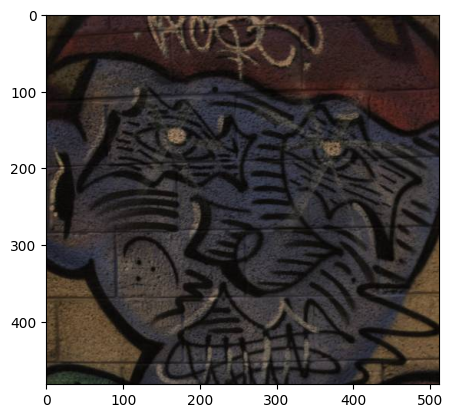

In [136]:
# image_path = "C:/Users/user/Desktop/HSI/dataset/ICASSP2024-SPGC/Hyper-Skin(RGB,VIS)/test/RGB_CIE/p012_neutral_front.jpg"
image_path = 'C:/Users/user/Desktop/Research/NTIRE_2022/NTIRE_2022/Test_RGB/ARAD_1K_0951.jpg'
image = Image.open(image_path)
plt.imshow(image)

In [137]:
image.size

(512, 482)

In [138]:
x, y = next(iter(train_loader))
x.shape, y.shape

(torch.Size([1, 3, 482, 512]), torch.Size([1, 31, 482, 512]))

In [139]:
x.shape

torch.Size([1, 3, 482, 512])

In [140]:
# Define transformations to convert and preprocess the image
preprocess = transforms.Compose([
    transforms.Resize((482, 512)),  # Resize the image to match your model's input size
    transforms.ToTensor(),  # Convert the image to a PyTorch tensor
])

# Apply the transformations to the image
# input_data = preprocess(image)
input_data = x

# Add an extra dimension to match the batch size (1 image in this case)
# input_data = input_data.unsqueeze(0)


with torch.no_grad():
    input_data = input_data.to(device)
    output = model(input_data)
output.shape

x shape input: torch.Size([1, 3, 482, 512])
x tensor([[[[0.0039, 0.0039, 0.0039,  ..., 0.7412, 0.7255, 0.7176],
          [0.0039, 0.0039, 0.0039,  ..., 0.7490, 0.7412, 0.7333],
          [0.0039, 0.0039, 0.0039,  ..., 0.7451, 0.7412, 0.7373],
          ...,
          [0.1451, 0.1412, 0.1373,  ..., 0.0196, 0.0157, 0.0118],
          [0.1373, 0.1294, 0.1216,  ..., 0.0392, 0.0353, 0.0353],
          [0.0980, 0.0902, 0.0824,  ..., 0.0392, 0.0353, 0.0353]],

         [[0.0039, 0.0039, 0.0039,  ..., 0.8353, 0.8196, 0.8118],
          [0.0039, 0.0039, 0.0039,  ..., 0.8431, 0.8353, 0.8275],
          [0.0039, 0.0039, 0.0039,  ..., 0.8392, 0.8353, 0.8314],
          ...,
          [0.1412, 0.1373, 0.1333,  ..., 0.0196, 0.0157, 0.0118],
          [0.1333, 0.1255, 0.1176,  ..., 0.0353, 0.0314, 0.0314],
          [0.0980, 0.0902, 0.0824,  ..., 0.0353, 0.0314, 0.0314]],

         [[0.0039, 0.0039, 0.0039,  ..., 0.9686, 0.9529, 0.9451],
          [0.0039, 0.0039, 0.0039,  ..., 0.9765, 0.9686, 0.960

tensor([[[[1.3577e+08, 1.3212e+08, 1.0936e+08,  ..., 1.0013e+10,
           9.7706e+09, 9.3772e+09],
          [1.3061e+08, 1.2441e+08, 1.0460e+08,  ..., 1.0117e+10,
           9.9648e+09, 9.5940e+09],
          [1.1606e+08, 1.0670e+08, 7.8581e+07,  ..., 1.0126e+10,
           9.8552e+09, 9.6272e+09],
          ...,
          [4.7184e+08, 4.5049e+08, 4.7160e+08,  ..., 2.6733e+08,
           2.9652e+08, 2.6547e+08],
          [5.1267e+08, 5.2449e+08, 5.3090e+08,  ..., 3.2179e+08,
           3.1621e+08, 2.8657e+08],
          [4.4784e+08, 4.7391e+08, 5.1841e+08,  ..., 3.6852e+08,
           3.6432e+08, 3.2975e+08]],

         [[1.4022e+08, 1.3693e+08, 9.1763e+07,  ..., 1.1646e+10,
           1.1292e+10, 1.0789e+10],
          [1.4009e+08, 1.3205e+08, 8.5330e+07,  ..., 1.1795e+10,
           1.1584e+10, 1.1122e+10],
          [1.0394e+08, 9.2382e+07, 9.4907e+07,  ..., 1.1913e+10,
           1.1575e+10, 1.1271e+10],
          ...,
          [6.7483e+08, 6.4102e+08, 6.1981e+08,  ..., 3.2246

torch.Size([1, 31, 482, 512])

In [126]:
input_data

tensor([[[[0.6282, 0.6282, 0.6282,  ..., 0.9167, 0.9167, 0.9167],
          [0.6282, 0.6282, 0.6282,  ..., 0.9231, 0.9167, 0.9167],
          [0.6282, 0.6282, 0.6282,  ..., 0.9231, 0.9231, 0.9167],
          ...,
          [0.1859, 0.1859, 0.1859,  ..., 0.0256, 0.0256, 0.0256],
          [0.1731, 0.1731, 0.1731,  ..., 0.0385, 0.0321, 0.0321],
          [0.1731, 0.1731, 0.1731,  ..., 0.0385, 0.0321, 0.0321]],

         [[0.6218, 0.6218, 0.6218,  ..., 0.8718, 0.8718, 0.8718],
          [0.6218, 0.6218, 0.6218,  ..., 0.8782, 0.8718, 0.8718],
          [0.6218, 0.6218, 0.6218,  ..., 0.8782, 0.8782, 0.8718],
          ...,
          [0.1410, 0.1410, 0.1410,  ..., 0.0192, 0.0192, 0.0192],
          [0.1282, 0.1282, 0.1282,  ..., 0.0321, 0.0256, 0.0256],
          [0.1282, 0.1282, 0.1282,  ..., 0.0321, 0.0256, 0.0256]],

         [[0.6090, 0.6090, 0.6090,  ..., 0.8077, 0.8077, 0.8077],
          [0.6090, 0.6090, 0.6090,  ..., 0.8141, 0.8077, 0.8077],
          [0.6090, 0.6090, 0.6090,  ..., 0

In [115]:
output

tensor([[[[0.0310, 0.0303, 0.0302,  ..., 0.0296, 0.0300, 0.0296],
          [0.0300, 0.0297, 0.0299,  ..., 0.0298, 0.0298, 0.0298],
          [0.0297, 0.0298, 0.0301,  ..., 0.0296, 0.0300, 0.0296],
          ...,
          [0.0298, 0.0298, 0.0298,  ..., 0.0298, 0.0298, 0.0298],
          [0.0300, 0.0296, 0.0300,  ..., 0.0296, 0.0300, 0.0296],
          [0.0298, 0.0298, 0.0298,  ..., 0.0298, 0.0298, 0.0298]],

         [[0.0332, 0.0338, 0.0329,  ..., 0.0338, 0.0331, 0.0338],
          [0.0331, 0.0330, 0.0330,  ..., 0.0331, 0.0328, 0.0331],
          [0.0332, 0.0346, 0.0329,  ..., 0.0337, 0.0331, 0.0337],
          ...,
          [0.0328, 0.0331, 0.0328,  ..., 0.0331, 0.0328, 0.0331],
          [0.0331, 0.0337, 0.0331,  ..., 0.0337, 0.0331, 0.0337],
          [0.0328, 0.0331, 0.0328,  ..., 0.0331, 0.0328, 0.0331]],

         [[0.0379, 0.0383, 0.0387,  ..., 0.0388, 0.0381, 0.0388],
          [0.0382, 0.0389, 0.0398,  ..., 0.0385, 0.0385, 0.0385],
          [0.0376, 0.0388, 0.0378,  ..., 0

In [116]:
output.max()

tensor(0.1388, device='cuda:0')

## save .mat file

In [46]:
import h5py

# Define the path to the .mat file where you want to save the output as a cube
output_mat_file = "rgb_1.mat"  # Provide the desired file path

# Assuming 'output' is a PyTorch tensor
output_np = output.cpu().numpy()  # Convert the CUDA tensor to a NumPy array

# Create the .mat file using h5py and save the data without rotation
with h5py.File(output_mat_file, 'w') as mat_file:
    # Save the data without rotation
    mat_file.create_dataset('cube', data=output_np[0])  # Assuming you want to save the first element


## load the output predicted .mat file

In [13]:
import h5py

# Define the path to the .mat file
mat_file_path = "rgb_1.mat"

# Open the .mat file using h5py
mat_contents = h5py.File(mat_file_path, 'r')

# Access the data by the key "cube"
cube_data = mat_contents["cube"]

# Convert the data to a NumPy array
output = cube_data[()]


## visualize the predictions

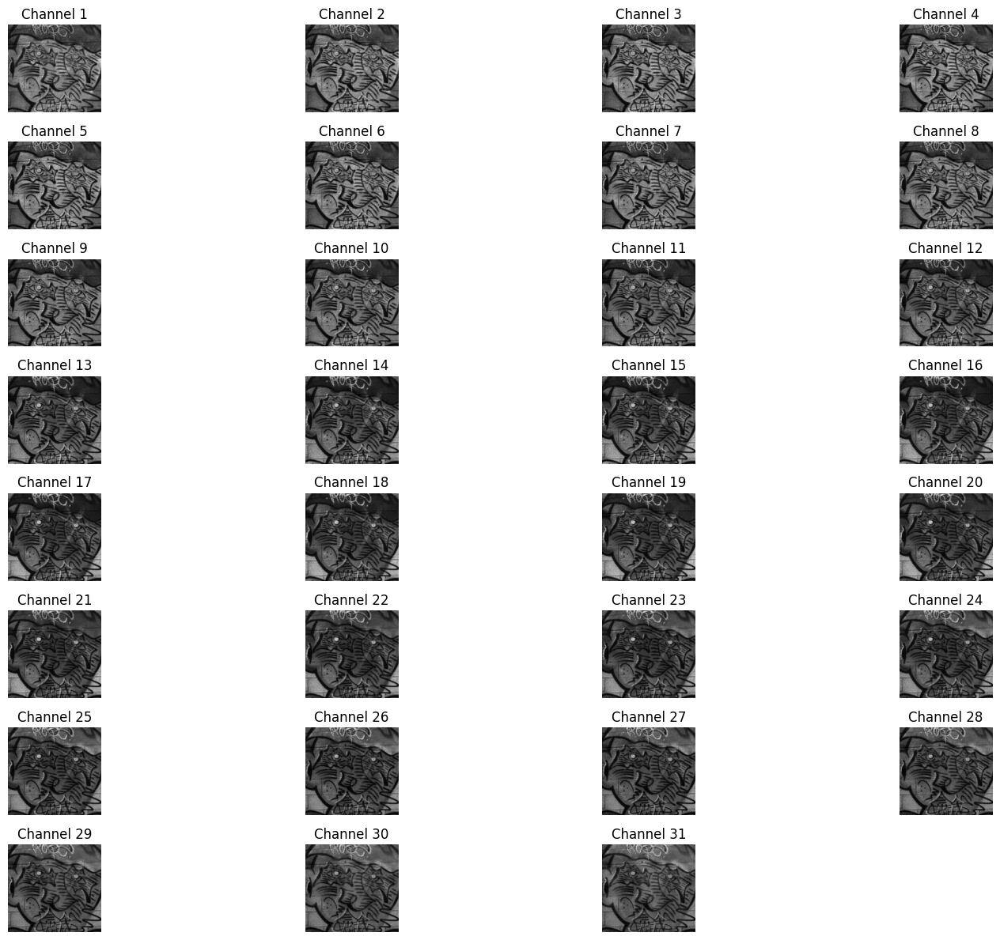

In [14]:
import matplotlib.pyplot as plt
import numpy as np

# Check if the output has a batch dimension and remove it if it exists
if len(output.shape) > 3:
    output = output[0]

num_channels = output.shape[0]
num_rows = 8  # You can adjust this based on your preference
num_cols = (num_channels - 1) // num_rows + 1  # Calculate the number of columns

plt.figure(figsize=(16, 12))  # You can adjust the figure size as needed

for i in range(num_channels):
    plt.subplot(num_rows, num_cols, i + 1)
    channel_data = output[i]  # Use the NumPy array directly
    plt.imshow(channel_data, cmap='gray')
    plt.title(f'Channel {i + 1}')
    plt.axis('off')

plt.tight_layout()
plt.show()


## bigger visulaization

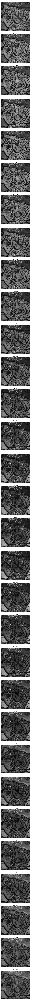

In [15]:
import h5py
import matplotlib.pyplot as plt
import numpy as np

# Define the path to the .mat file
mat_file_path = "rgb_1.mat"

# Open the .mat file using h5py
mat_contents = h5py.File(mat_file_path, 'r')

# Access the data by the key "cube"
cube_data = mat_contents["cube"]

# Convert the data to a NumPy array
output = cube_data[()]

# Check if the output has a batch dimension and remove it if it exists
if len(output.shape) > 3:
    output = output[0]

num_channels = output.shape[0]

# Set the figure size to display images in a single column
plt.figure(figsize=(6, 6 * num_channels))  # Adjust the height based on the number of channels

for i in range(num_channels):
    plt.subplot(num_channels, 1, i + 1)  # Display images in a single column
    channel_data = output[i]  # Convert the tensor to a NumPy array
#     channel_data = np.rot90(channel_data, k=3)  # Rotate counterclockwise by 90 degrees
    plt.imshow(channel_data, cmap='gray', origin='upper')  # Specify origin='upper' to prevent rotation
    plt.title(f'Channel {i + 1}')
    plt.axis('off')

plt.tight_layout()
plt.show()


## predictions on all test images

In [ ]:
# import os
# from PIL import Image
# import torch
# import torchvision.transforms as transforms
# import h5py
# import numpy as np

# model = HyperAttention(in_channels=4, out_channels=61).to(device).float()  # Adjust out_channels to match the target label size
# model.load_state_dict(torch.load('../Models/Aug_HyperAttention_fft_470e.pth'))
# model.eval() 

# input_folder = "../Dataset/ICASSP2024-SPGC/Hyper-Skin(MSI,NIR)/test/MSI_CIE" # Replace this with the path the input test folder
# output_folder = "./output/Aug_HyperAttention_fft_470e" # Replace with the path to your output folder

# # Make sure the output folder exists
# os.makedirs(output_folder, exist_ok=True)

# # Define the preprocessing transformation
# preprocess = transforms.Compose([
#     transforms.Resize((1024, 1024)),
#     transforms.ToTensor(),
# ])

# # Loop through all the image files in the input folder
# for filename in os.listdir(input_folder):
#     if filename.endswith(".mat"):  # Assuming you have .mat files for 4-channel input
#         # Load the .mat file
#         mat_file_path = os.path.join(input_folder, filename)

#         # Load the .mat file using h5py
#         mat_file = h5py.File(mat_file_path, 'r')

#         # Access and load the 'cube' dataset
#         input_data = mat_file['cube']  # Use the correct dataset name

#         # Convert the data to a NumPy array
#         input_data = np.array(input_data)

#         # Convert the NumPy array to a PyTorch tensor
#         input_data = torch.from_numpy(input_data)

#         # Add an extra dimension to match the batch size (1 image in this case)
#         input_data = input_data.unsqueeze(0)

#         # Ensure that the input data and model have the same data type
#         input_data = input_data.to(device).float()

#         with torch.no_grad():
#             # Get model predictions
#             output = model(input_data)

#         # Create the output .mat file
#         output_mat_file = os.path.join(output_folder, os.path.splitext(filename)[0] + ".mat")

#         # Convert the output to a NumPy array
#         output_np = output.cpu().numpy()  # Move the output to the CPU and then convert to NumPy

#         # Save the data as a .mat file
#         with h5py.File(output_mat_file, 'w') as mat_file:
#             mat_file.create_dataset('cube', data=output_np[0])

#         print(f"Processed {filename} and saved as {os.path.basename(output_mat_file)}")


## val sam calculation

In [16]:
# Assuming model is already loaded and in evaluation mode
model.eval()
criterion = SAMLoss()

# Define a variable to store the total loss
total_val_loss = 0.0

# Iterate over the validation loader
with torch.no_grad():
    for batch_idx, (x_val, y_val) in enumerate(valid_loader):
        x_val, y_val = x_val.to(device).float(), y_val.to(device).float()

        # Forward pass
        outputs_val = model(x_val)
        
        # You may need to apply the same interpolation to outputs_val as in the training loop
        outputs_val = torch.nn.functional.interpolate(outputs_val, size=(482, 512), mode='bilinear', align_corners=False)

        # Calculate the loss
        val_loss = criterion(outputs_val, y_val)

        # Accumulate the total loss
        total_val_loss += val_loss.item()

# Calculate the average validation loss
avg_val_loss = total_val_loss / len(valid_loader)

# Print or use the average validation loss as needed
print(f"Average Validation Loss: {avg_val_loss:.4f}")


x shape input: torch.Size([1, 3, 482, 512])
x tensor([[[[0.3611, 0.3611, 0.3611,  ..., 0.3889, 0.3889, 0.3889],
          [0.3611, 0.3611, 0.3611,  ..., 0.3981, 0.3889, 0.3889],
          [0.3611, 0.3611, 0.3611,  ..., 0.3981, 0.3981, 0.3889],
          ...,
          [0.1019, 0.0926, 0.0741,  ..., 0.2685, 0.2870, 0.2685],
          [0.0833, 0.0926, 0.1019,  ..., 0.2593, 0.2685, 0.2593],
          [0.0833, 0.0926, 0.1019,  ..., 0.2685, 0.2685, 0.2685]],

         [[0.4444, 0.4444, 0.4444,  ..., 0.5000, 0.5000, 0.5000],
          [0.4444, 0.4444, 0.4444,  ..., 0.5093, 0.5000, 0.5000],
          [0.4444, 0.4444, 0.4444,  ..., 0.5093, 0.5093, 0.5000],
          ...,
          [0.1019, 0.0926, 0.0741,  ..., 0.2593, 0.2500, 0.2593],
          [0.0833, 0.0926, 0.1019,  ..., 0.2222, 0.2222, 0.2222],
          [0.0833, 0.0926, 0.1019,  ..., 0.2222, 0.2222, 0.2222]],

         [[0.5833, 0.5833, 0.5833,  ..., 0.6481, 0.6481, 0.6481],
          [0.5833, 0.5833, 0.5833,  ..., 0.6574, 0.6481, 0.648

tensor([[[[1.5830e+10, 1.5977e+10, 1.6445e+10,  ..., 1.5957e+10,
           1.5452e+10, 1.4843e+10],
          [1.5802e+10, 1.5969e+10, 1.6407e+10,  ..., 1.6120e+10,
           1.5751e+10, 1.5188e+10],
          [1.5572e+10, 1.5706e+10, 1.5952e+10,  ..., 1.6328e+10,
           1.5944e+10, 1.5490e+10],
          ...,
          [6.5093e+08, 6.2615e+08, 5.8635e+08,  ..., 3.3252e+09,
           3.2691e+09, 3.1229e+09],
          [6.8048e+08, 6.7858e+08, 6.2450e+08,  ..., 3.1162e+09,
           2.8695e+09, 2.6661e+09],
          [5.7829e+08, 5.9071e+08, 5.5808e+08,  ..., 2.9597e+09,
           2.6356e+09, 2.4144e+09]],

         [[1.7829e+10, 1.8012e+10, 1.8436e+10,  ..., 1.8530e+10,
           1.8081e+10, 1.7295e+10],
          [1.7799e+10, 1.8019e+10, 1.8430e+10,  ..., 1.8755e+10,
           1.8511e+10, 1.7808e+10],
          [1.7510e+10, 1.7694e+10, 1.7903e+10,  ..., 1.9050e+10,
           1.8575e+10, 1.7995e+10],
          ...,
          [8.6831e+08, 8.3505e+08, 7.0432e+08,  ..., 4.3048

tensor([[[[3.1656e+10, 3.1665e+10, 3.1825e+10,  ..., 2.9654e+10,
           3.0082e+10, 2.9226e+10],
          [3.1608e+10, 3.1640e+10, 3.1656e+10,  ..., 2.9422e+10,
           2.9910e+10, 2.9191e+10],
          [3.1923e+10, 3.1762e+10, 3.1708e+10,  ..., 2.9592e+10,
           2.9136e+10, 2.8811e+10],
          ...,
          [1.0941e+09, 1.0612e+09, 1.1076e+09,  ..., 1.3651e+08,
           1.3578e+08, 1.4587e+08],
          [9.9260e+08, 9.6748e+08, 9.4046e+08,  ..., 1.3245e+08,
           1.3864e+08, 1.4525e+08],
          [9.0227e+08, 8.7971e+08, 8.2361e+08,  ..., 1.6044e+08,
           1.4728e+08, 1.5398e+08]],

         [[3.1916e+10, 3.1959e+10, 3.2607e+10,  ..., 3.2543e+10,
           3.2417e+10, 3.1348e+10],
          [3.1979e+10, 3.2067e+10, 3.2584e+10,  ..., 3.2310e+10,
           3.2238e+10, 3.1404e+10],
          [3.2419e+10, 3.2236e+10, 3.2535e+10,  ..., 3.1925e+10,
           3.2065e+10, 3.1671e+10],
          ...,
          [1.4179e+09, 1.3750e+09, 1.3815e+09,  ..., 1.4273

tensor([[[[3.2860e+09, 3.3801e+09, 3.3129e+09,  ..., 8.0598e+09,
           8.0916e+09, 7.7202e+09],
          [2.8800e+09, 2.8716e+09, 2.6444e+09,  ..., 8.2956e+09,
           8.4249e+09, 8.1043e+09],
          [2.1242e+09, 1.9284e+09, 2.0509e+09,  ..., 8.4500e+09,
           8.3800e+09, 8.2942e+09],
          ...,
          [1.3896e+09, 1.4301e+09, 1.5709e+09,  ..., 1.5275e+09,
           1.4962e+09, 1.4187e+09],
          [1.1758e+09, 1.2302e+09, 1.2952e+09,  ..., 1.3732e+09,
           1.3187e+09, 1.2455e+09],
          [9.7200e+08, 1.0185e+09, 1.0697e+09,  ..., 1.2028e+09,
           1.1637e+09, 1.1019e+09]],

         [[5.1645e+09, 5.3219e+09, 5.6634e+09,  ..., 1.0751e+10,
           1.0850e+10, 1.0353e+10],
          [4.6055e+09, 4.6074e+09, 4.7044e+09,  ..., 1.1030e+10,
           1.1290e+10, 1.0883e+10],
          [3.6901e+09, 3.4241e+09, 3.1255e+09,  ..., 1.1420e+10,
           1.1313e+10, 1.1250e+10],
          ...,
          [1.8354e+09, 1.8935e+09, 1.9552e+09,  ..., 2.1559

tensor([[[[4.3071e+08, 3.5488e+08, 2.6949e+08,  ..., 3.4728e+08,
           3.6640e+08, 3.6099e+08],
          [3.9101e+08, 3.3410e+08, 2.7192e+08,  ..., 3.3841e+08,
           3.5032e+08, 3.5120e+08],
          [3.2078e+08, 2.8964e+08, 2.3497e+08,  ..., 3.1730e+08,
           3.2052e+08, 3.2589e+08],
          ...,
          [3.8866e+09, 3.8647e+09, 3.8455e+09,  ..., 3.5126e+09,
           2.9253e+09, 2.5108e+09],
          [3.8129e+09, 3.8598e+09, 3.9877e+09,  ..., 3.3788e+09,
           2.9797e+09, 2.5480e+09],
          [3.4971e+09, 3.6201e+09, 3.7982e+09,  ..., 3.2048e+09,
           2.8143e+09, 2.4214e+09]],

         [[4.7746e+08, 3.7066e+08, 2.6576e+08,  ..., 3.9215e+08,
           3.9538e+08, 3.8809e+08],
          [4.1655e+08, 3.4214e+08, 2.7075e+08,  ..., 3.7980e+08,
           3.7288e+08, 3.7419e+08],
          [3.0923e+08, 2.6898e+08, 2.6105e+08,  ..., 3.4408e+08,
           3.6137e+08, 3.6806e+08],
          ...,
          [5.0050e+09, 4.9669e+09, 4.9111e+09,  ..., 4.4760

tensor([[[[3.4298e+09, 3.4765e+09, 3.5928e+09,  ..., 2.9395e+09,
           2.9246e+09, 2.8149e+09],
          [3.4408e+09, 3.4918e+09, 3.5956e+09,  ..., 2.9649e+09,
           2.9463e+09, 2.8399e+09],
          [3.3801e+09, 3.3972e+09, 3.4165e+09,  ..., 2.9802e+09,
           2.8558e+09, 2.7604e+09],
          ...,
          [1.6488e+09, 1.6526e+09, 1.7596e+09,  ..., 2.0946e+09,
           1.9552e+09, 1.8191e+09],
          [1.6267e+09, 1.6429e+09, 1.6589e+09,  ..., 2.0181e+09,
           1.8521e+09, 1.6768e+09],
          [1.5369e+09, 1.5691e+09, 1.6178e+09,  ..., 2.0400e+09,
           1.8176e+09, 1.6322e+09]],

         [[3.9899e+09, 4.0485e+09, 4.1317e+09,  ..., 3.5728e+09,
           3.5087e+09, 3.3699e+09],
          [4.0077e+09, 4.0757e+09, 4.1496e+09,  ..., 3.6066e+09,
           3.5433e+09, 3.4116e+09],
          [3.9149e+09, 3.9364e+09, 3.9795e+09,  ..., 3.5781e+09,
           3.4932e+09, 3.3731e+09],
          ...,
          [2.0744e+09, 2.0777e+09, 2.1015e+09,  ..., 2.6026

tensor([[[[4.4231e+09, 4.5151e+09, 4.3346e+09,  ..., 2.0033e+09,
           1.9731e+09, 1.8870e+09],
          [4.5265e+09, 4.6351e+09, 4.4213e+09,  ..., 1.9932e+09,
           1.9654e+09, 1.8838e+09],
          [4.5160e+09, 4.6251e+09, 4.5023e+09,  ..., 1.9349e+09,
           1.8342e+09, 1.7565e+09],
          ...,
          [2.6514e+09, 2.7730e+09, 2.9616e+09,  ..., 9.0761e+08,
           8.8035e+08, 7.7886e+08],
          [2.5226e+09, 2.6315e+09, 2.7635e+09,  ..., 9.0587e+08,
           9.2083e+08, 7.7947e+08],
          [2.1294e+09, 2.2541e+09, 2.3763e+09,  ..., 8.5085e+08,
           8.6413e+08, 7.2827e+08]],

         [[5.2986e+09, 5.4284e+09, 5.3206e+09,  ..., 2.4273e+09,
           2.3676e+09, 2.2532e+09],
          [5.4665e+09, 5.6200e+09, 5.4547e+09,  ..., 2.4164e+09,
           2.3642e+09, 2.2582e+09],
          [5.3374e+09, 5.4946e+09, 5.5053e+09,  ..., 2.3003e+09,
           2.2331e+09, 2.1333e+09],
          ...,
          [3.5528e+09, 3.7204e+09, 3.9419e+09,  ..., 1.1001

tensor([[[[6.4827e+09, 6.5077e+09, 6.6099e+09,  ..., 4.3074e+09,
           4.2204e+09, 4.0434e+09],
          [6.5133e+09, 6.5587e+09, 6.6084e+09,  ..., 4.3500e+09,
           4.2552e+09, 4.0894e+09],
          [6.5158e+09, 6.5350e+09, 6.6326e+09,  ..., 4.2921e+09,
           4.1707e+09, 4.0607e+09],
          ...,
          [9.4443e+08, 9.6019e+08, 1.0016e+09,  ..., 9.2486e+08,
           8.8105e+08, 8.0827e+08],
          [9.6305e+08, 9.7762e+08, 9.9103e+08,  ..., 9.4976e+08,
           8.8451e+08, 8.0173e+08],
          [8.9626e+08, 9.2851e+08, 9.7376e+08,  ..., 1.0006e+09,
           9.1963e+08, 8.2855e+08]],

         [[7.5442e+09, 7.5755e+09, 7.6506e+09,  ..., 5.1376e+09,
           5.0293e+09, 4.7982e+09],
          [7.5832e+09, 7.6517e+09, 7.6668e+09,  ..., 5.1984e+09,
           5.0859e+09, 4.8779e+09],
          [7.5868e+09, 7.6254e+09, 7.6239e+09,  ..., 5.0677e+09,
           4.9723e+09, 4.8363e+09],
          ...,
          [1.1408e+09, 1.1584e+09, 1.1542e+09,  ..., 1.0727

tensor([[[[3.3555e+08, 2.8186e+08, 4.7894e+08,  ..., 7.9565e+09,
           7.6378e+09, 7.2324e+09],
          [3.6116e+08, 3.2913e+08, 4.9233e+08,  ..., 8.1565e+09,
           7.8930e+09, 7.5368e+09],
          [5.5187e+08, 5.3748e+08, 5.2273e+08,  ..., 8.2724e+09,
           7.9721e+09, 7.8199e+09],
          ...,
          [8.2232e+08, 8.6505e+08, 9.3827e+08,  ..., 9.7820e+08,
           8.9567e+08, 8.3072e+08],
          [8.5418e+08, 8.9558e+08, 1.0073e+09,  ..., 9.9955e+08,
           9.1548e+08, 8.3509e+08],
          [8.4692e+08, 8.9255e+08, 1.0374e+09,  ..., 1.0453e+09,
           9.4271e+08, 8.5687e+08]],

         [[2.9173e+08, 2.1520e+08, 3.7353e+08,  ..., 9.9019e+09,
           9.5943e+09, 9.0562e+09],
          [3.2323e+08, 2.8450e+08, 3.8135e+08,  ..., 1.0179e+10,
           9.9568e+09, 9.5029e+09],
          [3.2522e+08, 3.0461e+08, 3.9949e+08,  ..., 1.0379e+10,
           1.0009e+10, 9.8232e+09],
          ...,
          [1.0066e+09, 1.0607e+09, 1.1215e+09,  ..., 1.1392

tensor([[[[3.7846e+09, 3.8717e+09, 3.7817e+09,  ..., 1.1089e+09,
           1.2122e+09, 1.1421e+09],
          [3.4305e+09, 3.4368e+09, 3.3525e+09,  ..., 1.1892e+09,
           1.2762e+09, 1.2271e+09],
          [2.5418e+09, 2.3202e+09, 2.4407e+09,  ..., 1.3681e+09,
           1.2655e+09, 1.2013e+09],
          ...,
          [3.4234e+09, 3.4162e+09, 3.2414e+09,  ..., 1.2364e+09,
           1.1354e+09, 1.0272e+09],
          [3.4826e+09, 3.5098e+09, 3.4353e+09,  ..., 1.1707e+09,
           1.0722e+09, 9.8092e+08],
          [3.2860e+09, 3.3768e+09, 3.3431e+09,  ..., 1.1171e+09,
           9.6701e+08, 8.7436e+08]],

         [[4.6898e+09, 4.8359e+09, 4.7910e+09,  ..., 1.4007e+09,
           1.4437e+09, 1.3399e+09],
          [4.2396e+09, 4.2404e+09, 4.1981e+09,  ..., 1.5035e+09,
           1.5232e+09, 1.4569e+09],
          [3.1012e+09, 2.8106e+09, 2.7794e+09,  ..., 1.6520e+09,
           1.6186e+09, 1.5303e+09],
          ...,
          [4.2290e+09, 4.2166e+09, 3.9747e+09,  ..., 1.5288

tensor([[[[1.5095e+10, 1.5259e+10, 1.5728e+10,  ..., 1.9415e+10,
           1.8698e+10, 1.7941e+10],
          [1.5093e+10, 1.5285e+10, 1.5751e+10,  ..., 1.9747e+10,
           1.9208e+10, 1.8510e+10],
          [1.4881e+10, 1.5050e+10, 1.5417e+10,  ..., 1.9794e+10,
           1.9468e+10, 1.9022e+10],
          ...,
          [5.0938e+08, 4.8719e+08, 4.4590e+08,  ..., 6.9825e+08,
           6.1106e+08, 5.3465e+08],
          [6.3457e+08, 6.1312e+08, 5.5373e+08,  ..., 7.5556e+08,
           6.6891e+08, 5.8744e+08],
          [6.1046e+08, 6.0055e+08, 5.6698e+08,  ..., 7.5287e+08,
           6.7028e+08, 5.9192e+08]],

         [[1.6978e+10, 1.7184e+10, 1.7576e+10,  ..., 2.2479e+10,
           2.1805e+10, 2.0820e+10],
          [1.6979e+10, 1.7234e+10, 1.7650e+10,  ..., 2.2939e+10,
           2.2530e+10, 2.1654e+10],
          [1.6739e+10, 1.6967e+10, 1.7331e+10,  ..., 2.3189e+10,
           2.2623e+10, 2.2053e+10],
          ...,
          [6.4234e+08, 6.0812e+08, 5.3350e+08,  ..., 8.7677

tensor([[[[2.1462e+09, 2.1853e+09, 2.1834e+09,  ..., 2.4222e+10,
           2.3376e+10, 2.2488e+10],
          [2.1877e+09, 2.2280e+09, 2.2088e+09,  ..., 2.4407e+10,
           2.3740e+10, 2.2905e+10],
          [2.1916e+09, 2.1900e+09, 2.2112e+09,  ..., 2.4908e+10,
           2.3976e+10, 2.3124e+10],
          ...,
          [7.2000e+08, 7.3545e+08, 7.8796e+08,  ..., 8.6711e+08,
           8.2803e+08, 7.5960e+08],
          [6.9087e+08, 6.9319e+08, 7.3558e+08,  ..., 1.1114e+09,
           9.1932e+08, 7.7279e+08],
          [6.0736e+08, 6.1141e+08, 6.6227e+08,  ..., 1.0615e+09,
           8.5932e+08, 7.1937e+08]],

         [[2.4927e+09, 2.5419e+09, 2.5430e+09,  ..., 2.7478e+10,
           2.6556e+10, 2.5400e+10],
          [2.5533e+09, 2.6042e+09, 2.5880e+09,  ..., 2.7754e+10,
           2.7098e+10, 2.6044e+10],
          [2.5649e+09, 2.5634e+09, 2.5935e+09,  ..., 2.8307e+10,
           2.7216e+10, 2.6119e+10],
          ...,
          [8.8805e+08, 9.0879e+08, 9.2518e+08,  ..., 1.1245

tensor([[[[5.3987e+09, 5.6505e+09, 5.3570e+09,  ..., 5.9652e+09,
           5.7939e+09, 5.5360e+09],
          [5.3501e+09, 5.5852e+09, 5.2515e+09,  ..., 6.0109e+09,
           5.8873e+09, 5.6522e+09],
          [5.2739e+09, 5.3286e+09, 5.0714e+09,  ..., 6.2334e+09,
           5.9513e+09, 5.7251e+09],
          ...,
          [1.1814e+10, 1.1634e+10, 1.1807e+10,  ..., 9.5587e+09,
           9.2520e+09, 8.5747e+09],
          [1.1507e+10, 1.1592e+10, 1.1797e+10,  ..., 1.0565e+10,
           9.8426e+09, 8.8318e+09],
          [1.0985e+10, 1.1178e+10, 1.1739e+10,  ..., 1.0730e+10,
           9.6736e+09, 8.5169e+09]],

         [[6.5131e+09, 6.8552e+09, 6.6460e+09,  ..., 7.3415e+09,
           7.1198e+09, 6.7851e+09],
          [6.4493e+09, 6.7667e+09, 6.5203e+09,  ..., 7.4114e+09,
           7.2648e+09, 6.9710e+09],
          [6.1913e+09, 6.2740e+09, 6.1601e+09,  ..., 7.5133e+09,
           7.3815e+09, 7.0969e+09],
          ...,
          [1.4590e+10, 1.4340e+10, 1.4274e+10,  ..., 1.1300

tensor([[[[2.6253e+09, 2.6914e+09, 2.5200e+09,  ..., 5.0386e+09,
           4.0220e+09, 3.3513e+09],
          [2.5300e+09, 2.4788e+09, 2.1839e+09,  ..., 4.8766e+09,
           3.8514e+09, 3.1765e+09],
          [2.3159e+09, 2.0394e+09, 2.1536e+09,  ..., 4.2966e+09,
           3.5929e+09, 3.0620e+09],
          ...,
          [3.2740e+09, 3.2522e+09, 3.2540e+09,  ..., 3.2356e+09,
           3.1657e+09, 3.0599e+09],
          [3.2960e+09, 3.3206e+09, 3.3551e+09,  ..., 3.2364e+09,
           3.0349e+09, 2.8484e+09],
          [3.1676e+09, 3.2591e+09, 3.3783e+09,  ..., 3.2366e+09,
           2.9598e+09, 2.7145e+09]],

         [[3.3308e+09, 3.4561e+09, 3.4141e+09,  ..., 6.9855e+09,
           5.4331e+09, 4.4889e+09],
          [3.2065e+09, 3.1353e+09, 2.9273e+09,  ..., 6.7714e+09,
           5.2457e+09, 4.2873e+09],
          [2.7491e+09, 2.3807e+09, 2.4108e+09,  ..., 6.1058e+09,
           4.8454e+09, 4.0857e+09],
          ...,
          [3.9786e+09, 3.9376e+09, 3.8564e+09,  ..., 3.9905

tensor([[[[8.4564e+08, 7.8742e+08, 7.8264e+08,  ..., 3.2371e+08,
           3.3759e+08, 3.3134e+08],
          [8.9661e+08, 8.4624e+08, 8.2123e+08,  ..., 2.9967e+08,
           3.1482e+08, 3.1297e+08],
          [1.0514e+09, 9.8399e+08, 8.9539e+08,  ..., 2.8274e+08,
           2.9275e+08, 2.9609e+08],
          ...,
          [4.4519e+09, 4.5171e+09, 4.6832e+09,  ..., 5.7317e+09,
           5.6344e+09, 5.3968e+09],
          [4.3654e+09, 4.4723e+09, 4.7275e+09,  ..., 5.5759e+09,
           5.2819e+09, 5.0112e+09],
          [4.0484e+09, 4.2234e+09, 4.6076e+09,  ..., 5.5344e+09,
           5.0984e+09, 4.7786e+09]],

         [[1.0072e+09, 9.3069e+08, 8.6369e+08,  ..., 3.6617e+08,
           3.6532e+08, 3.5475e+08],
          [1.0701e+09, 1.0085e+09, 9.1440e+08,  ..., 3.3673e+08,
           3.3457e+08, 3.3029e+08],
          [1.2099e+09, 1.1230e+09, 1.0463e+09,  ..., 2.8929e+08,
           3.1804e+08, 3.1883e+08],
          ...,
          [5.7631e+09, 5.8386e+09, 5.9631e+09,  ..., 7.0455

tensor([[[[9.3248e+09, 9.5320e+09, 9.9015e+09,  ..., 3.9125e+08,
           4.1614e+08, 3.9883e+08],
          [9.3607e+09, 9.5929e+09, 9.9989e+09,  ..., 4.0201e+08,
           4.3587e+08, 4.2189e+08],
          [9.1635e+09, 9.4058e+09, 9.7619e+09,  ..., 4.6859e+08,
           4.4631e+08, 4.3238e+08],
          ...,
          [3.0275e+09, 3.1341e+09, 2.9023e+09,  ..., 3.0392e+09,
           2.9988e+09, 2.8982e+09],
          [3.0045e+09, 3.1144e+09, 3.1345e+09,  ..., 2.9052e+09,
           2.7755e+09, 2.6682e+09],
          [2.8019e+09, 2.9758e+09, 2.9950e+09,  ..., 2.8689e+09,
           2.6758e+09, 2.5283e+09]],

         [[1.0313e+10, 1.0574e+10, 1.0906e+10,  ..., 4.3834e+08,
           4.3880e+08, 4.1641e+08],
          [1.0357e+10, 1.0659e+10, 1.1065e+10,  ..., 4.5095e+08,
           4.6350e+08, 4.4547e+08],
          [1.0164e+10, 1.0478e+10, 1.0886e+10,  ..., 4.9608e+08,
           4.8359e+08, 4.6548e+08],
          ...,
          [3.8471e+09, 3.9934e+09, 3.7707e+09,  ..., 3.7041

tensor([[[[3.7238e+10, 3.7168e+10, 3.7101e+10,  ..., 6.2799e+08,
           6.1125e+08, 6.0765e+08],
          [3.7124e+10, 3.7099e+10, 3.6947e+10,  ..., 5.2496e+08,
           5.5090e+08, 5.6577e+08],
          [3.7612e+10, 3.7371e+10, 3.7223e+10,  ..., 3.9561e+08,
           3.9555e+08, 4.1598e+08],
          ...,
          [3.5011e+09, 3.5128e+09, 3.2275e+09,  ..., 2.1873e+09,
           2.1090e+09, 2.0333e+09],
          [3.5971e+09, 3.7186e+09, 3.7656e+09,  ..., 2.1772e+09,
           2.0996e+09, 1.9838e+09],
          [3.4316e+09, 3.6581e+09, 3.7968e+09,  ..., 2.2200e+09,
           2.0760e+09, 1.9178e+09]],

         [[3.7756e+10, 3.7694e+10, 3.8234e+10,  ..., 7.6381e+08,
           7.2548e+08, 7.1545e+08],
          [3.7736e+10, 3.7757e+10, 3.8257e+10,  ..., 6.1941e+08,
           6.3769e+08, 6.5848e+08],
          [3.8353e+10, 3.8083e+10, 3.8352e+10,  ..., 4.1576e+08,
           4.5400e+08, 4.7735e+08],
          ...,
          [4.5536e+09, 4.5567e+09, 4.1714e+09,  ..., 2.5803

tensor([[[[    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          ...,
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000]],

         [[    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          ...,
          [    0.0000,     0.0000,     0.0000,  ...,     0.

dec1 shape: torch.Size([1, 31, 480, 512])
tensor([[[[1.5518e+09, 1.5639e+09, 1.3768e+09,  ..., 1.3952e+09,
           1.2641e+09, 1.3207e+09],
          [1.5837e+09, 1.5726e+09, 1.3427e+09,  ..., 1.3688e+09,
           1.1868e+09, 1.2882e+09],
          [1.6868e+09, 1.6218e+09, 1.3196e+09,  ..., 1.1084e+09,
           1.2733e+09, 1.4416e+09],
          ...,
          [8.3027e+08, 8.3529e+08, 8.7523e+08,  ..., 1.5089e+09,
           1.4955e+09, 1.4508e+09],
          [8.4894e+08, 8.5458e+08, 8.6635e+08,  ..., 1.4498e+09,
           1.3865e+09, 1.3562e+09],
          [8.1869e+08, 8.3901e+08, 8.6782e+08,  ..., 1.4093e+09,
           1.3423e+09, 1.2957e+09]],

         [[1.8735e+09, 1.9015e+09, 1.7324e+09,  ..., 1.4505e+09,
           1.4508e+09, 1.5182e+09],
          [1.9157e+09, 1.9063e+09, 1.6851e+09,  ..., 1.4266e+09,
           1.3297e+09, 1.4550e+09],
          [2.0331e+09, 1.9535e+09, 1.6612e+09,  ..., 1.2734e+09,
           1.6049e+09, 1.7970e+09],
          ...,
          [1.0036

tensor([[[[    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          ...,
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000]],

         [[    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          ...,
          [    0.0000,     0.0000,     0.0000,  ...,     0.

tensor([[[[4.3558e+08, 3.5267e+08, 2.7228e+08,  ..., 1.1896e+09,
           1.1182e+09, 1.0221e+09],
          [4.1205e+08, 3.3210e+08, 2.6135e+08,  ..., 1.0332e+09,
           1.0121e+09, 9.3416e+08],
          [3.4153e+08, 2.9918e+08, 2.1707e+08,  ..., 6.6883e+08,
           6.9372e+08, 7.1730e+08],
          ...,
          [5.7105e+08, 5.6886e+08, 5.8357e+08,  ..., 5.8630e+08,
           5.5269e+08, 5.2431e+08],
          [5.2221e+08, 5.3401e+08, 5.5476e+08,  ..., 5.7929e+08,
           5.2751e+08, 4.8673e+08],
          [4.9821e+08, 5.1348e+08, 5.4528e+08,  ..., 5.8839e+08,
           5.2551e+08, 4.7983e+08]],

         [[5.0748e+08, 3.9506e+08, 2.5950e+08,  ..., 1.5185e+09,
           1.3944e+09, 1.2607e+09],
          [4.7786e+08, 3.7206e+08, 2.4127e+08,  ..., 1.2974e+09,
           1.2422e+09, 1.1375e+09],
          [3.3842e+08, 2.8126e+08, 2.3284e+08,  ..., 7.0623e+08,
           8.2960e+08, 8.5927e+08],
          ...,
          [7.2068e+08, 7.1617e+08, 7.2009e+08,  ..., 6.8357

tensor([[[[3.1525e+09, 3.1631e+09, 2.9252e+09,  ..., 3.4963e+09,
           3.4271e+09, 3.2528e+09],
          [3.1902e+09, 3.1813e+09, 2.9242e+09,  ..., 3.4968e+09,
           3.4421e+09, 3.2677e+09],
          [3.2482e+09, 3.1592e+09, 2.9856e+09,  ..., 3.4671e+09,
           3.2761e+09, 3.1292e+09],
          ...,
          [1.5053e+09, 1.5241e+09, 1.5864e+09,  ..., 1.9103e+09,
           1.8707e+09, 1.7844e+09],
          [1.5509e+09, 1.5815e+09, 1.6086e+09,  ..., 1.8374e+09,
           1.7293e+09, 1.6268e+09],
          [1.5069e+09, 1.5650e+09, 1.6300e+09,  ..., 1.8251e+09,
           1.6717e+09, 1.5514e+09]],

         [[3.8298e+09, 3.8504e+09, 3.6546e+09,  ..., 4.0980e+09,
           3.9761e+09, 3.7468e+09],
          [3.8874e+09, 3.8749e+09, 3.6591e+09,  ..., 4.0989e+09,
           4.0079e+09, 3.7797e+09],
          [3.9575e+09, 3.8467e+09, 3.6306e+09,  ..., 4.0154e+09,
           3.8660e+09, 3.6759e+09],
          ...,
          [1.8939e+09, 1.9145e+09, 1.9273e+09,  ..., 2.3574

tensor([[[[6.3393e+09, 6.3904e+09, 6.1529e+09,  ..., 3.0757e+09,
           3.2550e+09, 3.1888e+09],
          [6.3808e+09, 6.4073e+09, 6.1403e+09,  ..., 3.3660e+09,
           3.5185e+09, 3.4967e+09],
          [6.4304e+09, 6.3310e+09, 6.1611e+09,  ..., 3.9093e+09,
           3.8858e+09, 3.9261e+09],
          ...,
          [3.8769e+09, 3.6296e+09, 3.1823e+09,  ..., 2.7231e+09,
           2.6821e+09, 2.5776e+09],
          [2.8784e+09, 2.6684e+09, 2.3503e+09,  ..., 2.5805e+09,
           2.4299e+09, 2.2805e+09],
          [2.2221e+09, 2.0233e+09, 1.7068e+09,  ..., 2.5491e+09,
           2.3166e+09, 2.1431e+09]],

         [[8.0798e+09, 8.1583e+09, 8.0604e+09,  ..., 4.1851e+09,
           4.4069e+09, 4.2902e+09],
          [8.1440e+09, 8.1756e+09, 8.0464e+09,  ..., 4.5869e+09,
           4.7518e+09, 4.7159e+09],
          [8.2367e+09, 8.1232e+09, 7.9284e+09,  ..., 5.0914e+09,
           5.3321e+09, 5.3801e+09],
          ...,
          [4.9295e+09, 4.6035e+09, 4.3831e+09,  ..., 3.3972

tensor([[[[3.1640e+09, 3.1724e+09, 2.8887e+09,  ..., 1.5894e+10,
           1.5509e+10, 1.4993e+10],
          [2.5368e+09, 2.4794e+09, 2.3385e+09,  ..., 1.6047e+10,
           1.5799e+10, 1.5337e+10],
          [1.9484e+09, 1.7252e+09, 1.6921e+09,  ..., 1.6263e+10,
           1.6006e+10, 1.5699e+10],
          ...,
          [5.4194e+08, 5.4905e+08, 6.4849e+08,  ..., 7.7224e+08,
           7.5492e+08, 7.2443e+08],
          [5.2297e+08, 5.4197e+08, 5.3400e+08,  ..., 7.6215e+08,
           7.0169e+08, 6.6881e+08],
          [4.9929e+08, 5.3181e+08, 5.2958e+08,  ..., 7.4076e+08,
           6.7766e+08, 6.3711e+08]],

         [[4.1006e+09, 4.1405e+09, 3.7712e+09,  ..., 1.8095e+10,
           1.7726e+10, 1.7058e+10],
          [3.2104e+09, 3.1337e+09, 2.9555e+09,  ..., 1.8315e+10,
           1.8143e+10, 1.7573e+10],
          [2.0145e+09, 1.7242e+09, 1.7991e+09,  ..., 1.8612e+10,
           1.8273e+10, 1.7877e+10],
          ...,
          [6.1181e+08, 6.1913e+08, 6.6633e+08,  ..., 8.8041

tensor([[[[1.2540e+10, 1.2731e+10, 1.2589e+10,  ..., 8.9321e+09,
           8.6450e+09, 8.1797e+09],
          [1.2689e+10, 1.2864e+10, 1.2607e+10,  ..., 9.1258e+09,
           8.9079e+09, 8.4909e+09],
          [1.3021e+10, 1.2949e+10, 1.2781e+10,  ..., 9.3395e+09,
           9.0322e+09, 8.8360e+09],
          ...,
          [1.0269e+09, 1.0604e+09, 1.0407e+09,  ..., 4.7854e+09,
           3.8941e+09, 3.3837e+09],
          [1.0335e+09, 1.0949e+09, 1.1677e+09,  ..., 3.9494e+09,
           3.8660e+09, 3.4152e+09],
          [1.0186e+09, 1.0976e+09, 1.1554e+09,  ..., 3.5632e+09,
           3.2142e+09, 2.8481e+09]],

         [[1.4782e+10, 1.5045e+10, 1.5032e+10,  ..., 1.0750e+10,
           1.0340e+10, 9.7250e+09],
          [1.5001e+10, 1.5239e+10, 1.5100e+10,  ..., 1.1020e+10,
           1.0717e+10, 1.0184e+10],
          [1.5480e+10, 1.5412e+10, 1.5107e+10,  ..., 1.1247e+10,
           1.0894e+10, 1.0648e+10],
          ...,
          [1.1389e+09, 1.1910e+09, 1.1249e+09,  ..., 6.3918

tensor([[[[2.5271e+09, 2.6821e+09, 2.4640e+09,  ..., 7.5222e+08,
           7.7066e+08, 7.7364e+08],
          [2.7053e+09, 2.8570e+09, 2.7362e+09,  ..., 7.8009e+08,
           7.9515e+08, 8.0368e+08],
          [2.9589e+09, 3.1080e+09, 3.1582e+09,  ..., 7.9609e+08,
           7.7629e+08, 7.6656e+08],
          ...,
          [5.9464e+08, 6.4704e+08, 6.7489e+08,  ..., 3.9469e+09,
           3.9479e+09, 3.9792e+09],
          [6.1601e+08, 6.5953e+08, 5.6064e+08,  ..., 3.8593e+09,
           3.5211e+09, 3.5773e+09],
          [6.4378e+08, 7.1087e+08, 6.6031e+08,  ..., 3.6857e+09,
           3.2983e+09, 3.2725e+09]],

         [[2.9471e+09, 3.1705e+09, 3.0056e+09,  ..., 8.3187e+08,
           8.4077e+08, 8.4408e+08],
          [3.2076e+09, 3.4225e+09, 3.3848e+09,  ..., 8.6157e+08,
           8.7378e+08, 8.8586e+08],
          [3.5250e+09, 3.7275e+09, 3.9755e+09,  ..., 8.8776e+08,
           8.7225e+08, 8.6061e+08],
          ...,
          [8.3898e+08, 8.9437e+08, 8.7561e+08,  ..., 4.6368

tensor([[[[1.5541e+09, 1.5334e+09, 2.0404e+09,  ..., 9.8672e+09,
           9.4615e+09, 9.0268e+09],
          [1.3788e+09, 1.3927e+09, 1.8032e+09,  ..., 1.0010e+10,
           9.6814e+09, 9.2782e+09],
          [1.1992e+09, 1.2610e+09, 1.4800e+09,  ..., 9.9755e+09,
           9.7869e+09, 9.5558e+09],
          ...,
          [1.8907e+09, 1.9736e+09, 1.8733e+09,  ..., 2.4366e+09,
           2.3600e+09, 2.2594e+09],
          [1.8800e+09, 1.9502e+09, 1.9528e+09,  ..., 2.2785e+09,
           2.1387e+09, 2.0818e+09],
          [1.7225e+09, 1.8343e+09, 1.8362e+09,  ..., 2.2011e+09,
           2.0388e+09, 1.9530e+09]],

         [[1.6204e+09, 1.5724e+09, 2.1398e+09,  ..., 1.1571e+10,
           1.1205e+10, 1.0640e+10],
          [1.3896e+09, 1.3996e+09, 1.8474e+09,  ..., 1.1767e+10,
           1.1521e+10, 1.1015e+10],
          [1.2556e+09, 1.3277e+09, 1.5485e+09,  ..., 1.1834e+10,
           1.1552e+10, 1.1257e+10],
          ...,
          [2.3829e+09, 2.4958e+09, 2.4356e+09,  ..., 2.9444

tensor([[[[2.5512e+09, 2.5407e+09, 2.5126e+09,  ..., 4.9263e+09,
           5.0424e+09, 5.0229e+09],
          [2.5471e+09, 2.5437e+09, 2.4942e+09,  ..., 5.0704e+09,
           5.1950e+09, 5.2280e+09],
          [2.5459e+09, 2.4934e+09, 2.5280e+09,  ..., 4.9491e+09,
           5.0759e+09, 5.1033e+09],
          ...,
          [1.3337e+09, 1.3439e+09, 1.4314e+09,  ..., 2.3290e+09,
           2.2338e+09, 2.1133e+09],
          [1.3161e+09, 1.3309e+09, 1.3470e+09,  ..., 2.2550e+09,
           2.0998e+09, 1.9467e+09],
          [1.2398e+09, 1.2668e+09, 1.2982e+09,  ..., 2.2580e+09,
           2.0407e+09, 1.8680e+09]],

         [[3.1988e+09, 3.1831e+09, 3.1811e+09,  ..., 6.7022e+09,
           6.9400e+09, 6.9114e+09],
          [3.1910e+09, 3.1863e+09, 3.1592e+09,  ..., 6.8965e+09,
           7.1329e+09, 7.1964e+09],
          [3.1778e+09, 3.1128e+09, 3.0640e+09,  ..., 6.7980e+09,
           6.8901e+09, 6.9263e+09],
          ...,
          [1.6756e+09, 1.6875e+09, 1.7339e+09,  ..., 2.9341

tensor([[[[9.9171e+08, 9.8494e+08, 1.0850e+09,  ..., 1.4158e+09,
           1.3922e+09, 1.3201e+09],
          [9.9841e+08, 9.9315e+08, 1.0814e+09,  ..., 1.4215e+09,
           1.4093e+09, 1.3469e+09],
          [1.0803e+09, 1.0359e+09, 1.1698e+09,  ..., 1.3990e+09,
           1.3182e+09, 1.2314e+09],
          ...,
          [3.1610e+09, 3.1712e+09, 3.5027e+09,  ..., 1.8558e+08,
           1.6733e+08, 1.7740e+08],
          [3.2371e+09, 3.2552e+09, 3.2882e+09,  ..., 1.8304e+08,
           1.7400e+08, 1.8878e+08],
          [3.1777e+09, 3.2423e+09, 3.2794e+09,  ..., 2.3249e+08,
           2.0398e+08, 2.1825e+08]],

         [[1.1334e+09, 1.1228e+09, 1.1954e+09,  ..., 1.7425e+09,
           1.6876e+09, 1.5900e+09],
          [1.1387e+09, 1.1324e+09, 1.1924e+09,  ..., 1.7464e+09,
           1.7115e+09, 1.6315e+09],
          [1.1696e+09, 1.1166e+09, 1.2652e+09,  ..., 1.6718e+09,
           1.6222e+09, 1.5074e+09],
          ...,
          [4.2470e+09, 4.2593e+09, 4.3126e+09,  ..., 1.8234

tensor([[[[1.5913e+09, 1.4705e+09, 1.3839e+09,  ..., 5.8244e+08,
           5.7429e+08, 5.4867e+08],
          [1.5801e+09, 1.4654e+09, 1.3593e+09,  ..., 6.1112e+08,
           6.0261e+08, 5.8629e+08],
          [1.4317e+09, 1.3530e+09, 1.3325e+09,  ..., 6.2019e+08,
           5.8550e+08, 5.6088e+08],
          ...,
          [1.9903e+09, 2.0201e+09, 2.1187e+09,  ..., 1.7303e+09,
           1.6272e+09, 1.5406e+09],
          [1.9106e+09, 1.9752e+09, 2.0658e+09,  ..., 1.7045e+09,
           1.5758e+09, 1.4498e+09],
          [1.8399e+09, 1.9180e+09, 2.0493e+09,  ..., 1.7526e+09,
           1.5928e+09, 1.4550e+09]],

         [[1.8510e+09, 1.6905e+09, 1.6386e+09,  ..., 6.7933e+08,
           6.8110e+08, 6.4446e+08],
          [1.8187e+09, 1.6697e+09, 1.5907e+09,  ..., 7.1065e+08,
           7.1731e+08, 6.9656e+08],
          [1.7361e+09, 1.6339e+09, 1.6069e+09,  ..., 7.3170e+08,
           7.1128e+08, 6.7941e+08],
          ...,
          [2.3900e+09, 2.4274e+09, 2.4797e+09,  ..., 2.0765

tensor([[[[5.0565e+09, 5.1003e+09, 5.1907e+09,  ..., 6.2378e+09,
           6.1033e+09, 5.8816e+09],
          [4.9781e+09, 5.0269e+09, 5.0676e+09,  ..., 6.2552e+09,
           6.1737e+09, 5.9687e+09],
          [4.8681e+09, 4.8477e+09, 4.7433e+09,  ..., 6.2814e+09,
           6.1160e+09, 5.9517e+09],
          ...,
          [7.1709e+08, 7.1619e+08, 7.9288e+08,  ..., 2.4893e+08,
           2.3785e+08, 2.2939e+08],
          [6.3506e+08, 6.4425e+08, 6.3337e+08,  ..., 2.7774e+08,
           2.6600e+08, 2.4788e+08],
          [5.9413e+08, 6.1406e+08, 5.9602e+08,  ..., 3.0291e+08,
           2.8943e+08, 2.7289e+08]],

         [[6.0090e+09, 6.0688e+09, 6.1232e+09,  ..., 7.4111e+09,
           7.2541e+09, 6.9699e+09],
          [5.8984e+09, 5.9688e+09, 5.9638e+09,  ..., 7.4325e+09,
           7.3578e+09, 7.1049e+09],
          [5.7166e+09, 5.7011e+09, 5.5618e+09,  ..., 7.4100e+09,
           7.3134e+09, 7.1064e+09],
          ...,
          [8.5794e+08, 8.5550e+08, 8.9217e+08,  ..., 2.8498

tensor([[[[4.5909e+08, 4.7693e+08, 4.4901e+08,  ..., 1.7360e+09,
           1.8481e+09, 1.7929e+09],
          [4.9207e+08, 5.0715e+08, 4.8302e+08,  ..., 1.7425e+09,
           1.8203e+09, 1.7787e+09],
          [5.2993e+08, 4.9724e+08, 5.1530e+08,  ..., 1.6412e+09,
           1.6174e+09, 1.5817e+09],
          ...,
          [1.6905e+09, 1.6904e+09, 1.7154e+09,  ..., 1.1066e+09,
           1.3277e+09, 1.3460e+09],
          [1.6938e+09, 1.7539e+09, 1.8789e+09,  ..., 8.6173e+08,
           9.8933e+08, 1.0108e+09],
          [1.6184e+09, 1.7180e+09, 1.8035e+09,  ..., 7.7632e+08,
           8.2955e+08, 8.3098e+08]],

         [[4.7027e+08, 4.9296e+08, 4.5793e+08,  ..., 2.0626e+09,
           2.2948e+09, 2.2157e+09],
          [5.1841e+08, 5.3661e+08, 5.0522e+08,  ..., 2.0692e+09,
           2.2538e+09, 2.1998e+09],
          [5.6570e+08, 5.2140e+08, 5.3501e+08,  ..., 1.9211e+09,
           2.0646e+09, 2.0209e+09],
          ...,
          [2.0132e+09, 2.0171e+09, 2.0005e+09,  ..., 1.2608

tensor([[[[5.3479e+09, 5.4281e+09, 5.1591e+09,  ..., 7.4250e+09,
           7.5812e+09, 7.5050e+09],
          [5.3557e+09, 5.4087e+09, 5.1223e+09,  ..., 7.5419e+09,
           7.6867e+09, 7.6493e+09],
          [5.2923e+09, 5.1756e+09, 4.9229e+09,  ..., 7.4076e+09,
           7.3863e+09, 7.3132e+09],
          ...,
          [5.7225e+09, 5.7462e+09, 5.6522e+09,  ..., 6.3231e+09,
           6.3007e+09, 6.0667e+09],
          [5.7173e+09, 5.7665e+09, 5.7455e+09,  ..., 6.0814e+09,
           5.7446e+09, 5.4602e+09],
          [5.2796e+09, 5.3940e+09, 5.4555e+09,  ..., 5.9680e+09,
           5.4755e+09, 5.1322e+09]],

         [[6.5932e+09, 6.7092e+09, 6.5418e+09,  ..., 9.3919e+09,
           9.6230e+09, 9.5243e+09],
          [6.6123e+09, 6.6802e+09, 6.4922e+09,  ..., 9.5563e+09,
           9.7679e+09, 9.7377e+09],
          [6.5371e+09, 6.3914e+09, 6.1451e+09,  ..., 9.3962e+09,
           9.3617e+09, 9.2644e+09],
          ...,
          [7.1261e+09, 7.1623e+09, 7.0398e+09,  ..., 7.9666

tensor([[[[1.1276e+09, 1.1389e+09, 1.2201e+09,  ..., 1.0370e+09,
           1.0346e+09, 1.0220e+09],
          [1.1036e+09, 1.1195e+09, 1.2194e+09,  ..., 1.0373e+09,
           1.0330e+09, 1.0242e+09],
          [1.0462e+09, 1.0604e+09, 1.1212e+09,  ..., 1.0480e+09,
           1.0510e+09, 1.0405e+09],
          ...,
          [7.8037e+08, 8.2699e+08, 8.8728e+08,  ..., 9.6000e+08,
           8.4058e+08, 7.5431e+08],
          [6.9244e+08, 7.5371e+08, 8.2916e+08,  ..., 9.4699e+08,
           8.1498e+08, 6.9954e+08],
          [5.9559e+08, 6.5723e+08, 7.6706e+08,  ..., 9.1948e+08,
           7.8611e+08, 6.7063e+08]],

         [[1.3645e+09, 1.3788e+09, 1.3926e+09,  ..., 1.3812e+09,
           1.3916e+09, 1.3759e+09],
          [1.3336e+09, 1.3558e+09, 1.3955e+09,  ..., 1.3795e+09,
           1.3887e+09, 1.3799e+09],
          [1.2567e+09, 1.2722e+09, 1.3411e+09,  ..., 1.3627e+09,
           1.3781e+09, 1.3669e+09],
          ...,
          [9.6149e+08, 1.0197e+09, 1.0531e+09,  ..., 1.1334

tensor([[[[1.2983e+09, 1.2666e+09, 1.4327e+09,  ..., 4.1510e+09,
           2.4933e+09, 1.7507e+09],
          [1.2382e+09, 1.1933e+09, 1.3262e+09,  ..., 3.4737e+09,
           1.9925e+09, 1.2681e+09],
          [1.2893e+09, 1.2325e+09, 1.1777e+09,  ..., 4.0007e+09,
           2.0473e+09, 2.1499e+09],
          ...,
          [3.5383e+08, 3.5523e+08, 3.1297e+08,  ..., 1.2973e+08,
           8.7044e+07, 6.9425e+07],
          [4.1150e+08, 4.1263e+08, 4.1884e+08,  ..., 1.2111e+08,
           1.2875e+08, 1.2775e+08],
          [4.5320e+08, 4.7288e+08, 5.0696e+08,  ..., 1.9355e+08,
           1.8095e+08, 1.8209e+08]],

         [[1.3992e+09, 1.3746e+09, 1.4936e+09,  ..., 6.2953e+09,
           3.6290e+09, 2.4027e+09],
          [1.3001e+09, 1.2533e+09, 1.3342e+09,  ..., 5.1627e+09,
           2.8896e+09, 1.6675e+09],
          [1.2660e+09, 1.2082e+09, 1.2508e+09,  ..., 4.4871e+09,
           1.8698e+09, 1.8628e+09],
          ...,
          [3.9397e+08, 3.9577e+08, 3.5392e+08,  ..., 1.3210

tensor([[[[1.7817e+09, 1.7853e+09, 1.6832e+09,  ..., 1.8951e+09,
           1.9036e+09, 1.8628e+09],
          [1.7567e+09, 1.7570e+09, 1.6417e+09,  ..., 1.9280e+09,
           1.9157e+09, 1.8812e+09],
          [1.7815e+09, 1.7451e+09, 1.6600e+09,  ..., 1.9276e+09,
           1.8957e+09, 1.8632e+09],
          ...,
          [1.9384e+09, 1.8582e+09, 1.8701e+09,  ..., 2.9090e+09,
           2.7527e+09, 2.5741e+09],
          [2.0105e+09, 1.9633e+09, 1.9072e+09,  ..., 3.1228e+09,
           2.8162e+09, 2.5419e+09],
          [1.8449e+09, 1.8382e+09, 1.7721e+09,  ..., 3.2118e+09,
           2.8527e+09, 2.5404e+09]],

         [[2.1700e+09, 2.1748e+09, 2.0768e+09,  ..., 2.2950e+09,
           2.3102e+09, 2.2570e+09],
          [2.1365e+09, 2.1358e+09, 2.0258e+09,  ..., 2.3388e+09,
           2.3270e+09, 2.2853e+09],
          [2.1399e+09, 2.0945e+09, 1.9731e+09,  ..., 2.3013e+09,
           2.3016e+09, 2.2582e+09],
          ...,
          [2.5542e+09, 2.4449e+09, 2.3651e+09,  ..., 3.5463

tensor([[[[5.8602e+09, 6.0154e+09, 5.2839e+09,  ..., 8.3230e+08,
           8.4775e+08, 7.9655e+08],
          [6.1142e+09, 6.1369e+09, 5.4284e+09,  ..., 8.6721e+08,
           8.6330e+08, 8.2677e+08],
          [6.2211e+09, 6.0885e+09, 5.4020e+09,  ..., 8.3370e+08,
           8.1071e+08, 7.5723e+08],
          ...,
          [1.9082e+09, 1.7935e+09, 1.6364e+09,  ..., 2.9560e+09,
           2.7448e+09, 2.4998e+09],
          [2.0377e+09, 2.0046e+09, 1.9527e+09,  ..., 2.6623e+09,
           2.2848e+09, 1.9361e+09],
          [2.0298e+09, 2.0684e+09, 2.0457e+09,  ..., 2.4116e+09,
           2.0071e+09, 1.6936e+09]],

         [[7.5955e+09, 7.8412e+09, 7.3347e+09,  ..., 1.0269e+09,
           1.0339e+09, 9.6135e+08],
          [8.0148e+09, 8.0273e+09, 7.5365e+09,  ..., 1.0599e+09,
           1.0431e+09, 9.9756e+08],
          [8.1509e+09, 7.9875e+09, 7.1499e+09,  ..., 1.0440e+09,
           1.0302e+09, 9.6564e+08],
          ...,
          [2.1555e+09, 1.9883e+09, 1.7608e+09,  ..., 3.7947

tensor([[[[    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          ...,
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000]],

         [[    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          ...,
          [    0.0000,     0.0000,     0.0000,  ...,     0.

dec1 shape: torch.Size([1, 31, 480, 512])
tensor([[[[6.3656e+09, 6.2241e+09, 5.7729e+09,  ..., 6.7086e+09,
           6.9248e+09, 6.8889e+09],
          [5.9627e+09, 5.7601e+09, 5.4065e+09,  ..., 6.7923e+09,
           6.9353e+09, 6.9252e+09],
          [5.5332e+09, 5.1204e+09, 4.2669e+09,  ..., 6.6125e+09,
           6.5479e+09, 6.4758e+09],
          ...,
          [3.1079e+09, 3.0586e+09, 2.8790e+09,  ..., 1.0621e+09,
           9.2168e+08, 8.3209e+08],
          [3.2415e+09, 3.3027e+09, 3.4251e+09,  ..., 1.0184e+09,
           9.3809e+08, 7.9098e+08],
          [3.1425e+09, 3.2846e+09, 3.4811e+09,  ..., 9.8500e+08,
           9.0404e+08, 7.7530e+08]],

         [[7.8280e+09, 7.6874e+09, 6.7060e+09,  ..., 9.1193e+09,
           9.6002e+09, 9.5536e+09],
          [7.3827e+09, 7.1235e+09, 6.2299e+09,  ..., 9.2340e+09,
           9.6060e+09, 9.6067e+09],
          [6.1682e+09, 5.6488e+09, 4.7934e+09,  ..., 8.8079e+09,
           8.9827e+09, 8.8692e+09],
          ...,
          [3.8705

tensor([[[[    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          ...,
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000]],

         [[    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          ...,
          [    0.0000,     0.0000,     0.0000,  ...,     0.

tensor([[[[    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          ...,
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000]],

         [[    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          ...,
          [    0.0000,     0.0000,     0.0000,  ...,     0.

tensor([[[[1.7729e+09, 1.4681e+09, 1.4392e+09,  ..., 3.0954e+10,
           3.1056e+10, 3.0063e+10],
          [1.5612e+09, 1.2022e+09, 1.1764e+09,  ..., 3.0899e+10,
           3.1073e+10, 3.0275e+10],
          [1.7204e+09, 1.3063e+09, 9.0151e+08,  ..., 3.1051e+10,
           3.0709e+10, 3.0325e+10],
          ...,
          [5.4041e+09, 5.5226e+09, 5.2040e+09,  ..., 1.4488e+09,
           1.3943e+09, 1.3505e+09],
          [5.3211e+09, 5.5671e+09, 5.5026e+09,  ..., 1.4894e+09,
           1.3805e+09, 1.3241e+09],
          [4.7530e+09, 5.0601e+09, 5.1759e+09,  ..., 1.4828e+09,
           1.3533e+09, 1.2750e+09]],

         [[2.2710e+09, 1.8704e+09, 1.7079e+09,  ..., 3.5932e+10,
           3.5815e+10, 3.4567e+10],
          [1.9689e+09, 1.4703e+09, 1.3119e+09,  ..., 3.5875e+10,
           3.5850e+10, 3.4934e+10],
          [1.9305e+09, 1.3807e+09, 9.7153e+08,  ..., 3.5757e+10,
           3.5652e+10, 3.5208e+10],
          ...,
          [7.0918e+09, 7.2675e+09, 6.9184e+09,  ..., 1.8677

tensor([[[[9.3181e+09, 9.3704e+09, 9.3779e+09,  ..., 8.5674e+09,
           8.2284e+09, 7.8056e+09],
          [9.2317e+09, 9.3068e+09, 9.2822e+09,  ..., 8.7765e+09,
           8.5230e+09, 8.1346e+09],
          [9.1815e+09, 9.1335e+09, 8.9679e+09,  ..., 8.8486e+09,
           8.5947e+09, 8.4022e+09],
          ...,
          [5.5417e+08, 5.9399e+08, 6.4836e+08,  ..., 1.6171e+09,
           1.4584e+09, 1.3363e+09],
          [6.9736e+08, 7.1296e+08, 8.6937e+08,  ..., 1.5530e+09,
           1.3862e+09, 1.2513e+09],
          [7.9490e+08, 8.4364e+08, 1.0601e+09,  ..., 1.3693e+09,
           1.2302e+09, 1.1240e+09]],

         [[1.1075e+10, 1.1153e+10, 1.1137e+10,  ..., 1.0375e+10,
           1.0026e+10, 9.4798e+09],
          [1.0944e+10, 1.1059e+10, 1.1012e+10,  ..., 1.0654e+10,
           1.0435e+10, 9.9509e+09],
          [1.0893e+10, 1.0858e+10, 1.0660e+10,  ..., 1.0822e+10,
           1.0457e+10, 1.0218e+10],
          ...,
          [5.9409e+08, 6.3693e+08, 6.8875e+08,  ..., 2.1127

tensor([[[[1.8461e+10, 1.8599e+10, 1.9097e+10,  ..., 1.1793e+10,
           1.1717e+10, 1.1254e+10],
          [1.8518e+10, 1.8694e+10, 1.9119e+10,  ..., 1.1991e+10,
           1.1855e+10, 1.1373e+10],
          [1.8640e+10, 1.8731e+10, 1.8882e+10,  ..., 1.2212e+10,
           1.1769e+10, 1.1122e+10],
          ...,
          [1.3767e+09, 1.3413e+09, 1.3946e+09,  ..., 4.3935e+08,
           4.3092e+08, 4.0381e+08],
          [1.8182e+09, 1.8441e+09, 1.9998e+09,  ..., 4.5500e+08,
           4.4844e+08, 4.2689e+08],
          [1.8445e+09, 1.9011e+09, 2.1171e+09,  ..., 5.3190e+08,
           5.1622e+08, 4.8561e+08]],

         [[2.0958e+10, 2.1140e+10, 2.1521e+10,  ..., 1.3212e+10,
           1.3077e+10, 1.2474e+10],
          [2.1037e+10, 2.1288e+10, 2.1591e+10,  ..., 1.3487e+10,
           1.3289e+10, 1.2660e+10],
          [2.1155e+10, 2.1306e+10, 2.1466e+10,  ..., 1.3731e+10,
           1.3310e+10, 1.2480e+10],
          ...,
          [1.7263e+09, 1.6740e+09, 1.6746e+09,  ..., 5.2936

tensor([[[[3.6210e+10, 3.6199e+10, 3.6437e+10,  ..., 3.0499e+10,
           3.0645e+10, 2.9709e+10],
          [3.6009e+10, 3.6040e+10, 3.6203e+10,  ..., 3.0446e+10,
           3.0642e+10, 2.9896e+10],
          [3.6459e+10, 3.6262e+10, 3.6048e+10,  ..., 3.0564e+10,
           3.0216e+10, 2.9849e+10],
          ...,
          [7.8718e+08, 8.0284e+08, 8.3944e+08,  ..., 1.1066e+09,
           1.0910e+09, 1.0559e+09],
          [7.9619e+08, 8.3193e+08, 8.5157e+08,  ..., 1.0691e+09,
           1.0273e+09, 1.0026e+09],
          [7.7491e+08, 8.3071e+08, 8.5411e+08,  ..., 1.0526e+09,
           9.9863e+08, 9.6356e+08]],

         [[3.7414e+10, 3.7431e+10, 3.7887e+10,  ..., 3.5515e+10,
           3.5478e+10, 3.4306e+10],
          [3.7263e+10, 3.7358e+10, 3.7779e+10,  ..., 3.5461e+10,
           3.5481e+10, 3.4635e+10],
          [3.7777e+10, 3.7563e+10, 3.7739e+10,  ..., 3.5335e+10,
           3.5196e+10, 3.4773e+10],
          ...,
          [8.8664e+08, 9.0446e+08, 9.0121e+08,  ..., 1.2717

tensor([[[[1.0055e+09, 9.3617e+08, 8.8541e+08,  ..., 7.3026e+08,
           7.2305e+08, 6.8205e+08],
          [1.0038e+09, 9.4284e+08, 8.8295e+08,  ..., 7.2570e+08,
           7.0985e+08, 6.7365e+08],
          [8.9847e+08, 8.4390e+08, 8.3018e+08,  ..., 7.2773e+08,
           6.5022e+08, 5.8972e+08],
          ...,
          [1.1648e+09, 1.1620e+09, 1.2834e+09,  ..., 1.2784e+09,
           1.3077e+09, 1.2614e+09],
          [1.0488e+09, 1.0814e+09, 1.1553e+09,  ..., 1.0647e+09,
           1.3694e+09, 1.2766e+09],
          [1.0276e+09, 1.0852e+09, 1.1681e+09,  ..., 9.9282e+08,
           1.2485e+09, 1.1060e+09]],

         [[1.0841e+09, 9.9318e+08, 9.4079e+08,  ..., 8.7962e+08,
           9.0343e+08, 8.4968e+08],
          [1.0829e+09, 1.0033e+09, 9.3225e+08,  ..., 8.6672e+08,
           8.7919e+08, 8.3363e+08],
          [1.0039e+09, 9.2705e+08, 8.7084e+08,  ..., 8.5694e+08,
           8.1828e+08, 7.3909e+08],
          ...,
          [1.4284e+09, 1.4290e+09, 1.3836e+09,  ..., 1.4595

tensor([[[[2.0946e+09, 2.1826e+09, 2.1352e+09,  ..., 4.4597e+09,
           4.1085e+09, 3.7873e+09],
          [2.0396e+09, 2.1231e+09, 2.0858e+09,  ..., 4.5737e+09,
           4.2139e+09, 3.9398e+09],
          [1.9316e+09, 1.9516e+09, 1.9473e+09,  ..., 4.5480e+09,
           4.0935e+09, 3.8220e+09],
          ...,
          [1.2815e+09, 1.3307e+09, 1.3578e+09,  ..., 1.8643e+09,
           1.7885e+09, 1.7295e+09],
          [1.3136e+09, 1.3596e+09, 1.4049e+09,  ..., 1.8598e+09,
           1.7702e+09, 1.6900e+09],
          [1.2549e+09, 1.3287e+09, 1.3837e+09,  ..., 1.8855e+09,
           1.7507e+09, 1.6381e+09]],

         [[2.4613e+09, 2.5915e+09, 2.4799e+09,  ..., 6.0523e+09,
           5.7071e+09, 5.2677e+09],
          [2.4147e+09, 2.5363e+09, 2.4198e+09,  ..., 6.2186e+09,
           5.8526e+09, 5.4956e+09],
          [2.1684e+09, 2.2006e+09, 2.2313e+09,  ..., 6.0312e+09,
           5.6572e+09, 5.2795e+09],
          ...,
          [1.5696e+09, 1.6318e+09, 1.6455e+09,  ..., 2.2516

tensor([[[[9.9638e+08, 9.5205e+08, 9.2527e+08,  ..., 3.9713e+09,
           3.9266e+09, 3.8322e+09],
          [9.7167e+08, 9.3014e+08, 9.0240e+08,  ..., 3.9694e+09,
           3.9581e+09, 3.9144e+09],
          [9.2371e+08, 8.8000e+08, 8.2133e+08,  ..., 3.9184e+09,
           3.8201e+09, 3.7583e+09],
          ...,
          [1.4198e+09, 1.6112e+09, 1.8618e+09,  ..., 2.6086e+09,
           2.5636e+09, 2.4795e+09],
          [1.1759e+09, 1.3636e+09, 1.3717e+09,  ..., 2.5215e+09,
           2.3589e+09, 2.2299e+09],
          [1.0278e+09, 1.2345e+09, 1.2418e+09,  ..., 2.4252e+09,
           2.2080e+09, 2.0427e+09]],

         [[1.1342e+09, 1.0746e+09, 1.0179e+09,  ..., 5.0484e+09,
           5.0051e+09, 4.8675e+09],
          [1.1052e+09, 1.0506e+09, 9.8956e+08,  ..., 5.0381e+09,
           5.0454e+09, 4.9956e+09],
          [1.0134e+09, 9.5370e+08, 9.1624e+08,  ..., 4.7045e+09,
           4.7964e+09, 4.7112e+09],
          ...,
          [1.6753e+09, 1.9091e+09, 2.1003e+09,  ..., 3.2883

tensor([[[[5.7284e+09, 5.7491e+09, 5.8596e+09,  ..., 6.6752e+09,
           6.4763e+09, 6.1907e+09],
          [5.7354e+09, 5.7723e+09, 5.8587e+09,  ..., 6.7606e+09,
           6.6037e+09, 6.3361e+09],
          [5.6955e+09, 5.7223e+09, 5.7897e+09,  ..., 6.8219e+09,
           6.6479e+09, 6.4572e+09],
          ...,
          [3.8775e+08, 3.7500e+08, 3.8313e+08,  ..., 2.4714e+08,
           2.5711e+08, 2.4982e+08],
          [4.1129e+08, 4.2233e+08, 4.2143e+08,  ..., 2.5476e+08,
           3.0186e+08, 2.9553e+08],
          [4.1267e+08, 4.3522e+08, 4.4505e+08,  ..., 3.1201e+08,
           3.5153e+08, 3.4772e+08]],

         [[6.6529e+09, 6.6773e+09, 6.7405e+09,  ..., 7.6305e+09,
           7.3819e+09, 7.0107e+09],
          [6.6590e+09, 6.7126e+09, 6.7527e+09,  ..., 7.7512e+09,
           7.5666e+09, 7.2280e+09],
          [6.6135e+09, 6.6595e+09, 6.6954e+09,  ..., 7.8170e+09,
           7.6103e+09, 7.3623e+09],
          ...,
          [4.6719e+08, 4.4745e+08, 4.4601e+08,  ..., 2.3682

tensor([[[[3.3197e+08, 2.8323e+08, 2.3577e+08,  ..., 5.1793e+09,
           4.3246e+09, 3.8505e+09],
          [2.9526e+08, 2.5563e+08, 2.3504e+08,  ..., 5.2062e+09,
           4.3588e+09, 3.8683e+09],
          [2.4321e+08, 2.2960e+08, 1.9613e+08,  ..., 4.7325e+09,
           3.9479e+09, 3.5409e+09],
          ...,
          [3.7970e+08, 3.8875e+08, 4.0982e+08,  ..., 2.8859e+09,
           3.6316e+09, 3.7191e+09],
          [4.4911e+08, 4.5981e+08, 5.6837e+08,  ..., 3.0747e+09,
           3.6242e+09, 3.3455e+09],
          [4.8562e+08, 5.1470e+08, 6.3825e+08,  ..., 2.8927e+09,
           2.9278e+09, 2.4617e+09]],

         [[3.6168e+08, 2.9318e+08, 2.1433e+08,  ..., 6.3466e+09,
           5.2390e+09, 4.6134e+09],
          [3.1059e+08, 2.5892e+08, 2.0731e+08,  ..., 6.4064e+09,
           5.2983e+09, 4.6504e+09],
          [2.1093e+08, 1.9216e+08, 1.9460e+08,  ..., 5.7700e+09,
           4.7760e+09, 4.2252e+09],
          ...,
          [4.3865e+08, 4.4394e+08, 4.6441e+08,  ..., 3.4334

tensor([[[[4.6907e+09, 4.7039e+09, 4.8103e+09,  ..., 4.3918e+09,
           4.1835e+09, 3.8964e+09],
          [4.7182e+09, 4.7411e+09, 4.8120e+09,  ..., 4.4840e+09,
           4.2820e+09, 4.0042e+09],
          [4.7302e+09, 4.7228e+09, 4.7386e+09,  ..., 4.5144e+09,
           4.2834e+09, 4.0725e+09],
          ...,
          [4.4752e+09, 4.5248e+09, 4.1710e+09,  ..., 6.0365e+09,
           5.8645e+09, 5.6127e+09],
          [4.3899e+09, 4.5072e+09, 4.6269e+09,  ..., 5.8439e+09,
           5.5422e+09, 5.2959e+09],
          [4.0806e+09, 4.3003e+09, 4.4843e+09,  ..., 5.7996e+09,
           5.3759e+09, 5.0566e+09]],

         [[5.4390e+09, 5.4565e+09, 5.5022e+09,  ..., 5.1546e+09,
           4.8517e+09, 4.4787e+09],
          [5.4717e+09, 5.5071e+09, 5.5137e+09,  ..., 5.2790e+09,
           4.9942e+09, 4.6367e+09],
          [5.4918e+09, 5.4929e+09, 5.4939e+09,  ..., 5.2893e+09,
           5.0498e+09, 4.7760e+09],
          ...,
          [5.7066e+09, 5.7656e+09, 5.4547e+09,  ..., 7.5121

In [18]:
import torch
import math

# Define the PSNR Loss Function
def psnr_loss(outputs, targets, max_pixel=1.0):  # Assuming normalized range [0, 1]
    mse = torch.mean((outputs - targets) ** 2)
    if mse == 0:
        # Prevent division by zero
        return float('inf')
    psnr = 20 * math.log10(max_pixel) - 10 * math.log10(mse)
    return psnr

# Function for min-max normalization
def min_max_normalize(tensor):
    min_val = tensor.min()
    max_val = tensor.max()
    normalized = (tensor - min_val) / (max_val - min_val)
    return normalized

# Assuming the model is already in evaluation mode and loaded
model.eval()

# Variable to store the total PSNR
total_psnr = 0.0

# Iterate over the validation data loader
with torch.no_grad():
    for batch_idx, (x_val, y_val) in enumerate(valid_loader):
        x_val, y_val = x_val.to(device).float(), y_val.to(device).float()

        # Forward pass to get the outputs
        outputs_val = model(x_val)

        # Resize the outputs to match the target dimensions if necessary
        outputs_val = torch.nn.functional.interpolate(outputs_val, size=(482, 512), mode='bilinear', align_corners=False)

        # Normalize the outputs
        outputs_val = min_max_normalize(outputs_val)
        y_val = min_max_normalize(y_val)  # Normalize targets if they are not already in [0, 1] range

        # Calculate PSNR for the current batch
        batch_psnr = psnr_loss(outputs_val, y_val)

        # Accumulate total PSNR
        total_psnr += batch_psnr

# Calculate the average PSNR over all batches
avg_psnr = total_psnr / len(valid_loader)

# Print or use the average PSNR as needed
print(f"Average PSNR on Validation Set: {avg_psnr:.4f}")


x shape input: torch.Size([1, 3, 482, 512])
x tensor([[[[0.3611, 0.3611, 0.3611,  ..., 0.3889, 0.3889, 0.3889],
          [0.3611, 0.3611, 0.3611,  ..., 0.3981, 0.3889, 0.3889],
          [0.3611, 0.3611, 0.3611,  ..., 0.3981, 0.3981, 0.3889],
          ...,
          [0.1019, 0.0926, 0.0741,  ..., 0.2685, 0.2870, 0.2685],
          [0.0833, 0.0926, 0.1019,  ..., 0.2593, 0.2685, 0.2593],
          [0.0833, 0.0926, 0.1019,  ..., 0.2685, 0.2685, 0.2685]],

         [[0.4444, 0.4444, 0.4444,  ..., 0.5000, 0.5000, 0.5000],
          [0.4444, 0.4444, 0.4444,  ..., 0.5093, 0.5000, 0.5000],
          [0.4444, 0.4444, 0.4444,  ..., 0.5093, 0.5093, 0.5000],
          ...,
          [0.1019, 0.0926, 0.0741,  ..., 0.2593, 0.2500, 0.2593],
          [0.0833, 0.0926, 0.1019,  ..., 0.2222, 0.2222, 0.2222],
          [0.0833, 0.0926, 0.1019,  ..., 0.2222, 0.2222, 0.2222]],

         [[0.5833, 0.5833, 0.5833,  ..., 0.6481, 0.6481, 0.6481],
          [0.5833, 0.5833, 0.5833,  ..., 0.6574, 0.6481, 0.648

x shape input: torch.Size([1, 3, 482, 512])
x tensor([[[[0.9882, 0.9922, 0.9922,  ..., 1.0000, 1.0000, 0.9961],
          [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
          [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
          ...,
          [0.0863, 0.0863, 0.0824,  ..., 0.0118, 0.0118, 0.0118],
          [0.0745, 0.0706, 0.0627,  ..., 0.0118, 0.0118, 0.0118],
          [0.0549, 0.0471, 0.0431,  ..., 0.0118, 0.0118, 0.0118]],

         [[0.9412, 0.9451, 0.9451,  ..., 0.9373, 0.9373, 0.9333],
          [0.9608, 0.9608, 0.9569,  ..., 0.9451, 0.9451, 0.9451],
          [0.9608, 0.9608, 0.9569,  ..., 0.9490, 0.9529, 0.9529],
          ...,
          [0.0824, 0.0824, 0.0784,  ..., 0.0118, 0.0118, 0.0118],
          [0.0667, 0.0667, 0.0549,  ..., 0.0118, 0.0118, 0.0118],
          [0.0471, 0.0392, 0.0353,  ..., 0.0118, 0.0118, 0.0118]],

         [[0.9412, 0.9451, 0.9451,  ..., 0.9373, 0.9412, 0.9373],
          [0.9608, 0.9608, 0.9569,  ..., 0.9451, 0.9490, 0.949

tensor([[[[3.1666e+10, 3.1674e+10, 3.1832e+10,  ..., 2.9650e+10,
           3.0078e+10, 2.9222e+10],
          [3.1619e+10, 3.1650e+10, 3.1664e+10,  ..., 2.9419e+10,
           2.9907e+10, 2.9187e+10],
          [3.1934e+10, 3.1772e+10, 3.1720e+10,  ..., 2.9590e+10,
           2.9134e+10, 2.8809e+10],
          ...,
          [1.0940e+09, 1.0610e+09, 1.1074e+09,  ..., 1.3650e+08,
           1.3573e+08, 1.4580e+08],
          [9.9289e+08, 9.6771e+08, 9.4040e+08,  ..., 1.3245e+08,
           1.3858e+08, 1.4517e+08],
          [9.0253e+08, 8.7994e+08, 8.2365e+08,  ..., 1.6039e+08,
           1.4717e+08, 1.5385e+08]],

         [[3.1919e+10, 3.1961e+10, 3.2610e+10,  ..., 3.2538e+10,
           3.2411e+10, 3.1343e+10],
          [3.1983e+10, 3.2070e+10, 3.2588e+10,  ..., 3.2306e+10,
           3.2233e+10, 3.1399e+10],
          [3.2425e+10, 3.2240e+10, 3.2538e+10,  ..., 3.1923e+10,
           3.2063e+10, 3.1669e+10],
          ...,
          [1.4179e+09, 1.3749e+09, 1.3813e+09,  ..., 1.4274

tensor([[[[3.2883e+09, 3.3830e+09, 3.3177e+09,  ..., 8.0692e+09,
           8.1022e+09, 7.7310e+09],
          [2.8823e+09, 2.8743e+09, 2.6485e+09,  ..., 8.3047e+09,
           8.4342e+09, 8.1136e+09],
          [2.1253e+09, 1.9299e+09, 2.0533e+09,  ..., 8.4596e+09,
           8.3890e+09, 8.3027e+09],
          ...,
          [1.3894e+09, 1.4301e+09, 1.5709e+09,  ..., 1.5272e+09,
           1.4959e+09, 1.4183e+09],
          [1.1757e+09, 1.2300e+09, 1.2947e+09,  ..., 1.3730e+09,
           1.3181e+09, 1.2451e+09],
          [9.7177e+08, 1.0182e+09, 1.0685e+09,  ..., 1.2023e+09,
           1.1629e+09, 1.1012e+09]],

         [[5.1662e+09, 5.3245e+09, 5.6685e+09,  ..., 1.0760e+10,
           1.0860e+10, 1.0363e+10],
          [4.6072e+09, 4.6095e+09, 4.7085e+09,  ..., 1.1039e+10,
           1.1298e+10, 1.0892e+10],
          [3.6911e+09, 3.4256e+09, 3.1272e+09,  ..., 1.1429e+10,
           1.1322e+10, 1.1258e+10],
          ...,
          [1.8354e+09, 1.8936e+09, 1.9555e+09,  ..., 2.1558

tensor([[[[4.3066e+08, 3.5478e+08, 2.6926e+08,  ..., 3.4744e+08,
           3.6655e+08, 3.6112e+08],
          [3.9149e+08, 3.3438e+08, 2.7182e+08,  ..., 3.3862e+08,
           3.5051e+08, 3.5132e+08],
          [3.2183e+08, 2.9018e+08, 2.3521e+08,  ..., 3.1757e+08,
           3.2100e+08, 3.2633e+08],
          ...,
          [3.8883e+09, 3.8671e+09, 3.8490e+09,  ..., 3.5122e+09,
           2.9268e+09, 2.5119e+09],
          [3.8130e+09, 3.8604e+09, 3.9887e+09,  ..., 3.3779e+09,
           2.9788e+09, 2.5471e+09],
          [3.4991e+09, 3.6221e+09, 3.8002e+09,  ..., 3.2047e+09,
           2.8140e+09, 2.4210e+09]],

         [[4.7727e+08, 3.7042e+08, 2.6538e+08,  ..., 3.9228e+08,
           3.9554e+08, 3.8823e+08],
          [4.1716e+08, 3.4244e+08, 2.7055e+08,  ..., 3.8004e+08,
           3.7309e+08, 3.7432e+08],
          [3.1061e+08, 2.6966e+08, 2.6088e+08,  ..., 3.4446e+08,
           3.6166e+08, 3.6831e+08],
          ...,
          [5.0049e+09, 4.9679e+09, 4.9148e+09,  ..., 4.4765

tensor([[[[3.4294e+09, 3.4761e+09, 3.5922e+09,  ..., 2.9392e+09,
           2.9246e+09, 2.8149e+09],
          [3.4404e+09, 3.4914e+09, 3.5951e+09,  ..., 2.9644e+09,
           2.9460e+09, 2.8397e+09],
          [3.3803e+09, 3.3977e+09, 3.4179e+09,  ..., 2.9796e+09,
           2.8564e+09, 2.7609e+09],
          ...,
          [1.6481e+09, 1.6521e+09, 1.7581e+09,  ..., 2.0931e+09,
           1.9538e+09, 1.8175e+09],
          [1.6259e+09, 1.6421e+09, 1.6584e+09,  ..., 2.0175e+09,
           1.8514e+09, 1.6763e+09],
          [1.5363e+09, 1.5684e+09, 1.6170e+09,  ..., 2.0392e+09,
           1.8172e+09, 1.6320e+09]],

         [[3.9896e+09, 4.0482e+09, 4.1312e+09,  ..., 3.5727e+09,
           3.5086e+09, 3.3699e+09],
          [4.0073e+09, 4.0752e+09, 4.1492e+09,  ..., 3.6061e+09,
           3.5429e+09, 3.4113e+09],
          [3.9157e+09, 3.9376e+09, 3.9812e+09,  ..., 3.5780e+09,
           3.4933e+09, 3.3732e+09],
          ...,
          [2.0727e+09, 2.0763e+09, 2.1002e+09,  ..., 2.6018

tensor([[[[4.4233e+09, 4.5153e+09, 4.3346e+09,  ..., 2.0033e+09,
           1.9732e+09, 1.8871e+09],
          [4.5268e+09, 4.6352e+09, 4.4213e+09,  ..., 1.9932e+09,
           1.9654e+09, 1.8838e+09],
          [4.5165e+09, 4.6252e+09, 4.5022e+09,  ..., 1.9350e+09,
           1.8343e+09, 1.7566e+09],
          ...,
          [2.6485e+09, 2.7703e+09, 2.9591e+09,  ..., 9.0710e+08,
           8.7980e+08, 7.7827e+08],
          [2.5199e+09, 2.6288e+09, 2.7610e+09,  ..., 9.0567e+08,
           9.2039e+08, 7.7912e+08],
          [2.1268e+09, 2.2515e+09, 2.3740e+09,  ..., 8.5003e+08,
           8.6321e+08, 7.2751e+08]],

         [[5.2993e+09, 5.4291e+09, 5.3210e+09,  ..., 2.4281e+09,
           2.3683e+09, 2.2539e+09],
          [5.4674e+09, 5.6208e+09, 5.4550e+09,  ..., 2.4172e+09,
           2.3648e+09, 2.2588e+09],
          [5.3380e+09, 5.4948e+09, 5.5053e+09,  ..., 2.3010e+09,
           2.2338e+09, 2.1339e+09],
          ...,
          [3.5496e+09, 3.7174e+09, 3.9392e+09,  ..., 1.0995

tensor([[[[6.4823e+09, 6.5077e+09, 6.6112e+09,  ..., 4.3113e+09,
           4.2244e+09, 4.0470e+09],
          [6.5137e+09, 6.5593e+09, 6.6102e+09,  ..., 4.3540e+09,
           4.2594e+09, 4.0932e+09],
          [6.5178e+09, 6.5370e+09, 6.6344e+09,  ..., 4.2968e+09,
           4.1752e+09, 4.0651e+09],
          ...,
          [9.4535e+08, 9.6100e+08, 1.0027e+09,  ..., 9.2502e+08,
           8.8150e+08, 8.0851e+08],
          [9.6398e+08, 9.7848e+08, 9.9202e+08,  ..., 9.5017e+08,
           8.8508e+08, 8.0222e+08],
          [8.9745e+08, 9.2973e+08, 9.7497e+08,  ..., 1.0016e+09,
           9.2060e+08, 8.2941e+08]],

         [[7.5436e+09, 7.5754e+09, 7.6520e+09,  ..., 5.1412e+09,
           5.0321e+09, 4.8006e+09],
          [7.5836e+09, 7.6524e+09, 7.6687e+09,  ..., 5.2022e+09,
           5.0890e+09, 4.8804e+09],
          [7.5889e+09, 7.6275e+09, 7.6264e+09,  ..., 5.0722e+09,
           4.9764e+09, 4.8403e+09],
          ...,
          [1.1416e+09, 1.1590e+09, 1.1550e+09,  ..., 1.0728

tensor([[[[3.3530e+08, 2.8157e+08, 4.7870e+08,  ..., 7.9572e+09,
           7.6368e+09, 7.2302e+09],
          [3.6069e+08, 3.2850e+08, 4.9195e+08,  ..., 8.1561e+09,
           7.8910e+09, 7.5332e+09],
          [5.4947e+08, 5.3494e+08, 5.2225e+08,  ..., 8.2728e+09,
           7.9711e+09, 7.8159e+09],
          ...,
          [8.2159e+08, 8.6439e+08, 9.3804e+08,  ..., 9.7842e+08,
           8.9558e+08, 8.3034e+08],
          [8.5336e+08, 8.9494e+08, 1.0069e+09,  ..., 9.9985e+08,
           9.1556e+08, 8.3496e+08],
          [8.4644e+08, 8.9227e+08, 1.0372e+09,  ..., 1.0455e+09,
           9.4276e+08, 8.5675e+08]],

         [[2.9152e+08, 2.1493e+08, 3.7334e+08,  ..., 9.9024e+09,
           9.5931e+09, 9.0533e+09],
          [3.2274e+08, 2.8376e+08, 3.8104e+08,  ..., 1.0178e+10,
           9.9541e+09, 9.4980e+09],
          [3.2485e+08, 3.0412e+08, 3.9906e+08,  ..., 1.0378e+10,
           1.0009e+10, 9.8187e+09],
          ...,
          [1.0061e+09, 1.0603e+09, 1.1214e+09,  ..., 1.1401

tensor([[[[3.7886e+09, 3.8758e+09, 3.7862e+09,  ..., 1.1094e+09,
           1.2127e+09, 1.1426e+09],
          [3.4338e+09, 3.4403e+09, 3.3563e+09,  ..., 1.1898e+09,
           1.2769e+09, 1.2277e+09],
          [2.5430e+09, 2.3206e+09, 2.4418e+09,  ..., 1.3689e+09,
           1.2662e+09, 1.2021e+09],
          ...,
          [3.4230e+09, 3.4157e+09, 3.2416e+09,  ..., 1.2373e+09,
           1.1366e+09, 1.0283e+09],
          [3.4824e+09, 3.5094e+09, 3.4352e+09,  ..., 1.1715e+09,
           1.0725e+09, 9.8125e+08],
          [3.2865e+09, 3.3771e+09, 3.3438e+09,  ..., 1.1181e+09,
           9.6765e+08, 8.7495e+08]],

         [[4.6941e+09, 4.8402e+09, 4.7958e+09,  ..., 1.4016e+09,
           1.4447e+09, 1.3408e+09],
          [4.2429e+09, 4.2438e+09, 4.2020e+09,  ..., 1.5045e+09,
           1.5244e+09, 1.4580e+09],
          [3.1025e+09, 2.8109e+09, 2.7806e+09,  ..., 1.6530e+09,
           1.6198e+09, 1.5315e+09],
          ...,
          [4.2285e+09, 4.2160e+09, 3.9750e+09,  ..., 1.5302

tensor([[[[1.5098e+10, 1.5262e+10, 1.5730e+10,  ..., 1.9423e+10,
           1.8704e+10, 1.7946e+10],
          [1.5095e+10, 1.5287e+10, 1.5753e+10,  ..., 1.9756e+10,
           1.9215e+10, 1.8516e+10],
          [1.4883e+10, 1.5053e+10, 1.5420e+10,  ..., 1.9804e+10,
           1.9478e+10, 1.9032e+10],
          ...,
          [5.0911e+08, 4.8694e+08, 4.4580e+08,  ..., 6.9805e+08,
           6.1084e+08, 5.3436e+08],
          [6.3449e+08, 6.1305e+08, 5.5371e+08,  ..., 7.5534e+08,
           6.6877e+08, 5.8722e+08],
          [6.1060e+08, 6.0072e+08, 5.6711e+08,  ..., 7.5294e+08,
           6.7029e+08, 5.9184e+08]],

         [[1.6980e+10, 1.7186e+10, 1.7577e+10,  ..., 2.2484e+10,
           2.1809e+10, 2.0824e+10],
          [1.6981e+10, 1.7236e+10, 1.7651e+10,  ..., 2.2945e+10,
           2.2536e+10, 2.1660e+10],
          [1.6740e+10, 1.6969e+10, 1.7333e+10,  ..., 2.3196e+10,
           2.2630e+10, 2.2060e+10],
          ...,
          [6.4161e+08, 6.0743e+08, 5.3311e+08,  ..., 8.7662

tensor([[[[2.1455e+09, 2.1848e+09, 2.1828e+09,  ..., 2.4220e+10,
           2.3371e+10, 2.2484e+10],
          [2.1873e+09, 2.2279e+09, 2.2085e+09,  ..., 2.4405e+10,
           2.3739e+10, 2.2904e+10],
          [2.1913e+09, 2.1894e+09, 2.2112e+09,  ..., 2.4910e+10,
           2.3976e+10, 2.3124e+10],
          ...,
          [7.2045e+08, 7.3603e+08, 7.8852e+08,  ..., 8.6521e+08,
           8.2781e+08, 7.5999e+08],
          [6.9157e+08, 6.9386e+08, 7.3589e+08,  ..., 1.1135e+09,
           9.2034e+08, 7.7357e+08],
          [6.0753e+08, 6.1156e+08, 6.6215e+08,  ..., 1.0634e+09,
           8.6026e+08, 7.2006e+08]],

         [[2.4916e+09, 2.5410e+09, 2.5419e+09,  ..., 2.7474e+10,
           2.6552e+10, 2.5396e+10],
          [2.5527e+09, 2.6038e+09, 2.5874e+09,  ..., 2.7751e+10,
           2.7097e+10, 2.6045e+10],
          [2.5641e+09, 2.5623e+09, 2.5934e+09,  ..., 2.8310e+10,
           2.7213e+10, 2.6115e+10],
          ...,
          [8.8881e+08, 9.0971e+08, 9.2565e+08,  ..., 1.1212

tensor([[[[5.3965e+09, 5.6483e+09, 5.3549e+09,  ..., 5.9669e+09,
           5.7960e+09, 5.5379e+09],
          [5.3479e+09, 5.5829e+09, 5.2493e+09,  ..., 6.0125e+09,
           5.8893e+09, 5.6541e+09],
          [5.2713e+09, 5.3262e+09, 5.0690e+09,  ..., 6.2349e+09,
           5.9527e+09, 5.7265e+09],
          ...,
          [1.1814e+10, 1.1634e+10, 1.1806e+10,  ..., 9.5596e+09,
           9.2532e+09, 8.5762e+09],
          [1.1506e+10, 1.1591e+10, 1.1797e+10,  ..., 1.0565e+10,
           9.8437e+09, 8.8338e+09],
          [1.0984e+10, 1.1177e+10, 1.1739e+10,  ..., 1.0730e+10,
           9.6741e+09, 8.5183e+09]],

         [[6.5103e+09, 6.8523e+09, 6.6433e+09,  ..., 7.3435e+09,
           7.1220e+09, 6.7872e+09],
          [6.4465e+09, 6.7636e+09, 6.5175e+09,  ..., 7.4133e+09,
           7.2668e+09, 6.9729e+09],
          [6.1867e+09, 6.2694e+09, 6.1564e+09,  ..., 7.5146e+09,
           7.3830e+09, 7.0985e+09],
          ...,
          [1.4588e+10, 1.4339e+10, 1.4273e+10,  ..., 1.1301

tensor([[[[2.6256e+09, 2.6918e+09, 2.5205e+09,  ..., 5.0424e+09,
           4.0232e+09, 3.3514e+09],
          [2.5302e+09, 2.4792e+09, 2.1843e+09,  ..., 4.8794e+09,
           3.8523e+09, 3.1766e+09],
          [2.3158e+09, 2.0394e+09, 2.1537e+09,  ..., 4.2983e+09,
           3.5937e+09, 3.0619e+09],
          ...,
          [3.2749e+09, 3.2530e+09, 3.2549e+09,  ..., 3.2339e+09,
           3.1646e+09, 3.0592e+09],
          [3.2966e+09, 3.3213e+09, 3.3560e+09,  ..., 3.2346e+09,
           3.0343e+09, 2.8479e+09],
          [3.1683e+09, 3.2600e+09, 3.3797e+09,  ..., 3.2357e+09,
           2.9594e+09, 2.7140e+09]],

         [[3.3313e+09, 3.4566e+09, 3.4148e+09,  ..., 6.9899e+09,
           5.4356e+09, 4.4900e+09],
          [3.2068e+09, 3.1357e+09, 2.9279e+09,  ..., 6.7742e+09,
           5.2478e+09, 4.2883e+09],
          [2.7490e+09, 2.3807e+09, 2.4109e+09,  ..., 6.1074e+09,
           4.8462e+09, 4.0855e+09],
          ...,
          [3.9794e+09, 3.9382e+09, 3.8575e+09,  ..., 3.9880

tensor([[[[8.4540e+08, 7.8732e+08, 7.8255e+08,  ..., 3.2394e+08,
           3.3811e+08, 3.3188e+08],
          [8.9636e+08, 8.4612e+08, 8.2114e+08,  ..., 2.9969e+08,
           3.1531e+08, 3.1352e+08],
          [1.0512e+09, 9.8393e+08, 8.9550e+08,  ..., 2.8266e+08,
           2.9276e+08, 2.9603e+08],
          ...,
          [4.4532e+09, 4.5187e+09, 4.6852e+09,  ..., 5.7326e+09,
           5.6351e+09, 5.3975e+09],
          [4.3661e+09, 4.4731e+09, 4.7290e+09,  ..., 5.5770e+09,
           5.2829e+09, 5.0121e+09],
          [4.0495e+09, 4.2247e+09, 4.6094e+09,  ..., 5.5355e+09,
           5.0993e+09, 4.7794e+09]],

         [[1.0070e+09, 9.3060e+08, 8.6365e+08,  ..., 3.6680e+08,
           3.6579e+08, 3.5522e+08],
          [1.0699e+09, 1.0083e+09, 9.1437e+08,  ..., 3.3705e+08,
           3.3499e+08, 3.3078e+08],
          [1.2097e+09, 1.1230e+09, 1.0464e+09,  ..., 2.8914e+08,
           3.1803e+08, 3.1871e+08],
          ...,
          [5.7640e+09, 5.8397e+09, 5.9649e+09,  ..., 7.0464

tensor([[[[9.3256e+09, 9.5325e+09, 9.9018e+09,  ..., 3.9115e+08,
           4.1616e+08, 3.9881e+08],
          [9.3612e+09, 9.5930e+09, 9.9984e+09,  ..., 4.0185e+08,
           4.3573e+08, 4.2171e+08],
          [9.1663e+09, 9.4083e+09, 9.7647e+09,  ..., 4.6802e+08,
           4.4630e+08, 4.3243e+08],
          ...,
          [3.0266e+09, 3.1336e+09, 2.9058e+09,  ..., 3.0373e+09,
           2.9962e+09, 2.8957e+09],
          [3.0030e+09, 3.1136e+09, 3.1343e+09,  ..., 2.9038e+09,
           2.7742e+09, 2.6671e+09],
          [2.8018e+09, 2.9759e+09, 2.9958e+09,  ..., 2.8676e+09,
           2.6752e+09, 2.5284e+09]],

         [[1.0314e+10, 1.0574e+10, 1.0905e+10,  ..., 4.3834e+08,
           4.3894e+08, 4.1650e+08],
          [1.0357e+10, 1.0658e+10, 1.1063e+10,  ..., 4.5086e+08,
           4.6342e+08, 4.4534e+08],
          [1.0166e+10, 1.0480e+10, 1.0887e+10,  ..., 4.9579e+08,
           4.8352e+08, 4.6549e+08],
          ...,
          [3.8437e+09, 3.9906e+09, 3.7722e+09,  ..., 3.7015

Encoder 2 - Output shape: torch.Size([1, 128, 120, 128])
Encoder 3 - Output shape: torch.Size([1, 256, 60, 64])
Encoder 4 - Output shape: torch.Size([1, 256, 60, 64])
tensor([[[[    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          ...,
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000]],

         [[    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
        

tensor([[[[    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          ...,
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000]],

         [[    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          ...,
          [    0.0000,     0.0000,     0.0000,  ...,     0.

tensor([[[[1.5515e+09, 1.5631e+09, 1.3751e+09,  ..., 1.3950e+09,
           1.2640e+09, 1.3206e+09],
          [1.5830e+09, 1.5714e+09, 1.3406e+09,  ..., 1.3686e+09,
           1.1868e+09, 1.2882e+09],
          [1.6853e+09, 1.6197e+09, 1.3182e+09,  ..., 1.1081e+09,
           1.2737e+09, 1.4422e+09],
          ...,
          [8.3105e+08, 8.3609e+08, 8.7564e+08,  ..., 1.5080e+09,
           1.4950e+09, 1.4506e+09],
          [8.4997e+08, 8.5557e+08, 8.6731e+08,  ..., 1.4487e+09,
           1.3858e+09, 1.3559e+09],
          [8.1968e+08, 8.4001e+08, 8.6881e+08,  ..., 1.4082e+09,
           1.3417e+09, 1.2953e+09]],

         [[1.8741e+09, 1.9015e+09, 1.7310e+09,  ..., 1.4503e+09,
           1.4508e+09, 1.5182e+09],
          [1.9157e+09, 1.9057e+09, 1.6831e+09,  ..., 1.4264e+09,
           1.3297e+09, 1.4550e+09],
          [2.0318e+09, 1.9512e+09, 1.6590e+09,  ..., 1.2734e+09,
           1.6051e+09, 1.7973e+09],
          ...,
          [1.0046e+09, 1.0094e+09, 9.9781e+08,  ..., 1.7649

tensor([[[[2.7976e+09, 2.5478e+09, 1.9596e+09,  ..., 5.4379e+09,
           5.2960e+09, 5.1446e+09],
          [3.3172e+09, 3.0058e+09, 2.4479e+09,  ..., 5.6864e+09,
           5.5513e+09, 5.4849e+09],
          [3.6919e+09, 3.4647e+09, 3.1884e+09,  ..., 5.6391e+09,
           5.6577e+09, 5.6517e+09],
          ...,
          [1.5411e+09, 1.6203e+09, 1.7351e+09,  ..., 1.5561e+09,
           1.5542e+09, 1.3991e+09],
          [1.5471e+09, 1.6671e+09, 1.7170e+09,  ..., 1.3816e+09,
           1.5006e+09, 1.4268e+09],
          [1.4815e+09, 1.6385e+09, 1.6574e+09,  ..., 1.2161e+09,
           1.2534e+09, 1.1664e+09]],

         [[3.4705e+09, 3.1413e+09, 2.6945e+09,  ..., 7.2762e+09,
           7.3277e+09, 7.1111e+09],
          [4.1574e+09, 3.7336e+09, 3.2692e+09,  ..., 7.6243e+09,
           7.6753e+09, 7.6057e+09],
          [5.0829e+09, 4.7430e+09, 4.2856e+09,  ..., 7.5924e+09,
           7.6541e+09, 7.6394e+09],
          ...,
          [1.8700e+09, 1.9763e+09, 2.0782e+09,  ..., 1.9208

tensor([[[[4.3534e+08, 3.5250e+08, 2.7196e+08,  ..., 1.1900e+09,
           1.1181e+09, 1.0219e+09],
          [4.1187e+08, 3.3201e+08, 2.6109e+08,  ..., 1.0338e+09,
           1.0123e+09, 9.3424e+08],
          [3.4142e+08, 2.9911e+08, 2.1699e+08,  ..., 6.6887e+08,
           6.9391e+08, 7.1704e+08],
          ...,
          [5.7069e+08, 5.6858e+08, 5.8346e+08,  ..., 5.8597e+08,
           5.5238e+08, 5.2403e+08],
          [5.2151e+08, 5.3334e+08, 5.5427e+08,  ..., 5.7885e+08,
           5.2709e+08, 4.8632e+08],
          [4.9733e+08, 5.1263e+08, 5.4463e+08,  ..., 5.8790e+08,
           5.2511e+08, 4.7946e+08]],

         [[5.0715e+08, 3.9484e+08, 2.5913e+08,  ..., 1.5190e+09,
           1.3944e+09, 1.2606e+09],
          [4.7763e+08, 3.7194e+08, 2.4098e+08,  ..., 1.2982e+09,
           1.2426e+09, 1.1377e+09],
          [3.3823e+08, 2.8112e+08, 2.3270e+08,  ..., 7.0655e+08,
           8.2998e+08, 8.5903e+08],
          ...,
          [7.1997e+08, 7.1555e+08, 7.1960e+08,  ..., 6.8321

tensor([[[[3.1525e+09, 3.1628e+09, 2.9244e+09,  ..., 3.5001e+09,
           3.4312e+09, 3.2569e+09],
          [3.1899e+09, 3.1808e+09, 2.9232e+09,  ..., 3.5005e+09,
           3.4463e+09, 3.2719e+09],
          [3.2479e+09, 3.1588e+09, 2.9847e+09,  ..., 3.4710e+09,
           3.2800e+09, 3.1332e+09],
          ...,
          [1.5040e+09, 1.5226e+09, 1.5845e+09,  ..., 1.9103e+09,
           1.8707e+09, 1.7845e+09],
          [1.5500e+09, 1.5805e+09, 1.6071e+09,  ..., 1.8376e+09,
           1.7296e+09, 1.6271e+09],
          [1.5064e+09, 1.5644e+09, 1.6289e+09,  ..., 1.8254e+09,
           1.6720e+09, 1.5517e+09]],

         [[3.8298e+09, 3.8501e+09, 3.6538e+09,  ..., 4.1019e+09,
           3.9802e+09, 3.7509e+09],
          [3.8873e+09, 3.8743e+09, 3.6581e+09,  ..., 4.1029e+09,
           4.0121e+09, 3.7838e+09],
          [3.9571e+09, 3.8461e+09, 3.6297e+09,  ..., 4.0193e+09,
           3.8700e+09, 3.6800e+09],
          ...,
          [1.8923e+09, 1.9127e+09, 1.9250e+09,  ..., 2.3571

tensor([[[[6.3387e+09, 6.3898e+09, 6.1513e+09,  ..., 3.0754e+09,
           3.2543e+09, 3.1885e+09],
          [6.3800e+09, 6.4065e+09, 6.1386e+09,  ..., 3.3685e+09,
           3.5202e+09, 3.4991e+09],
          [6.4291e+09, 6.3283e+09, 6.1588e+09,  ..., 3.9153e+09,
           3.8904e+09, 3.9314e+09],
          ...,
          [3.8844e+09, 3.6356e+09, 3.1861e+09,  ..., 2.7233e+09,
           2.6840e+09, 2.5803e+09],
          [2.8827e+09, 2.6724e+09, 2.3538e+09,  ..., 2.5792e+09,
           2.4294e+09, 2.2805e+09],
          [2.2239e+09, 2.0248e+09, 1.7077e+09,  ..., 2.5473e+09,
           2.3153e+09, 2.1421e+09]],

         [[8.0790e+09, 8.1576e+09, 8.0595e+09,  ..., 4.1826e+09,
           4.4042e+09, 4.2881e+09],
          [8.1431e+09, 8.1745e+09, 8.0455e+09,  ..., 4.5883e+09,
           4.7524e+09, 4.7175e+09],
          [8.2357e+09, 8.1205e+09, 7.9258e+09,  ..., 5.0962e+09,
           5.3384e+09, 5.3874e+09],
          ...,
          [4.9413e+09, 4.6133e+09, 4.3917e+09,  ..., 3.3970

tensor([[[[3.1632e+09, 3.1717e+09, 2.8879e+09,  ..., 1.5883e+10,
           1.5497e+10, 1.4981e+10],
          [2.5354e+09, 2.4780e+09, 2.3377e+09,  ..., 1.6036e+10,
           1.5789e+10, 1.5326e+10],
          [1.9484e+09, 1.7254e+09, 1.6923e+09,  ..., 1.6251e+10,
           1.5993e+10, 1.5686e+10],
          ...,
          [5.4198e+08, 5.4911e+08, 6.4839e+08,  ..., 7.7276e+08,
           7.5555e+08, 7.2509e+08],
          [5.2285e+08, 5.4188e+08, 5.3388e+08,  ..., 7.6262e+08,
           7.0236e+08, 6.6952e+08],
          [4.9920e+08, 5.3173e+08, 5.2954e+08,  ..., 7.4120e+08,
           6.7836e+08, 6.3782e+08]],

         [[4.1004e+09, 4.1405e+09, 3.7707e+09,  ..., 1.8090e+10,
           1.7721e+10, 1.7054e+10],
          [3.2094e+09, 3.1328e+09, 2.9550e+09,  ..., 1.8309e+10,
           1.8139e+10, 1.7569e+10],
          [2.0143e+09, 1.7242e+09, 1.7990e+09,  ..., 1.8603e+10,
           1.8266e+10, 1.7870e+10],
          ...,
          [6.1187e+08, 6.1921e+08, 6.6633e+08,  ..., 8.8102

tensor([[[[1.2542e+10, 1.2733e+10, 1.2590e+10,  ..., 8.9297e+09,
           8.6423e+09, 8.1768e+09],
          [1.2691e+10, 1.2866e+10, 1.2609e+10,  ..., 9.1234e+09,
           8.9049e+09, 8.4878e+09],
          [1.3024e+10, 1.2951e+10, 1.2783e+10,  ..., 9.3367e+09,
           9.0292e+09, 8.8328e+09],
          ...,
          [1.0268e+09, 1.0603e+09, 1.0406e+09,  ..., 4.7881e+09,
           3.8963e+09, 3.3853e+09],
          [1.0333e+09, 1.0947e+09, 1.1674e+09,  ..., 3.9488e+09,
           3.8660e+09, 3.4151e+09],
          [1.0183e+09, 1.0973e+09, 1.1551e+09,  ..., 3.5621e+09,
           3.2137e+09, 2.8479e+09]],

         [[1.4780e+10, 1.5044e+10, 1.5031e+10,  ..., 1.0747e+10,
           1.0336e+10, 9.7213e+09],
          [1.5001e+10, 1.5238e+10, 1.5099e+10,  ..., 1.1016e+10,
           1.0714e+10, 1.0180e+10],
          [1.5480e+10, 1.5412e+10, 1.5107e+10,  ..., 1.1243e+10,
           1.0890e+10, 1.0644e+10],
          ...,
          [1.1389e+09, 1.1910e+09, 1.1246e+09,  ..., 6.3951

tensor([[[[2.5235e+09, 2.6781e+09, 2.4596e+09,  ..., 7.5281e+08,
           7.7130e+08, 7.7424e+08],
          [2.7019e+09, 2.8531e+09, 2.7320e+09,  ..., 7.8060e+08,
           7.9583e+08, 8.0435e+08],
          [2.9554e+09, 3.1044e+09, 3.1543e+09,  ..., 7.9657e+08,
           7.7689e+08, 7.6719e+08],
          ...,
          [5.9393e+08, 6.4628e+08, 6.7388e+08,  ..., 3.9486e+09,
           3.9499e+09, 3.9813e+09],
          [6.1533e+08, 6.5876e+08, 5.6014e+08,  ..., 3.8594e+09,
           3.5221e+09, 3.5783e+09],
          [6.4340e+08, 7.1037e+08, 6.6004e+08,  ..., 3.6861e+09,
           3.2998e+09, 3.2739e+09]],

         [[2.9426e+09, 3.1654e+09, 2.9995e+09,  ..., 8.3253e+08,
           8.4154e+08, 8.4480e+08],
          [3.2032e+09, 3.4176e+09, 3.3791e+09,  ..., 8.6211e+08,
           8.7460e+08, 8.8668e+08],
          [3.5198e+09, 3.7221e+09, 3.9700e+09,  ..., 8.8832e+08,
           8.7295e+08, 8.6134e+08],
          ...,
          [8.3784e+08, 8.9317e+08, 8.7422e+08,  ..., 4.6375

tensor([[[[1.5554e+09, 1.5351e+09, 2.0437e+09,  ..., 9.8653e+09,
           9.4603e+09, 9.0256e+09],
          [1.3803e+09, 1.3947e+09, 1.8072e+09,  ..., 1.0008e+10,
           9.6794e+09, 9.2762e+09],
          [1.2007e+09, 1.2627e+09, 1.4846e+09,  ..., 9.9723e+09,
           9.7838e+09, 9.5528e+09],
          ...,
          [1.8905e+09, 1.9734e+09, 1.8730e+09,  ..., 2.4343e+09,
           2.3575e+09, 2.2571e+09],
          [1.8794e+09, 1.9497e+09, 1.9526e+09,  ..., 2.2758e+09,
           2.1361e+09, 2.0793e+09],
          [1.7218e+09, 1.8338e+09, 1.8359e+09,  ..., 2.1984e+09,
           2.0363e+09, 1.9507e+09]],

         [[1.6229e+09, 1.5756e+09, 2.1444e+09,  ..., 1.1570e+10,
           1.1206e+10, 1.0640e+10],
          [1.3926e+09, 1.4031e+09, 1.8529e+09,  ..., 1.1765e+10,
           1.1520e+10, 1.1014e+10],
          [1.2580e+09, 1.3304e+09, 1.5539e+09,  ..., 1.1832e+10,
           1.1550e+10, 1.1255e+10],
          ...,
          [2.3825e+09, 2.4954e+09, 2.4354e+09,  ..., 2.9421

tensor([[[[2.5516e+09, 2.5408e+09, 2.5126e+09,  ..., 4.9289e+09,
           5.0455e+09, 5.0265e+09],
          [2.5474e+09, 2.5438e+09, 2.4942e+09,  ..., 5.0730e+09,
           5.1985e+09, 5.2320e+09],
          [2.5459e+09, 2.4931e+09, 2.5273e+09,  ..., 4.9515e+09,
           5.0788e+09, 5.1069e+09],
          ...,
          [1.3340e+09, 1.3441e+09, 1.4315e+09,  ..., 2.3271e+09,
           2.2320e+09, 2.1116e+09],
          [1.3164e+09, 1.3311e+09, 1.3470e+09,  ..., 2.2531e+09,
           2.0982e+09, 1.9452e+09],
          [1.2402e+09, 1.2672e+09, 1.2983e+09,  ..., 2.2562e+09,
           2.0391e+09, 1.8665e+09]],

         [[3.1993e+09, 3.1832e+09, 3.1815e+09,  ..., 6.7045e+09,
           6.9431e+09, 6.9152e+09],
          [3.1914e+09, 3.1864e+09, 3.1593e+09,  ..., 6.8989e+09,
           7.1364e+09, 7.2006e+09],
          [3.1785e+09, 3.1131e+09, 3.0639e+09,  ..., 6.8009e+09,
           6.8934e+09, 6.9303e+09],
          ...,
          [1.6758e+09, 1.6875e+09, 1.7338e+09,  ..., 2.9318

tensor([[[[9.9145e+08, 9.8448e+08, 1.0844e+09,  ..., 1.4153e+09,
           1.3915e+09, 1.3194e+09],
          [9.9825e+08, 9.9280e+08, 1.0808e+09,  ..., 1.4210e+09,
           1.4087e+09, 1.3463e+09],
          [1.0804e+09, 1.0357e+09, 1.1691e+09,  ..., 1.3985e+09,
           1.3175e+09, 1.2307e+09],
          ...,
          [3.1584e+09, 3.1686e+09, 3.4994e+09,  ..., 1.8518e+08,
           1.6683e+08, 1.7696e+08],
          [3.2343e+09, 3.2525e+09, 3.2855e+09,  ..., 1.8285e+08,
           1.7372e+08, 1.8847e+08],
          [3.1751e+09, 3.2397e+09, 3.2768e+09,  ..., 2.3209e+08,
           2.0350e+08, 2.1778e+08]],

         [[1.1326e+09, 1.1218e+09, 1.1943e+09,  ..., 1.7415e+09,
           1.6866e+09, 1.5889e+09],
          [1.1381e+09, 1.1316e+09, 1.1912e+09,  ..., 1.7454e+09,
           1.7105e+09, 1.6305e+09],
          [1.1694e+09, 1.1161e+09, 1.2643e+09,  ..., 1.6710e+09,
           1.6212e+09, 1.5064e+09],
          ...,
          [4.2436e+09, 4.2559e+09, 4.3089e+09,  ..., 1.8211

tensor([[[[1.5906e+09, 1.4700e+09, 1.3837e+09,  ..., 5.8209e+08,
           5.7402e+08, 5.4850e+08],
          [1.5797e+09, 1.4651e+09, 1.3593e+09,  ..., 6.1084e+08,
           6.0243e+08, 5.8619e+08],
          [1.4314e+09, 1.3528e+09, 1.3323e+09,  ..., 6.2000e+08,
           5.8531e+08, 5.6071e+08],
          ...,
          [1.9888e+09, 2.0185e+09, 2.1174e+09,  ..., 1.7276e+09,
           1.6244e+09, 1.5379e+09],
          [1.9089e+09, 1.9735e+09, 2.0644e+09,  ..., 1.7017e+09,
           1.5729e+09, 1.4469e+09],
          [1.8383e+09, 1.9166e+09, 2.0480e+09,  ..., 1.7497e+09,
           1.5899e+09, 1.4521e+09]],

         [[1.8498e+09, 1.6897e+09, 1.6380e+09,  ..., 6.7880e+08,
           6.8063e+08, 6.4411e+08],
          [1.8180e+09, 1.6692e+09, 1.5905e+09,  ..., 7.1021e+08,
           7.1697e+08, 6.9633e+08],
          [1.7355e+09, 1.6335e+09, 1.6066e+09,  ..., 7.3138e+08,
           7.1084e+08, 6.7901e+08],
          ...,
          [2.3884e+09, 2.4258e+09, 2.4784e+09,  ..., 2.0736

tensor([[[[5.0576e+09, 5.1014e+09, 5.1913e+09,  ..., 6.2419e+09,
           6.1078e+09, 5.8865e+09],
          [4.9794e+09, 5.0281e+09, 5.0682e+09,  ..., 6.2591e+09,
           6.1777e+09, 5.9730e+09],
          [4.8700e+09, 4.8496e+09, 4.7448e+09,  ..., 6.2843e+09,
           6.1189e+09, 5.9546e+09],
          ...,
          [7.1707e+08, 7.1616e+08, 7.9285e+08,  ..., 2.4902e+08,
           2.3796e+08, 2.2930e+08],
          [6.3519e+08, 6.4430e+08, 6.3328e+08,  ..., 2.7769e+08,
           2.6600e+08, 2.4782e+08],
          [5.9426e+08, 6.1412e+08, 5.9589e+08,  ..., 3.0297e+08,
           2.8947e+08, 2.7287e+08]],

         [[6.0102e+09, 6.0698e+09, 6.1235e+09,  ..., 7.4141e+09,
           7.2575e+09, 6.9738e+09],
          [5.8998e+09, 5.9702e+09, 5.9642e+09,  ..., 7.4352e+09,
           7.3605e+09, 7.1080e+09],
          [5.7185e+09, 5.7030e+09, 5.5635e+09,  ..., 7.4120e+09,
           7.3150e+09, 7.1080e+09],
          ...,
          [8.5805e+08, 8.5559e+08, 8.9233e+08,  ..., 2.8525

tensor([[[[4.5880e+08, 4.7672e+08, 4.4873e+08,  ..., 1.7366e+09,
           1.8489e+09, 1.7938e+09],
          [4.9154e+08, 5.0669e+08, 4.8238e+08,  ..., 1.7431e+09,
           1.8213e+09, 1.7797e+09],
          [5.2923e+08, 4.9709e+08, 5.1461e+08,  ..., 1.6429e+09,
           1.6206e+09, 1.5849e+09],
          ...,
          [1.6911e+09, 1.6916e+09, 1.7175e+09,  ..., 1.1039e+09,
           1.3242e+09, 1.3424e+09],
          [1.6938e+09, 1.7542e+09, 1.8788e+09,  ..., 8.6134e+08,
           9.8844e+08, 1.0098e+09],
          [1.6190e+09, 1.7185e+09, 1.8039e+09,  ..., 7.7642e+08,
           8.2968e+08, 8.3111e+08]],

         [[4.6988e+08, 4.9266e+08, 4.5765e+08,  ..., 2.0631e+09,
           2.2955e+09, 2.2165e+09],
          [5.1768e+08, 5.3598e+08, 5.0443e+08,  ..., 2.0697e+09,
           2.2547e+09, 2.2006e+09],
          [5.6472e+08, 5.2115e+08, 5.3412e+08,  ..., 1.9233e+09,
           2.0675e+09, 2.0238e+09],
          ...,
          [2.0135e+09, 2.0179e+09, 2.0024e+09,  ..., 1.2590

dec1 shape: torch.Size([1, 31, 480, 512])
tensor([[[[5.3478e+09, 5.4279e+09, 5.1587e+09,  ..., 7.4234e+09,
           7.5801e+09, 7.5038e+09],
          [5.3561e+09, 5.4089e+09, 5.1223e+09,  ..., 7.5407e+09,
           7.6864e+09, 7.6489e+09],
          [5.2927e+09, 5.1758e+09, 4.9230e+09,  ..., 7.4062e+09,
           7.3851e+09, 7.3119e+09],
          ...,
          [5.7219e+09, 5.7456e+09, 5.6519e+09,  ..., 6.3256e+09,
           6.3031e+09, 6.0691e+09],
          [5.7166e+09, 5.7661e+09, 5.7447e+09,  ..., 6.0843e+09,
           5.7471e+09, 5.4627e+09],
          [5.2781e+09, 5.3926e+09, 5.4540e+09,  ..., 5.9699e+09,
           5.4769e+09, 5.1336e+09]],

         [[6.5938e+09, 6.7097e+09, 6.5421e+09,  ..., 9.3925e+09,
           9.6234e+09, 9.5246e+09],
          [6.6136e+09, 6.6813e+09, 6.4930e+09,  ..., 9.5573e+09,
           9.7696e+09, 9.7392e+09],
          [6.5389e+09, 6.3929e+09, 6.1463e+09,  ..., 9.3981e+09,
           9.3633e+09, 9.2659e+09],
          ...,
          [7.1267

tensor([[[[1.1286e+09, 1.1400e+09, 1.2214e+09,  ..., 1.0382e+09,
           1.0361e+09, 1.0236e+09],
          [1.1045e+09, 1.1206e+09, 1.2205e+09,  ..., 1.0385e+09,
           1.0344e+09, 1.0257e+09],
          [1.0467e+09, 1.0611e+09, 1.1219e+09,  ..., 1.0496e+09,
           1.0523e+09, 1.0419e+09],
          ...,
          [7.8091e+08, 8.2761e+08, 8.8796e+08,  ..., 9.6026e+08,
           8.4089e+08, 7.5473e+08],
          [6.9284e+08, 7.5420e+08, 8.2966e+08,  ..., 9.4753e+08,
           8.1579e+08, 7.0042e+08],
          [5.9603e+08, 6.5776e+08, 7.6763e+08,  ..., 9.2074e+08,
           7.8746e+08, 6.7192e+08]],

         [[1.3656e+09, 1.3800e+09, 1.3941e+09,  ..., 1.3826e+09,
           1.3935e+09, 1.3779e+09],
          [1.3345e+09, 1.3569e+09, 1.3968e+09,  ..., 1.3809e+09,
           1.3905e+09, 1.3818e+09],
          [1.2571e+09, 1.2728e+09, 1.3418e+09,  ..., 1.3643e+09,
           1.3795e+09, 1.3683e+09],
          ...,
          [9.6212e+08, 1.0205e+09, 1.0538e+09,  ..., 1.1337

tensor([[[[1.2991e+09, 1.2672e+09, 1.4339e+09,  ..., 4.1515e+09,
           2.4961e+09, 1.7541e+09],
          [1.2389e+09, 1.1940e+09, 1.3275e+09,  ..., 3.4747e+09,
           1.9955e+09, 1.2717e+09],
          [1.2910e+09, 1.2338e+09, 1.1789e+09,  ..., 4.0056e+09,
           2.0502e+09, 2.1532e+09],
          ...,
          [3.5418e+08, 3.5552e+08, 3.1321e+08,  ..., 1.2973e+08,
           8.7114e+07, 6.9503e+07],
          [4.1174e+08, 4.1297e+08, 4.1899e+08,  ..., 1.2114e+08,
           1.2885e+08, 1.2789e+08],
          [4.5327e+08, 4.7309e+08, 5.0690e+08,  ..., 1.9363e+08,
           1.8119e+08, 1.8241e+08]],

         [[1.3992e+09, 1.3744e+09, 1.4933e+09,  ..., 6.2950e+09,
           3.6306e+09, 2.4053e+09],
          [1.3001e+09, 1.2532e+09, 1.3340e+09,  ..., 5.1634e+09,
           2.8917e+09, 1.6705e+09],
          [1.2656e+09, 1.2071e+09, 1.2508e+09,  ..., 4.4890e+09,
           1.8723e+09, 1.8660e+09],
          ...,
          [3.9433e+08, 3.9604e+08, 3.5419e+08,  ..., 1.3207

tensor([[[[1.7816e+09, 1.7852e+09, 1.6829e+09,  ..., 1.8953e+09,
           1.9034e+09, 1.8623e+09],
          [1.7564e+09, 1.7569e+09, 1.6414e+09,  ..., 1.9282e+09,
           1.9156e+09, 1.8808e+09],
          [1.7811e+09, 1.7447e+09, 1.6594e+09,  ..., 1.9279e+09,
           1.8957e+09, 1.8631e+09],
          ...,
          [1.9392e+09, 1.8590e+09, 1.8707e+09,  ..., 2.9095e+09,
           2.7530e+09, 2.5741e+09],
          [2.0112e+09, 1.9641e+09, 1.9082e+09,  ..., 3.1235e+09,
           2.8167e+09, 2.5422e+09],
          [1.8454e+09, 1.8389e+09, 1.7728e+09,  ..., 3.2126e+09,
           2.8532e+09, 2.5407e+09]],

         [[2.1700e+09, 2.1749e+09, 2.0767e+09,  ..., 2.2950e+09,
           2.3097e+09, 2.2562e+09],
          [2.1363e+09, 2.1358e+09, 2.0256e+09,  ..., 2.3389e+09,
           2.3267e+09, 2.2847e+09],
          [2.1396e+09, 2.0942e+09, 1.9726e+09,  ..., 2.3015e+09,
           2.3015e+09, 2.2580e+09],
          ...,
          [2.5550e+09, 2.4456e+09, 2.3659e+09,  ..., 3.5473

tensor([[[[5.8636e+09, 6.0190e+09, 5.2873e+09,  ..., 8.3272e+08,
           8.4776e+08, 7.9652e+08],
          [6.1194e+09, 6.1413e+09, 5.4323e+09,  ..., 8.6793e+08,
           8.6356e+08, 8.2707e+08],
          [6.2266e+09, 6.0921e+09, 5.4058e+09,  ..., 8.3409e+08,
           8.1046e+08, 7.5666e+08],
          ...,
          [1.9068e+09, 1.7916e+09, 1.6338e+09,  ..., 2.9599e+09,
           2.7502e+09, 2.5064e+09],
          [2.0378e+09, 2.0045e+09, 1.9523e+09,  ..., 2.6656e+09,
           2.2870e+09, 1.9376e+09],
          [2.0302e+09, 2.0691e+09, 2.0461e+09,  ..., 2.4138e+09,
           2.0082e+09, 1.6942e+09]],

         [[7.5997e+09, 7.8458e+09, 7.3392e+09,  ..., 1.0274e+09,
           1.0339e+09, 9.6130e+08],
          [8.0220e+09, 8.0330e+09, 7.5420e+09,  ..., 1.0607e+09,
           1.0434e+09, 9.9796e+08],
          [8.1572e+09, 7.9917e+09, 7.1503e+09,  ..., 1.0446e+09,
           1.0305e+09, 9.6552e+08],
          ...,
          [2.1546e+09, 1.9867e+09, 1.7578e+09,  ..., 3.8020

tensor([[[[1.4240e+09, 1.4675e+09, 1.5661e+09,  ..., 9.9242e+08,
           1.0370e+09, 9.6720e+08],
          [1.3581e+09, 1.3876e+09, 1.4730e+09,  ..., 9.5710e+08,
           9.7925e+08, 9.3049e+08],
          [1.1645e+09, 1.2013e+09, 1.2622e+09,  ..., 7.9076e+08,
           7.9756e+08, 7.7551e+08],
          ...,
          [1.3769e+09, 1.4822e+09, 1.5358e+09,  ..., 2.6839e+09,
           2.5633e+09, 2.4844e+09],
          [1.3093e+09, 1.4214e+09, 1.5610e+09,  ..., 2.6611e+09,
           2.4779e+09, 2.3896e+09],
          [1.2131e+09, 1.3517e+09, 1.4792e+09,  ..., 2.5976e+09,
           2.3810e+09, 2.2451e+09]],

         [[1.5684e+09, 1.6320e+09, 1.7991e+09,  ..., 1.2371e+09,
           1.4162e+09, 1.3147e+09],
          [1.4747e+09, 1.5151e+09, 1.6718e+09,  ..., 1.1738e+09,
           1.3256e+09, 1.2593e+09],
          [1.3281e+09, 1.3797e+09, 1.4564e+09,  ..., 1.0023e+09,
           1.0645e+09, 1.0398e+09],
          ...,
          [1.6887e+09, 1.8270e+09, 1.8739e+09,  ..., 3.2764

tensor([[[[    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          ...,
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000]],

         [[    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          ...,
          [    0.0000,     0.0000,     0.0000,  ...,     0.

tensor([[[[    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          ...,
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000]],

         [[    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          ...,
          [    0.0000,     0.0000,     0.0000,  ...,     0.

tensor([[[[2.4545e+09, 2.4437e+09, 2.5604e+09,  ..., 6.5826e+08,
           6.7741e+08, 6.7103e+08],
          [2.4746e+09, 2.3891e+09, 2.5204e+09,  ..., 6.9071e+08,
           7.2145e+08, 7.2241e+08],
          [2.3021e+09, 2.1985e+09, 2.2161e+09,  ..., 8.0767e+08,
           7.3765e+08, 7.2408e+08],
          ...,
          [1.7073e+10, 1.6374e+10, 1.5010e+10,  ..., 6.5360e+08,
           4.9330e+08, 4.1555e+08],
          [1.6933e+10, 1.6320e+10, 1.6202e+10,  ..., 5.3736e+08,
           4.4149e+08, 3.9013e+08],
          [1.7014e+10, 1.6628e+10, 1.6802e+10,  ..., 4.2904e+08,
           3.7375e+08, 3.5012e+08]],

         [[2.7270e+09, 2.7501e+09, 3.0483e+09,  ..., 7.0631e+08,
           6.9905e+08, 6.9034e+08],
          [2.7417e+09, 2.6466e+09, 2.9690e+09,  ..., 7.4739e+08,
           7.5414e+08, 7.5567e+08],
          [2.7338e+09, 2.6044e+09, 2.6494e+09,  ..., 8.6930e+08,
           7.8470e+08, 7.6620e+08],
          ...,
          [1.6590e+10, 1.5607e+10, 1.4690e+10,  ..., 8.7600

tensor([[[[1.7741e+09, 1.4693e+09, 1.4401e+09,  ..., 3.0944e+10,
           3.1046e+10, 3.0055e+10],
          [1.5622e+09, 1.2032e+09, 1.1772e+09,  ..., 3.0889e+10,
           3.1063e+10, 3.0265e+10],
          [1.7209e+09, 1.3067e+09, 9.0205e+08,  ..., 3.1041e+10,
           3.0699e+10, 3.0315e+10],
          ...,
          [5.4038e+09, 5.5226e+09, 5.2039e+09,  ..., 1.4487e+09,
           1.3940e+09, 1.3501e+09],
          [5.3207e+09, 5.5669e+09, 5.5019e+09,  ..., 1.4890e+09,
           1.3800e+09, 1.3235e+09],
          [4.7524e+09, 5.0595e+09, 5.1750e+09,  ..., 1.4823e+09,
           1.3526e+09, 1.2743e+09]],

         [[2.2724e+09, 1.8719e+09, 1.7087e+09,  ..., 3.5920e+10,
           3.5803e+10, 3.4555e+10],
          [1.9701e+09, 1.4715e+09, 1.3126e+09,  ..., 3.5863e+10,
           3.5838e+10, 3.4922e+10],
          [1.9312e+09, 1.3811e+09, 9.7200e+08,  ..., 3.5745e+10,
           3.5639e+10, 3.5195e+10],
          ...,
          [7.0908e+09, 7.2671e+09, 6.9179e+09,  ..., 1.8675

tensor([[[[    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          ...,
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000]],

         [[    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          ...,
          [    0.0000,     0.0000,     0.0000,  ...,     0.

tensor([[[[     0.0000,      0.0000,      0.0000,  ...,      0.0000,
                0.0000,      0.0000],
          [     0.0000,      0.0000,      0.0000,  ...,      0.0000,
                0.0000,      0.0000],
          [     0.0000,      0.0000,      0.0000,  ...,      0.0000,
                0.0000,      0.0000],
          ...,
          [     0.0000,      0.0000,      0.0000,  ...,      0.0000,
                0.0000,      0.0000],
          [     0.0000,      0.0000,      0.0000,  ...,      0.0000,
                0.0000,      0.0000],
          [     0.0000,      0.0000,      0.0000,  ...,      0.0000,
                0.0000,      0.0000]],

         [[     0.0000,      0.0000,      0.0000,  ...,      0.0000,
                0.0000,      0.0000],
          [     0.0000,      0.0000,      0.0000,  ...,      0.0000,
                0.0000,      0.0000],
          [     0.0000,      0.0000,      0.0000,  ...,      0.0000,
                0.0000,      0.0000],
          ...,
     

tensor([[[[3.6221e+10, 3.6210e+10, 3.6448e+10,  ..., 3.0517e+10,
           3.0665e+10, 2.9730e+10],
          [3.6019e+10, 3.6050e+10, 3.6214e+10,  ..., 3.0463e+10,
           3.0660e+10, 2.9914e+10],
          [3.6470e+10, 3.6273e+10, 3.6058e+10,  ..., 3.0580e+10,
           3.0232e+10, 2.9865e+10],
          ...,
          [7.8758e+08, 8.0319e+08, 8.4032e+08,  ..., 1.1074e+09,
           1.0917e+09, 1.0566e+09],
          [7.9656e+08, 8.3231e+08, 8.5218e+08,  ..., 1.0700e+09,
           1.0281e+09, 1.0034e+09],
          [7.7541e+08, 8.3122e+08, 8.5488e+08,  ..., 1.0534e+09,
           9.9947e+08, 9.6445e+08]],

         [[3.7421e+10, 3.7437e+10, 3.7897e+10,  ..., 3.5533e+10,
           3.5497e+10, 3.4326e+10],
          [3.7269e+10, 3.7364e+10, 3.7789e+10,  ..., 3.5477e+10,
           3.5499e+10, 3.4653e+10],
          [3.7783e+10, 3.7569e+10, 3.7747e+10,  ..., 3.5350e+10,
           3.5212e+10, 3.4789e+10],
          ...,
          [8.8713e+08, 9.0485e+08, 9.0191e+08,  ..., 1.2726

tensor([[[[1.0054e+09, 9.3592e+08, 8.8522e+08,  ..., 7.3025e+08,
           7.2310e+08, 6.8209e+08],
          [1.0038e+09, 9.4267e+08, 8.8281e+08,  ..., 7.2559e+08,
           7.0984e+08, 6.7359e+08],
          [8.9843e+08, 8.4369e+08, 8.3015e+08,  ..., 7.2771e+08,
           6.5020e+08, 5.8967e+08],
          ...,
          [1.1649e+09, 1.1618e+09, 1.2827e+09,  ..., 1.2780e+09,
           1.3076e+09, 1.2615e+09],
          [1.0487e+09, 1.0809e+09, 1.1544e+09,  ..., 1.0644e+09,
           1.3688e+09, 1.2762e+09],
          [1.0278e+09, 1.0851e+09, 1.1675e+09,  ..., 9.9262e+08,
           1.2480e+09, 1.1056e+09]],

         [[1.0839e+09, 9.9290e+08, 9.4061e+08,  ..., 8.7971e+08,
           9.0358e+08, 8.4983e+08],
          [1.0829e+09, 1.0031e+09, 9.3214e+08,  ..., 8.6666e+08,
           8.7925e+08, 8.3363e+08],
          [1.0041e+09, 9.2698e+08, 8.7077e+08,  ..., 8.5689e+08,
           8.1827e+08, 7.3905e+08],
          ...,
          [1.4281e+09, 1.4282e+09, 1.3824e+09,  ..., 1.4589

tensor([[[[2.0897e+09, 2.1774e+09, 2.1298e+09,  ..., 4.4586e+09,
           4.1051e+09, 3.7825e+09],
          [2.0345e+09, 2.1177e+09, 2.0804e+09,  ..., 4.5725e+09,
           4.2106e+09, 3.9351e+09],
          [1.9259e+09, 1.9458e+09, 1.9418e+09,  ..., 4.5460e+09,
           4.0902e+09, 3.8183e+09],
          ...,
          [1.2806e+09, 1.3299e+09, 1.3570e+09,  ..., 1.8635e+09,
           1.7873e+09, 1.7281e+09],
          [1.3130e+09, 1.3589e+09, 1.4044e+09,  ..., 1.8592e+09,
           1.7692e+09, 1.6891e+09],
          [1.2544e+09, 1.3281e+09, 1.3834e+09,  ..., 1.8848e+09,
           1.7498e+09, 1.6372e+09]],

         [[2.4566e+09, 2.5863e+09, 2.4747e+09,  ..., 6.0510e+09,
           5.7042e+09, 5.2628e+09],
          [2.4098e+09, 2.5309e+09, 2.4146e+09,  ..., 6.2172e+09,
           5.8500e+09, 5.4911e+09],
          [2.1632e+09, 2.1954e+09, 2.2262e+09,  ..., 6.0292e+09,
           5.6537e+09, 5.2753e+09],
          ...,
          [1.5682e+09, 1.6306e+09, 1.6445e+09,  ..., 2.2509

tensor([[[[9.9512e+08, 9.5067e+08, 9.2373e+08,  ..., 3.9698e+09,
           3.9263e+09, 3.8318e+09],
          [9.7053e+08, 9.2889e+08, 9.0096e+08,  ..., 3.9672e+09,
           3.9569e+09, 3.9130e+09],
          [9.2317e+08, 8.7938e+08, 8.2039e+08,  ..., 3.9170e+09,
           3.8189e+09, 3.7569e+09],
          ...,
          [1.4186e+09, 1.6099e+09, 1.8602e+09,  ..., 2.6087e+09,
           2.5638e+09, 2.4797e+09],
          [1.1748e+09, 1.3626e+09, 1.3708e+09,  ..., 2.5215e+09,
           2.3588e+09, 2.2298e+09],
          [1.0270e+09, 1.2338e+09, 1.2410e+09,  ..., 2.4251e+09,
           2.2079e+09, 2.0426e+09]],

         [[1.1329e+09, 1.0732e+09, 1.0163e+09,  ..., 5.0479e+09,
           5.0057e+09, 4.8680e+09],
          [1.1040e+09, 1.0493e+09, 9.8801e+08,  ..., 5.0367e+09,
           5.0449e+09, 4.9949e+09],
          [1.0126e+09, 9.5281e+08, 9.1520e+08,  ..., 4.7037e+09,
           4.7953e+09, 4.7099e+09],
          ...,
          [1.6741e+09, 1.9078e+09, 2.0987e+09,  ..., 3.2886

tensor([[[[5.7298e+09, 5.7509e+09, 5.8620e+09,  ..., 6.6831e+09,
           6.4835e+09, 6.1968e+09],
          [5.7378e+09, 5.7750e+09, 5.8621e+09,  ..., 6.7684e+09,
           6.6103e+09, 6.3415e+09],
          [5.6999e+09, 5.7270e+09, 5.7943e+09,  ..., 6.8304e+09,
           6.6561e+09, 6.4636e+09],
          ...,
          [3.8774e+08, 3.7525e+08, 3.8333e+08,  ..., 2.4733e+08,
           2.5759e+08, 2.5034e+08],
          [4.1075e+08, 4.2169e+08, 4.2082e+08,  ..., 2.5533e+08,
           3.0208e+08, 2.9575e+08],
          [4.1209e+08, 4.3439e+08, 4.4408e+08,  ..., 3.1228e+08,
           3.5152e+08, 3.4770e+08]],

         [[6.6523e+09, 6.6773e+09, 6.7415e+09,  ..., 7.6364e+09,
           7.3865e+09, 7.0137e+09],
          [6.6599e+09, 6.7139e+09, 6.7551e+09,  ..., 7.7571e+09,
           7.5705e+09, 7.2301e+09],
          [6.6172e+09, 6.6636e+09, 6.7005e+09,  ..., 7.8240e+09,
           7.6166e+09, 7.3665e+09],
          ...,
          [4.6692e+08, 4.4752e+08, 4.4645e+08,  ..., 2.3728

tensor([[[[3.3140e+08, 2.8274e+08, 2.3544e+08,  ..., 5.1799e+09,
           4.3253e+09, 3.8512e+09],
          [2.9499e+08, 2.5538e+08, 2.3473e+08,  ..., 5.2071e+09,
           4.3594e+09, 3.8690e+09],
          [2.4338e+08, 2.2949e+08, 1.9615e+08,  ..., 4.7383e+09,
           3.9531e+09, 3.5451e+09],
          ...,
          [3.8056e+08, 3.8949e+08, 4.1135e+08,  ..., 2.8876e+09,
           3.6326e+09, 3.7170e+09],
          [4.4943e+08, 4.6036e+08, 5.6875e+08,  ..., 3.0732e+09,
           3.6197e+09, 3.3401e+09],
          [4.8533e+08, 5.1453e+08, 6.3782e+08,  ..., 2.8922e+09,
           2.9277e+09, 2.4617e+09]],

         [[3.6112e+08, 2.9275e+08, 2.1415e+08,  ..., 6.3471e+09,
           5.2396e+09, 4.6141e+09],
          [3.1047e+08, 2.5878e+08, 2.0721e+08,  ..., 6.4072e+09,
           5.2988e+09, 4.6510e+09],
          [2.1189e+08, 1.9275e+08, 1.9458e+08,  ..., 5.7778e+09,
           4.7825e+09, 4.2306e+09],
          ...,
          [4.3920e+08, 4.4432e+08, 4.6580e+08,  ..., 3.4403

tensor([[[[4.6909e+09, 4.7041e+09, 4.8104e+09,  ..., 4.3905e+09,
           4.1824e+09, 3.8955e+09],
          [4.7179e+09, 4.7408e+09, 4.8115e+09,  ..., 4.4825e+09,
           4.2807e+09, 4.0031e+09],
          [4.7293e+09, 4.7220e+09, 4.7376e+09,  ..., 4.5127e+09,
           4.2811e+09, 4.0703e+09],
          ...,
          [4.4754e+09, 4.5252e+09, 4.1716e+09,  ..., 6.0364e+09,
           5.8639e+09, 5.6117e+09],
          [4.3910e+09, 4.5084e+09, 4.6278e+09,  ..., 5.8438e+09,
           5.5419e+09, 5.2956e+09],
          [4.0821e+09, 4.3019e+09, 4.4854e+09,  ..., 5.7993e+09,
           5.3757e+09, 5.0564e+09]],

         [[5.4397e+09, 5.4572e+09, 5.5027e+09,  ..., 5.1536e+09,
           4.8506e+09, 4.4779e+09],
          [5.4717e+09, 5.5071e+09, 5.5134e+09,  ..., 5.2777e+09,
           4.9929e+09, 4.6357e+09],
          [5.4909e+09, 5.4921e+09, 5.4926e+09,  ..., 5.2876e+09,
           5.0477e+09, 4.7738e+09],
          ...,
          [5.7067e+09, 5.7660e+09, 5.4551e+09,  ..., 7.5118

In [19]:
import torch

# Define the RMSE Loss Function
def rmse_loss(outputs, targets):
    mse = torch.mean((outputs - targets) ** 2)
    rmse = torch.sqrt(mse)
    return rmse

# Function for min-max normalization
def min_max_normalize(tensor):
    min_val = tensor.min()
    max_val = tensor.max()
    normalized = (tensor - min_val) / (max_val - min_val)
    return normalized

# Assuming the model is already in evaluation mode and loaded
model.eval()

# Variable to store the total RMSE
total_rmse = 0.0
with torch.no_grad():
    for batch_idx, (x_val, y_val) in enumerate(valid_loader):
        x_val, y_val = x_val.to(device).float(), y_val.to(device).float()
        print('x_val max',x_val.max())

        # Forward pass
        outputs_val = model(x_val)

        # Resize outputs
        outputs_val = torch.nn.functional.interpolate(outputs_val, size=(482, 512), mode='bilinear', align_corners=False)

        # Normalize the outputs
        outputs_val = min_max_normalize(outputs_val)

        # Check shapes and a few sample values
        print(f"Batch: {batch_idx}")
        print(f"Outputs Shape: {outputs_val.shape}, Targets Shape: {y_val.shape}")
        print(f"Sample Outputs: {outputs_val[0, 0, :5, :5]}")
        print(f"Sample Targets: {y_val[0, 0, :5, :5]}")

        # Calculate RMSE
        batch_rmse = rmse_loss(outputs_val, y_val)
        total_rmse += batch_rmse.item()
        print(f"Batch RMSE: {batch_rmse.item()}\n")

# Calculate average RMSE
avg_rmse = total_rmse / len(valid_loader)
print(f"Average RMSE: {avg_rmse}")


x_val max tensor(1., device='cuda:0')
x shape input: torch.Size([1, 3, 482, 512])
x tensor([[[[0.3611, 0.3611, 0.3611,  ..., 0.3889, 0.3889, 0.3889],
          [0.3611, 0.3611, 0.3611,  ..., 0.3981, 0.3889, 0.3889],
          [0.3611, 0.3611, 0.3611,  ..., 0.3981, 0.3981, 0.3889],
          ...,
          [0.1019, 0.0926, 0.0741,  ..., 0.2685, 0.2870, 0.2685],
          [0.0833, 0.0926, 0.1019,  ..., 0.2593, 0.2685, 0.2593],
          [0.0833, 0.0926, 0.1019,  ..., 0.2685, 0.2685, 0.2685]],

         [[0.4444, 0.4444, 0.4444,  ..., 0.5000, 0.5000, 0.5000],
          [0.4444, 0.4444, 0.4444,  ..., 0.5093, 0.5000, 0.5000],
          [0.4444, 0.4444, 0.4444,  ..., 0.5093, 0.5093, 0.5000],
          ...,
          [0.1019, 0.0926, 0.0741,  ..., 0.2593, 0.2500, 0.2593],
          [0.0833, 0.0926, 0.1019,  ..., 0.2222, 0.2222, 0.2222],
          [0.0833, 0.0926, 0.1019,  ..., 0.2222, 0.2222, 0.2222]],

         [[0.5833, 0.5833, 0.5833,  ..., 0.6481, 0.6481, 0.6481],
          [0.5833, 0.583

x_val max tensor(1., device='cuda:0')
x shape input: torch.Size([1, 3, 482, 512])
x tensor([[[[0.9882, 0.9922, 0.9922,  ..., 1.0000, 1.0000, 0.9961],
          [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
          [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
          ...,
          [0.0863, 0.0863, 0.0824,  ..., 0.0118, 0.0118, 0.0118],
          [0.0745, 0.0706, 0.0627,  ..., 0.0118, 0.0118, 0.0118],
          [0.0549, 0.0471, 0.0431,  ..., 0.0118, 0.0118, 0.0118]],

         [[0.9412, 0.9451, 0.9451,  ..., 0.9373, 0.9373, 0.9333],
          [0.9608, 0.9608, 0.9569,  ..., 0.9451, 0.9451, 0.9451],
          [0.9608, 0.9608, 0.9569,  ..., 0.9490, 0.9529, 0.9529],
          ...,
          [0.0824, 0.0824, 0.0784,  ..., 0.0118, 0.0118, 0.0118],
          [0.0667, 0.0667, 0.0549,  ..., 0.0118, 0.0118, 0.0118],
          [0.0471, 0.0392, 0.0353,  ..., 0.0118, 0.0118, 0.0118]],

         [[0.9412, 0.9451, 0.9451,  ..., 0.9373, 0.9412, 0.9373],
          [0.9608, 0.960

tensor([[[[3.1671e+10, 3.1680e+10, 3.1840e+10,  ..., 2.9669e+10,
           3.0097e+10, 2.9241e+10],
          [3.1624e+10, 3.1655e+10, 3.1672e+10,  ..., 2.9437e+10,
           2.9926e+10, 2.9205e+10],
          [3.1938e+10, 3.1776e+10, 3.1726e+10,  ..., 2.9609e+10,
           2.9152e+10, 2.8826e+10],
          ...,
          [1.0940e+09, 1.0610e+09, 1.1074e+09,  ..., 1.3612e+08,
           1.3551e+08, 1.4569e+08],
          [9.9295e+08, 9.6776e+08, 9.4040e+08,  ..., 1.3208e+08,
           1.3849e+08, 1.4509e+08],
          [9.0250e+08, 8.7992e+08, 8.2362e+08,  ..., 1.6014e+08,
           1.4717e+08, 1.5384e+08]],

         [[3.1919e+10, 3.1961e+10, 3.2615e+10,  ..., 3.2554e+10,
           3.2426e+10, 3.1356e+10],
          [3.1983e+10, 3.2070e+10, 3.2593e+10,  ..., 3.2320e+10,
           3.2247e+10, 3.1412e+10],
          [3.2424e+10, 3.2240e+10, 3.2540e+10,  ..., 3.1937e+10,
           3.2077e+10, 3.1683e+10],
          ...,
          [1.4180e+09, 1.3751e+09, 1.3815e+09,  ..., 1.4225

x_val max tensor(1., device='cuda:0')
x shape input: torch.Size([1, 3, 482, 512])
x tensor([[[[0.5729, 0.5208, 0.5260,  ..., 0.5469, 0.6510, 0.7552],
          [0.6250, 0.5729, 0.5521,  ..., 0.5469, 0.6510, 0.7552],
          [0.6354, 0.5938, 0.5573,  ..., 0.5469, 0.6667, 0.7708],
          ...,
          [0.0677, 0.0677, 0.0625,  ..., 0.0833, 0.0781, 0.0781],
          [0.0885, 0.0833, 0.0781,  ..., 0.0833, 0.0833, 0.0833],
          [0.0990, 0.0938, 0.0885,  ..., 0.0833, 0.0833, 0.0833]],

         [[0.3854, 0.3229, 0.3073,  ..., 0.5938, 0.6615, 0.7448],
          [0.4375, 0.3750, 0.3333,  ..., 0.5938, 0.6615, 0.7448],
          [0.4375, 0.3802, 0.3385,  ..., 0.5938, 0.6615, 0.7448],
          ...,
          [0.1042, 0.1042, 0.0990,  ..., 0.0938, 0.0885, 0.0885],
          [0.1146, 0.1094, 0.1042,  ..., 0.0938, 0.0938, 0.0938],
          [0.1094, 0.1042, 0.0990,  ..., 0.0938, 0.0938, 0.0938]],

         [[0.2604, 0.2031, 0.1927,  ..., 0.4948, 0.5521, 0.6354],
          [0.3125, 0.255

Sample Targets: tensor([[0.1080, 0.0959, 0.0904, 0.1009, 0.1139],
        [0.1236, 0.1092, 0.0997, 0.0951, 0.0921],
        [0.1180, 0.0992, 0.0872, 0.0770, 0.0748],
        [0.0916, 0.0780, 0.0657, 0.0597, 0.0611],
        [0.0622, 0.0598, 0.0576, 0.0564, 0.0578]], device='cuda:0')
Batch RMSE: 0.03634032979607582

x_val max tensor(1., device='cuda:0')
x shape input: torch.Size([1, 3, 482, 512])
x tensor([[[[0.0431, 0.0431, 0.0431,  ..., 0.0392, 0.0392, 0.0392],
          [0.0431, 0.0431, 0.0431,  ..., 0.0392, 0.0392, 0.0392],
          [0.0431, 0.0431, 0.0431,  ..., 0.0392, 0.0392, 0.0392],
          ...,
          [0.3882, 0.3882, 0.3843,  ..., 0.3333, 0.3176, 0.3059],
          [0.3569, 0.3647, 0.3647,  ..., 0.3490, 0.3529, 0.3569],
          [0.3373, 0.3412, 0.3451,  ..., 0.3333, 0.3373, 0.3373]],

         [[0.0235, 0.0235, 0.0235,  ..., 0.0196, 0.0196, 0.0196],
          [0.0235, 0.0235, 0.0235,  ..., 0.0196, 0.0196, 0.0196],
          [0.0235, 0.0235, 0.0235,  ..., 0.0196, 0.019

tensor([[[[4.3146e+08, 3.5547e+08, 2.6998e+08,  ..., 3.4768e+08,
           3.6708e+08, 3.6151e+08],
          [3.9191e+08, 3.3480e+08, 2.7242e+08,  ..., 3.3881e+08,
           3.5102e+08, 3.5173e+08],
          [3.2181e+08, 2.9031e+08, 2.3551e+08,  ..., 3.1767e+08,
           3.2112e+08, 3.2632e+08],
          ...,
          [3.8880e+09, 3.8665e+09, 3.8499e+09,  ..., 3.5161e+09,
           2.9285e+09, 2.5136e+09],
          [3.8151e+09, 3.8621e+09, 3.9905e+09,  ..., 3.3818e+09,
           2.9825e+09, 2.5503e+09],
          [3.4993e+09, 3.6224e+09, 3.8010e+09,  ..., 3.2075e+09,
           2.8168e+09, 2.4235e+09]],

         [[4.7831e+08, 3.7130e+08, 2.6624e+08,  ..., 3.9272e+08,
           3.9626e+08, 3.8877e+08],
          [4.1762e+08, 3.4295e+08, 2.7128e+08,  ..., 3.8037e+08,
           3.7377e+08, 3.7486e+08],
          [3.1046e+08, 2.6973e+08, 2.6164e+08,  ..., 3.4464e+08,
           3.6218e+08, 3.6864e+08],
          ...,
          [5.0064e+09, 4.9689e+09, 4.9144e+09,  ..., 4.4789

tensor([[[[    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          ...,
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000]],

         [[    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          ...,
          [    0.0000,     0.0000,     0.0000,  ...,     0.

tensor([[[[    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          ...,
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000]],

         [[    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          ...,
          [    0.0000,     0.0000,     0.0000,  ...,     0.

x_val max tensor(1., device='cuda:0')
x shape input: torch.Size([1, 3, 482, 512])
x tensor([[[[0.2000, 0.2000, 0.2039,  ..., 0.2078, 0.2196, 0.2275],
          [0.2000, 0.2000, 0.2039,  ..., 0.2078, 0.2157, 0.2275],
          [0.2000, 0.2000, 0.2039,  ..., 0.2078, 0.2157, 0.2235],
          ...,
          [0.0980, 0.0941, 0.0980,  ..., 0.0510, 0.0510, 0.0431],
          [0.0941, 0.0863, 0.0784,  ..., 0.0824, 0.0667, 0.0510],
          [0.1098, 0.1059, 0.1020,  ..., 0.0824, 0.0667, 0.0510]],

         [[0.2392, 0.2392, 0.2431,  ..., 0.2196, 0.2314, 0.2392],
          [0.2392, 0.2392, 0.2431,  ..., 0.2196, 0.2275, 0.2392],
          [0.2392, 0.2392, 0.2431,  ..., 0.2235, 0.2275, 0.2392],
          ...,
          [0.0941, 0.0941, 0.0941,  ..., 0.0471, 0.0471, 0.0392],
          [0.0902, 0.0824, 0.0745,  ..., 0.0824, 0.0667, 0.0510],
          [0.1059, 0.1020, 0.0980,  ..., 0.0824, 0.0667, 0.0510]],

         [[0.2745, 0.2745, 0.2784,  ..., 0.2471, 0.2588, 0.2667],
          [0.2745, 0.274

Sample Outputs: tensor([[0.1385, 0.1390, 0.1411, 0.1399, 0.1423],
        [0.1391, 0.1400, 0.1411, 0.1398, 0.1425],
        [0.1392, 0.1396, 0.1416, 0.1405, 0.1437],
        [0.1386, 0.1390, 0.1407, 0.1392, 0.1430],
        [0.1434, 0.1429, 0.1432, 0.1435, 0.1436]], device='cuda:0')
Sample Targets: tensor([[0.1151, 0.1162, 0.1157, 0.1154, 0.1158],
        [0.1144, 0.1153, 0.1155, 0.1157, 0.1151],
        [0.1156, 0.1158, 0.1156, 0.1153, 0.1164],
        [0.1148, 0.1151, 0.1162, 0.1158, 0.1151],
        [0.1146, 0.1148, 0.1152, 0.1156, 0.1156]], device='cuda:0')
Batch RMSE: 0.03466831520199776

x_val max tensor(1., device='cuda:0')
x shape input: torch.Size([1, 3, 482, 512])
x tensor([[[[0.0039, 0.0196, 0.0275,  ..., 0.5020, 0.4863, 0.4745],
          [0.0353, 0.0235, 0.0078,  ..., 0.5137, 0.4980, 0.4863],
          [0.0314, 0.0118, 0.0000,  ..., 0.5098, 0.5020, 0.4902],
          ...,
          [0.0471, 0.0471, 0.0471,  ..., 0.0471, 0.0471, 0.0471],
          [0.0549, 0.0510, 0.0510,  

tensor([[[[3.3564e+08, 2.8192e+08, 4.7921e+08,  ..., 7.9558e+09,
           7.6364e+09, 7.2304e+09],
          [3.6094e+08, 3.2875e+08, 4.9236e+08,  ..., 8.1545e+09,
           7.8902e+09, 7.5331e+09],
          [5.4984e+08, 5.3520e+08, 5.2253e+08,  ..., 8.2709e+09,
           7.9701e+09, 7.8155e+09],
          ...,
          [8.2244e+08, 8.6511e+08, 9.3873e+08,  ..., 9.7863e+08,
           8.9595e+08, 8.3077e+08],
          [8.5400e+08, 8.9530e+08, 1.0070e+09,  ..., 1.0000e+09,
           9.1567e+08, 8.3515e+08],
          [8.4688e+08, 8.9238e+08, 1.0370e+09,  ..., 1.0455e+09,
           9.4265e+08, 8.5671e+08]],

         [[2.9180e+08, 2.1521e+08, 3.7371e+08,  ..., 9.9007e+09,
           9.5922e+09, 9.0533e+09],
          [3.2291e+08, 2.8391e+08, 3.8126e+08,  ..., 1.0176e+10,
           9.9526e+09, 9.4975e+09],
          [3.2513e+08, 3.0426e+08, 3.9923e+08,  ..., 1.0376e+10,
           1.0007e+10, 9.8180e+09],
          ...,
          [1.0073e+09, 1.0613e+09, 1.1222e+09,  ..., 1.1401

dec1 shape: torch.Size([1, 31, 480, 512])
tensor([[[[3.7890e+09, 3.8766e+09, 3.7866e+09,  ..., 1.1097e+09,
           1.2130e+09, 1.1428e+09],
          [3.4343e+09, 3.4411e+09, 3.3567e+09,  ..., 1.1902e+09,
           1.2771e+09, 1.2279e+09],
          [2.5434e+09, 2.3214e+09, 2.4428e+09,  ..., 1.3693e+09,
           1.2661e+09, 1.2017e+09],
          ...,
          [3.4226e+09, 3.4158e+09, 3.2414e+09,  ..., 1.2375e+09,
           1.1365e+09, 1.0283e+09],
          [3.4821e+09, 3.5094e+09, 3.4354e+09,  ..., 1.1717e+09,
           1.0726e+09, 9.8125e+08],
          [3.2861e+09, 3.3769e+09, 3.3436e+09,  ..., 1.1181e+09,
           9.6753e+08, 8.7475e+08]],

         [[4.6948e+09, 4.8415e+09, 4.7970e+09,  ..., 1.4019e+09,
           1.4448e+09, 1.3409e+09],
          [4.2437e+09, 4.2452e+09, 4.2032e+09,  ..., 1.5049e+09,
           1.5245e+09, 1.4579e+09],
          [3.1030e+09, 2.8118e+09, 2.7819e+09,  ..., 1.6534e+09,
           1.6197e+09, 1.5311e+09],
          ...,
          [4.2273

tensor([[[[ 9.8308,  0.0000,  0.0000,  ..., 10.9919, 10.9027, 25.4052],
          [ 8.8059,  0.0000,  0.0000,  ...,  0.0000,  0.0000, 35.7920],
          [ 8.9252,  0.0000,  0.0000,  ...,  0.0000,  0.0000, 35.9260],
          ...,
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.5873],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  1.0996],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.6257]],

         [[ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          ...,
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

         [[ 0.0000,  1.2276,  0.7666,  ...,  0.0000,  0.0000, 71.7850],
          [ 0.0000, 11.8707, 1

tensor([[[[1.5097e+10, 1.5261e+10, 1.5730e+10,  ..., 1.9423e+10,
           1.8705e+10, 1.7947e+10],
          [1.5094e+10, 1.5286e+10, 1.5753e+10,  ..., 1.9753e+10,
           1.9212e+10, 1.8513e+10],
          [1.4885e+10, 1.5055e+10, 1.5422e+10,  ..., 1.9802e+10,
           1.9473e+10, 1.9024e+10],
          ...,
          [5.0888e+08, 4.8674e+08, 4.4623e+08,  ..., 6.9755e+08,
           6.1074e+08, 5.3445e+08],
          [6.3317e+08, 6.1177e+08, 5.5302e+08,  ..., 7.5441e+08,
           6.6803e+08, 5.8671e+08],
          [6.0976e+08, 5.9983e+08, 5.6664e+08,  ..., 7.5224e+08,
           6.6964e+08, 5.9136e+08]],

         [[1.6980e+10, 1.7186e+10, 1.7578e+10,  ..., 2.2487e+10,
           2.1811e+10, 2.0826e+10],
          [1.6980e+10, 1.7235e+10, 1.7651e+10,  ..., 2.2943e+10,
           2.2533e+10, 2.1656e+10],
          [1.6742e+10, 1.6971e+10, 1.7335e+10,  ..., 2.3194e+10,
           2.2629e+10, 2.2055e+10],
          ...,
          [6.4073e+08, 6.0663e+08, 5.3353e+08,  ..., 8.7580

tensor([[[[0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000

tensor([[[[     0.0000,      0.0000,      0.0000,  ...,      0.0000,
                0.0000,      0.0000],
          [     0.0000,      0.0000,      0.0000,  ...,      0.0000,
                0.0000,      0.0000],
          [     0.0000,      0.0000,      0.0000,  ...,      0.0000,
                0.0000,      0.0000],
          ...,
          [     0.0000,      0.0000,      0.0000,  ...,      0.0000,
                0.0000,      0.0000],
          [     0.0000,      0.0000,      0.0000,  ...,      0.0000,
                0.0000,      0.0000],
          [     0.0000,      0.0000,      0.0000,  ...,      0.0000,
                0.0000,      0.0000]],

         [[     0.0000,      0.0000,      0.0000,  ...,      0.0000,
                0.0000,      0.0000],
          [     0.0000,      0.0000,      0.0000,  ...,      0.0000,
                0.0000,      0.0000],
          [     0.0000,      0.0000,      0.0000,  ...,      0.0000,
                0.0000,      0.0000],
          ...,
     

tensor([[[[2.6254e+09, 2.6911e+09, 2.5204e+09,  ..., 5.0332e+09,
           4.0194e+09, 3.3499e+09],
          [2.5297e+09, 2.4782e+09, 2.1839e+09,  ..., 4.8708e+09,
           3.8483e+09, 3.1747e+09],
          [2.3155e+09, 2.0390e+09, 2.1532e+09,  ..., 4.2902e+09,
           3.5902e+09, 3.0607e+09],
          ...,
          [3.2731e+09, 3.2514e+09, 3.2531e+09,  ..., 3.2340e+09,
           3.1646e+09, 3.0590e+09],
          [3.2953e+09, 3.3199e+09, 3.3542e+09,  ..., 3.2339e+09,
           3.0327e+09, 2.8463e+09],
          [3.1671e+09, 3.2586e+09, 3.3775e+09,  ..., 3.2338e+09,
           2.9572e+09, 2.7121e+09]],

         [[3.3310e+09, 3.4557e+09, 3.4138e+09,  ..., 6.9794e+09,
           5.4303e+09, 4.4877e+09],
          [3.2061e+09, 3.1345e+09, 2.9264e+09,  ..., 6.7648e+09,
           5.2421e+09, 4.2854e+09],
          [2.7481e+09, 2.3797e+09, 2.4099e+09,  ..., 6.0995e+09,
           4.8413e+09, 4.0835e+09],
          ...,
          [3.9774e+09, 3.9366e+09, 3.8553e+09,  ..., 3.9883

x_val max tensor(1., device='cuda:0')
x shape input: torch.Size([1, 3, 482, 512])
x tensor([[[[0.0706, 0.0706, 0.0745,  ..., 0.0196, 0.0196, 0.0196],
          [0.0745, 0.0745, 0.0784,  ..., 0.0196, 0.0196, 0.0196],
          [0.0824, 0.0824, 0.0824,  ..., 0.0196, 0.0196, 0.0196],
          ...,
          [0.4039, 0.4157, 0.4275,  ..., 0.4118, 0.4275, 0.4588],
          [0.3961, 0.3922, 0.3882,  ..., 0.4118, 0.4196, 0.4275],
          [0.3922, 0.3882, 0.3843,  ..., 0.4118, 0.4196, 0.4275]],

         [[0.0706, 0.0706, 0.0745,  ..., 0.0196, 0.0196, 0.0196],
          [0.0745, 0.0745, 0.0784,  ..., 0.0196, 0.0196, 0.0196],
          [0.0824, 0.0824, 0.0824,  ..., 0.0196, 0.0196, 0.0196],
          ...,
          [0.3686, 0.3804, 0.3922,  ..., 0.3608, 0.3765, 0.4078],
          [0.3569, 0.3569, 0.3490,  ..., 0.3608, 0.3686, 0.3765],
          [0.3529, 0.3490, 0.3451,  ..., 0.3608, 0.3686, 0.3765]],

         [[0.0392, 0.0392, 0.0431,  ..., 0.0118, 0.0118, 0.0118],
          [0.0431, 0.043

x_val max tensor(1., device='cuda:0')
x shape input: torch.Size([1, 3, 482, 512])
x tensor([[[[0.2157, 0.2275, 0.2275,  ..., 0.0588, 0.0588, 0.0588],
          [0.2078, 0.2196, 0.2235,  ..., 0.0588, 0.0588, 0.0588],
          [0.1922, 0.2039, 0.2157,  ..., 0.0588, 0.0588, 0.0588],
          ...,
          [0.3961, 0.3961, 0.3922,  ..., 0.2784, 0.2784, 0.2745],
          [0.3804, 0.3804, 0.3804,  ..., 0.2627, 0.2706, 0.2941],
          [0.3804, 0.3804, 0.3804,  ..., 0.2627, 0.2706, 0.2941]],

         [[0.2667, 0.2784, 0.2902,  ..., 0.0392, 0.0392, 0.0392],
          [0.2588, 0.2706, 0.2863,  ..., 0.0392, 0.0392, 0.0392],
          [0.2431, 0.2549, 0.2784,  ..., 0.0392, 0.0392, 0.0392],
          ...,
          [0.3255, 0.3255, 0.3216,  ..., 0.2353, 0.2353, 0.2314],
          [0.3098, 0.3098, 0.3098,  ..., 0.2118, 0.2196, 0.2431],
          [0.3098, 0.3098, 0.3098,  ..., 0.2118, 0.2196, 0.2431]],

         [[0.3294, 0.3412, 0.3529,  ..., 0.0275, 0.0275, 0.0275],
          [0.3216, 0.333

x_val max tensor(1., device='cuda:0')
x shape input: torch.Size([1, 3, 482, 512])
x tensor([[[[1.0000, 1.0000, 1.0000,  ..., 0.0235, 0.0235, 0.0235],
          [1.0000, 1.0000, 1.0000,  ..., 0.0235, 0.0235, 0.0235],
          [1.0000, 1.0000, 1.0000,  ..., 0.0235, 0.0235, 0.0235],
          ...,
          [0.4118, 0.3569, 0.3412,  ..., 0.1922, 0.1843, 0.1804],
          [0.3451, 0.3333, 0.3765,  ..., 0.2078, 0.2078, 0.2078],
          [0.3569, 0.3412, 0.3882,  ..., 0.2118, 0.2118, 0.2118]],

         [[1.0000, 1.0000, 1.0000,  ..., 0.0196, 0.0196, 0.0196],
          [1.0000, 1.0000, 1.0000,  ..., 0.0196, 0.0196, 0.0196],
          [1.0000, 1.0000, 1.0000,  ..., 0.0196, 0.0196, 0.0196],
          ...,
          [0.3569, 0.3020, 0.2863,  ..., 0.1647, 0.1569, 0.1529],
          [0.2863, 0.2745, 0.3098,  ..., 0.1765, 0.1765, 0.1765],
          [0.2941, 0.2824, 0.3216,  ..., 0.1725, 0.1725, 0.1725]],

         [[1.0000, 1.0000, 1.0000,  ..., 0.0118, 0.0118, 0.0118],
          [1.0000, 1.000

tensor([[[[3.7251e+10, 3.7180e+10, 3.7114e+10,  ..., 6.2655e+08,
           6.0943e+08, 6.0548e+08],
          [3.7136e+10, 3.7110e+10, 3.6958e+10,  ..., 5.2285e+08,
           5.4868e+08, 5.6336e+08],
          [3.7630e+10, 3.7386e+10, 3.7236e+10,  ..., 3.9374e+08,
           3.9323e+08, 4.1351e+08],
          ...,
          [3.5020e+09, 3.5122e+09, 3.2225e+09,  ..., 2.1874e+09,
           2.1097e+09, 2.0348e+09],
          [3.5998e+09, 3.7206e+09, 3.7671e+09,  ..., 2.1770e+09,
           2.1002e+09, 1.9847e+09],
          [3.4333e+09, 3.6599e+09, 3.7988e+09,  ..., 2.2202e+09,
           2.0763e+09, 1.9181e+09]],

         [[3.7768e+10, 3.7704e+10, 3.8243e+10,  ..., 7.6196e+08,
           7.2337e+08, 7.1289e+08],
          [3.7747e+10, 3.7767e+10, 3.8265e+10,  ..., 6.1661e+08,
           6.3499e+08, 6.5559e+08],
          [3.8369e+10, 3.8095e+10, 3.8361e+10,  ..., 4.1310e+08,
           4.5126e+08, 4.7438e+08],
          ...,
          [4.5559e+09, 4.5569e+09, 4.1631e+09,  ..., 2.5790

x_val max tensor(1., device='cuda:0')
x shape input: torch.Size([1, 3, 482, 512])
x tensor([[[[0.3084, 0.3084, 0.3084,  ..., 0.4486, 0.4486, 0.4393],
          [0.3084, 0.3084, 0.3084,  ..., 0.4486, 0.4393, 0.4393],
          [0.3084, 0.3084, 0.3084,  ..., 0.4486, 0.4393, 0.4393],
          ...,
          [0.1963, 0.1963, 0.1963,  ..., 0.3364, 0.2804, 0.2336],
          [0.1776, 0.1776, 0.1776,  ..., 0.2804, 0.2523, 0.2430],
          [0.1776, 0.1776, 0.1776,  ..., 0.2804, 0.2523, 0.2430]],

         [[0.4766, 0.4766, 0.4766,  ..., 0.7009, 0.7009, 0.6916],
          [0.4766, 0.4766, 0.4766,  ..., 0.7009, 0.6916, 0.6916],
          [0.4766, 0.4766, 0.4766,  ..., 0.6729, 0.6636, 0.6636],
          ...,
          [0.3645, 0.3645, 0.3645,  ..., 0.4579, 0.4112, 0.3645],
          [0.3458, 0.3458, 0.3458,  ..., 0.4019, 0.3832, 0.3738],
          [0.3458, 0.3458, 0.3458,  ..., 0.4019, 0.3832, 0.3738]],

         [[0.7009, 0.7009, 0.7009,  ..., 0.8972, 0.8972, 0.8879],
          [0.7009, 0.700

tensor([[[[2.0695e+10, 2.0841e+10, 2.1143e+10,  ..., 2.2819e+10,
           2.1509e+10, 2.0370e+10],
          [2.0711e+10, 2.0899e+10, 2.1297e+10,  ..., 2.3060e+10,
           2.2151e+10, 2.1102e+10],
          [2.0511e+10, 2.0830e+10, 2.1296e+10,  ..., 2.3395e+10,
           2.2587e+10, 2.1688e+10],
          ...,
          [1.6639e+10, 1.7199e+10, 1.6669e+10,  ..., 1.5906e+10,
           1.5355e+10, 1.4894e+10],
          [1.5522e+10, 1.6002e+10, 1.5812e+10,  ..., 1.5118e+10,
           1.4047e+10, 1.2983e+10],
          [1.4113e+10, 1.4736e+10, 1.4924e+10,  ..., 1.4874e+10,
           1.3227e+10, 1.2056e+10]],

         [[2.2859e+10, 2.3040e+10, 2.3302e+10,  ..., 2.7204e+10,
           2.6043e+10, 2.4564e+10],
          [2.2889e+10, 2.3137e+10, 2.3556e+10,  ..., 2.7543e+10,
           2.6946e+10, 2.5631e+10],
          [2.2837e+10, 2.3257e+10, 2.3398e+10,  ..., 2.7744e+10,
           2.7128e+10, 2.5991e+10],
          ...,
          [1.8581e+10, 1.9271e+10, 1.8784e+10,  ..., 1.8827

x_val max tensor(1., device='cuda:0')
x shape input: torch.Size([1, 3, 482, 512])
x tensor([[[[0.1429, 0.1429, 0.1481,  ..., 0.1376, 0.2487, 0.2910],
          [0.1429, 0.1429, 0.1481,  ..., 0.1376, 0.2540, 0.2963],
          [0.1429, 0.1429, 0.1481,  ..., 0.1429, 0.2593, 0.3069],
          ...,
          [0.0476, 0.0529, 0.0582,  ..., 0.1746, 0.1746, 0.1746],
          [0.0688, 0.0688, 0.0688,  ..., 0.1693, 0.1640, 0.1534],
          [0.0688, 0.0688, 0.0688,  ..., 0.1693, 0.1640, 0.1534]],

         [[0.1376, 0.1376, 0.1217,  ..., 0.1164, 0.1481, 0.1640],
          [0.1376, 0.1376, 0.1217,  ..., 0.1164, 0.1534, 0.1693],
          [0.1376, 0.1376, 0.1217,  ..., 0.1217, 0.1587, 0.1799],
          ...,
          [0.0423, 0.0476, 0.0529,  ..., 0.1376, 0.1376, 0.1376],
          [0.0635, 0.0635, 0.0635,  ..., 0.1481, 0.1429, 0.1323],
          [0.0635, 0.0635, 0.0635,  ..., 0.1481, 0.1429, 0.1323]],

         [[0.1111, 0.1111, 0.0899,  ..., 0.1111, 0.1111, 0.1005],
          [0.1111, 0.111

x_val max tensor(1., device='cuda:0')
x shape input: torch.Size([1, 3, 482, 512])
x tensor([[[[0.1296, 0.1296, 0.1296,  ..., 0.7824, 0.7778, 0.7778],
          [0.1343, 0.1343, 0.1435,  ..., 0.7917, 0.7870, 0.7870],
          [0.2685, 0.2731, 0.2870,  ..., 0.8056, 0.8056, 0.8009],
          ...,
          [0.2963, 0.3009, 0.3056,  ..., 0.2963, 0.3287, 0.3333],
          [0.2639, 0.2593, 0.2593,  ..., 0.2546, 0.2500, 0.2454],
          [0.2917, 0.2870, 0.2824,  ..., 0.2269, 0.2222, 0.2176]],

         [[0.1574, 0.1574, 0.1574,  ..., 0.6481, 0.6435, 0.6435],
          [0.1435, 0.1435, 0.1528,  ..., 0.6574, 0.6528, 0.6528],
          [0.2361, 0.2407, 0.2546,  ..., 0.6713, 0.6713, 0.6667],
          ...,
          [0.2269, 0.2315, 0.2269,  ..., 0.2454, 0.2778, 0.2824],
          [0.1852, 0.1806, 0.1713,  ..., 0.2176, 0.2130, 0.2083],
          [0.2037, 0.1991, 0.1944,  ..., 0.1944, 0.1898, 0.1852]],

         [[0.1111, 0.1111, 0.1111,  ..., 0.4444, 0.4398, 0.4398],
          [0.0833, 0.083

x_val max tensor(1., device='cuda:0')
x shape input: torch.Size([1, 3, 482, 512])
x tensor([[[[0.0196, 0.0196, 0.0196,  ..., 0.0314, 0.0392, 0.0549],
          [0.0196, 0.0196, 0.0196,  ..., 0.0392, 0.0471, 0.0588],
          [0.0196, 0.0196, 0.0196,  ..., 0.0431, 0.0510, 0.0627],
          ...,
          [0.0235, 0.0235, 0.0235,  ..., 0.0235, 0.0235, 0.0235],
          [0.0235, 0.0235, 0.0235,  ..., 0.0235, 0.0196, 0.0196],
          [0.0235, 0.0235, 0.0235,  ..., 0.0235, 0.0196, 0.0196]],

         [[0.0157, 0.0157, 0.0157,  ..., 0.0314, 0.0392, 0.0549],
          [0.0157, 0.0157, 0.0157,  ..., 0.0392, 0.0471, 0.0588],
          [0.0157, 0.0157, 0.0157,  ..., 0.0431, 0.0510, 0.0627],
          ...,
          [0.0235, 0.0235, 0.0235,  ..., 0.0235, 0.0235, 0.0235],
          [0.0235, 0.0235, 0.0235,  ..., 0.0235, 0.0196, 0.0196],
          [0.0235, 0.0235, 0.0235,  ..., 0.0235, 0.0196, 0.0196]],

         [[0.0078, 0.0078, 0.0078,  ..., 0.0235, 0.0314, 0.0471],
          [0.0078, 0.007

tensor([[[[4.3544e+08, 3.5249e+08, 2.7173e+08,  ..., 1.1909e+09,
           1.1190e+09, 1.0228e+09],
          [4.1194e+08, 3.3201e+08, 2.6092e+08,  ..., 1.0357e+09,
           1.0136e+09, 9.3533e+08],
          [3.4182e+08, 2.9923e+08, 2.1722e+08,  ..., 6.7323e+08,
           6.9772e+08, 7.1980e+08],
          ...,
          [5.6958e+08, 5.6740e+08, 5.8212e+08,  ..., 5.8616e+08,
           5.5260e+08, 5.2413e+08],
          [5.2157e+08, 5.3335e+08, 5.5404e+08,  ..., 5.7937e+08,
           5.2774e+08, 4.8708e+08],
          [4.9806e+08, 5.1335e+08, 5.4509e+08,  ..., 5.8837e+08,
           5.2575e+08, 4.8024e+08]],

         [[5.0725e+08, 3.9477e+08, 2.5884e+08,  ..., 1.5198e+09,
           1.3950e+09, 1.2612e+09],
          [4.7763e+08, 3.7185e+08, 2.4081e+08,  ..., 1.3004e+09,
           1.2441e+09, 1.1389e+09],
          [3.3935e+08, 2.8188e+08, 2.3257e+08,  ..., 7.1374e+08,
           8.3506e+08, 8.6275e+08],
          ...,
          [7.1920e+08, 7.1467e+08, 7.1864e+08,  ..., 6.8358

tensor([[[[    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          ...,
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000]],

         [[    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          ...,
          [    0.0000,     0.0000,     0.0000,  ...,     0.

tensor([[[[    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          ...,
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000]],

         [[    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          ...,
          [    0.0000,     0.0000,     0.0000,  ...,     0.

tensor([[[[    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          ...,
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000]],

         [[    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          ...,
          [    0.0000,     0.0000,     0.0000,  ...,     0.

tensor([[[[29.9034, 17.1395, 16.9997,  ..., 12.1770, 12.0378, 20.9319],
          [17.4265,  0.0000,  0.0000,  ...,  0.0000,  0.0000, 26.5936],
          [17.2750,  0.0000,  0.0000,  ...,  0.0000,  0.0000, 26.9122],
          ...,
          [ 7.3857,  0.0000,  0.0000,  ...,  0.0000,  0.0000, 19.1732],
          [10.4103,  0.0000,  0.0000,  ...,  0.0000,  0.0000, 17.6601],
          [13.1799,  2.8615,  3.8492,  ...,  0.0000,  0.0000, 18.9833]],

         [[ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          ...,
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

         [[ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000, 34.9658],
          [ 0.0000,  0.0000,  

tensor([[[[1.2541e+10, 1.2733e+10, 1.2589e+10,  ..., 8.9309e+09,
           8.6429e+09, 8.1769e+09],
          [1.2689e+10, 1.2865e+10, 1.2607e+10,  ..., 9.1236e+09,
           8.9040e+09, 8.4860e+09],
          [1.3020e+10, 1.2950e+10, 1.2781e+10,  ..., 9.3363e+09,
           9.0294e+09, 8.8301e+09],
          ...,
          [1.0271e+09, 1.0608e+09, 1.0422e+09,  ..., 4.7835e+09,
           3.8985e+09, 3.3876e+09],
          [1.0337e+09, 1.0951e+09, 1.1677e+09,  ..., 3.9517e+09,
           3.8652e+09, 3.4138e+09],
          [1.0189e+09, 1.0979e+09, 1.1555e+09,  ..., 3.5675e+09,
           3.2171e+09, 2.8504e+09]],

         [[1.4778e+10, 1.5042e+10, 1.5028e+10,  ..., 1.0748e+10,
           1.0336e+10, 9.7209e+09],
          [1.4997e+10, 1.5235e+10, 1.5096e+10,  ..., 1.1016e+10,
           1.0712e+10, 1.0177e+10],
          [1.5473e+10, 1.5409e+10, 1.5104e+10,  ..., 1.1242e+10,
           1.0890e+10, 1.0640e+10],
          ...,
          [1.1391e+09, 1.1915e+09, 1.1261e+09,  ..., 6.3867

tensor([[[[     0.0000,      0.0000,      0.0000,  ...,      0.0000,
                0.0000,      0.0000],
          [     0.0000,      0.0000,      0.0000,  ...,      0.0000,
                0.0000,      0.0000],
          [     0.0000,      0.0000,      0.0000,  ...,      0.0000,
                0.0000,      0.0000],
          ...,
          [     0.0000,      0.0000,      0.0000,  ...,      0.0000,
                0.0000,      0.0000],
          [     0.0000,      0.0000,      0.0000,  ...,      0.0000,
                0.0000,      0.0000],
          [     0.0000,      0.0000,      0.0000,  ...,      0.0000,
                0.0000,      0.0000]],

         [[     0.0000,      0.0000,      0.0000,  ...,      0.0000,
                0.0000,      0.0000],
          [     0.0000,      0.0000,      0.0000,  ...,      0.0000,
                0.0000,      0.0000],
          [     0.0000,      0.0000,      0.0000,  ...,      0.0000,
                0.0000,      0.0000],
          ...,
     

dec1 shape: torch.Size([1, 31, 480, 512])
tensor([[[[1.5554e+09, 1.5352e+09, 2.0439e+09,  ..., 9.8645e+09,
           9.4590e+09, 9.0239e+09],
          [1.3805e+09, 1.3949e+09, 1.8074e+09,  ..., 1.0007e+10,
           9.6784e+09, 9.2748e+09],
          [1.2006e+09, 1.2628e+09, 1.4850e+09,  ..., 9.9713e+09,
           9.7826e+09, 9.5514e+09],
          ...,
          [1.8912e+09, 1.9738e+09, 1.8730e+09,  ..., 2.4342e+09,
           2.3578e+09, 2.2576e+09],
          [1.8797e+09, 1.9499e+09, 1.9528e+09,  ..., 2.2758e+09,
           2.1363e+09, 2.0796e+09],
          [1.7222e+09, 1.8339e+09, 1.8361e+09,  ..., 2.1983e+09,
           2.0365e+09, 1.9510e+09]],

         [[1.6229e+09, 1.5757e+09, 2.1447e+09,  ..., 1.1569e+10,
           1.1205e+10, 1.0639e+10],
          [1.3928e+09, 1.4034e+09, 1.8534e+09,  ..., 1.1765e+10,
           1.1520e+10, 1.1013e+10],
          [1.2581e+09, 1.3307e+09, 1.5543e+09,  ..., 1.1831e+10,
           1.1549e+10, 1.1254e+10],
          ...,
          [2.3831

tensor([[[[18.5203, 13.4363, 13.4363,  ..., 20.5120, 20.5120, 26.2723],
          [19.9544,  6.6485,  6.6485,  ...,  0.9488,  0.9488, 32.2811],
          [19.9544,  6.6485,  6.6485,  ...,  0.9488,  0.9488, 32.2811],
          ...,
          [ 6.4797,  0.0000,  0.0000,  ...,  0.8890,  0.8890, 10.4619],
          [ 6.4797,  0.0000,  0.0000,  ...,  0.6310,  0.6310, 10.3015],
          [ 8.5249,  1.7036,  1.7036,  ...,  2.4881,  2.4881, 10.0154]],

         [[ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          ...,
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

         [[ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000, 21.0362],
          [ 0.0000,  0.0000,  

tensor([[[[2.5495e+09, 2.5387e+09, 2.5105e+09,  ..., 4.9215e+09,
           5.0377e+09, 5.0185e+09],
          [2.5454e+09, 2.5418e+09, 2.4923e+09,  ..., 5.0650e+09,
           5.1894e+09, 5.2224e+09],
          [2.5440e+09, 2.4917e+09, 2.5253e+09,  ..., 4.9455e+09,
           5.0723e+09, 5.1001e+09],
          ...,
          [1.3330e+09, 1.3432e+09, 1.4299e+09,  ..., 2.3252e+09,
           2.2296e+09, 2.1088e+09],
          [1.3151e+09, 1.3299e+09, 1.3460e+09,  ..., 2.2520e+09,
           2.0967e+09, 1.9435e+09],
          [1.2393e+09, 1.2662e+09, 1.2975e+09,  ..., 2.2550e+09,
           2.0380e+09, 1.8654e+09]],

         [[3.1968e+09, 3.1807e+09, 3.1788e+09,  ..., 6.6962e+09,
           6.9349e+09, 6.9067e+09],
          [3.1890e+09, 3.1840e+09, 3.1569e+09,  ..., 6.8897e+09,
           7.1267e+09, 7.1900e+09],
          [3.1760e+09, 3.1113e+09, 3.0627e+09,  ..., 6.7936e+09,
           6.8872e+09, 6.9239e+09],
          ...,
          [1.6735e+09, 1.6855e+09, 1.7318e+09,  ..., 2.9298

tensor([[[[9.8999e+08, 9.8323e+08, 1.0835e+09,  ..., 1.4164e+09,
           1.3927e+09, 1.3205e+09],
          [9.9676e+08, 9.9150e+08, 1.0800e+09,  ..., 1.4220e+09,
           1.4097e+09, 1.3472e+09],
          [1.0779e+09, 1.0338e+09, 1.1673e+09,  ..., 1.3998e+09,
           1.3198e+09, 1.2332e+09],
          ...,
          [3.1603e+09, 3.1707e+09, 3.4990e+09,  ..., 1.8520e+08,
           1.6678e+08, 1.7701e+08],
          [3.2350e+09, 3.2536e+09, 3.2868e+09,  ..., 1.8311e+08,
           1.7398e+08, 1.8876e+08],
          [3.1763e+09, 3.2411e+09, 3.2784e+09,  ..., 2.3224e+08,
           2.0373e+08, 2.1802e+08]],

         [[1.1313e+09, 1.1208e+09, 1.1938e+09,  ..., 1.7429e+09,
           1.6880e+09, 1.5902e+09],
          [1.1369e+09, 1.1306e+09, 1.1909e+09,  ..., 1.7467e+09,
           1.7116e+09, 1.6315e+09],
          [1.1673e+09, 1.1148e+09, 1.2628e+09,  ..., 1.6730e+09,
           1.6234e+09, 1.5090e+09],
          ...,
          [4.2457e+09, 4.2581e+09, 4.3108e+09,  ..., 1.8199

tensor([[[[1.5898e+09, 1.4691e+09, 1.3827e+09,  ..., 5.8211e+08,
           5.7392e+08, 5.4827e+08],
          [1.5787e+09, 1.4641e+09, 1.3582e+09,  ..., 6.1056e+08,
           6.0197e+08, 5.8555e+08],
          [1.4319e+09, 1.3528e+09, 1.3315e+09,  ..., 6.1974e+08,
           5.8529e+08, 5.6083e+08],
          ...,
          [1.9887e+09, 2.0188e+09, 2.1173e+09,  ..., 1.7275e+09,
           1.6242e+09, 1.5373e+09],
          [1.9094e+09, 1.9741e+09, 2.0654e+09,  ..., 1.7021e+09,
           1.5734e+09, 1.4473e+09],
          [1.8391e+09, 1.9173e+09, 2.0490e+09,  ..., 1.7501e+09,
           1.5903e+09, 1.4526e+09]],

         [[1.8494e+09, 1.6891e+09, 1.6374e+09,  ..., 6.7894e+08,
           6.8080e+08, 6.4412e+08],
          [1.8174e+09, 1.6685e+09, 1.5898e+09,  ..., 7.0999e+08,
           7.1663e+08, 6.9574e+08],
          [1.7355e+09, 1.6329e+09, 1.6055e+09,  ..., 7.3105e+08,
           7.1088e+08, 6.7922e+08],
          ...,
          [2.3883e+09, 2.4262e+09, 2.4787e+09,  ..., 2.0744

tensor([[[[5.0554e+09, 5.0994e+09, 5.1898e+09,  ..., 6.2387e+09,
           6.1038e+09, 5.8818e+09],
          [4.9784e+09, 5.0272e+09, 5.0681e+09,  ..., 6.2560e+09,
           6.1736e+09, 5.9682e+09],
          [4.8699e+09, 4.8503e+09, 4.7476e+09,  ..., 6.2817e+09,
           6.1168e+09, 5.9518e+09],
          ...,
          [7.1617e+08, 7.1544e+08, 7.9159e+08,  ..., 2.4912e+08,
           2.3803e+08, 2.2949e+08],
          [6.3481e+08, 6.4415e+08, 6.3343e+08,  ..., 2.7780e+08,
           2.6615e+08, 2.4804e+08],
          [5.9415e+08, 6.1416e+08, 5.9628e+08,  ..., 3.0301e+08,
           2.8963e+08, 2.7310e+08]],

         [[6.0085e+09, 6.0684e+09, 6.1236e+09,  ..., 7.4121e+09,
           7.2549e+09, 6.9703e+09],
          [5.8997e+09, 5.9702e+09, 5.9660e+09,  ..., 7.4333e+09,
           7.3577e+09, 7.1043e+09],
          [5.7211e+09, 5.7067e+09, 5.5689e+09,  ..., 7.4109e+09,
           7.3140e+09, 7.1062e+09],
          ...,
          [8.5674e+08, 8.5451e+08, 8.9129e+08,  ..., 2.8519

tensor([[[[    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          ...,
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000]],

         [[    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          ...,
          [    0.0000,     0.0000,     0.0000,  ...,     0.

Batch RMSE: 0.03891444578766823

x_val max tensor(1., device='cuda:0')
x shape input: torch.Size([1, 3, 482, 512])
x tensor([[[[0.3982, 0.3982, 0.3982,  ..., 0.5929, 0.5929, 0.5929],
          [0.3982, 0.3982, 0.3982,  ..., 0.5929, 0.5929, 0.5929],
          [0.3982, 0.3982, 0.3982,  ..., 0.5929, 0.5929, 0.5929],
          ...,
          [0.4513, 0.4425, 0.4425,  ..., 0.4956, 0.4956, 0.4956],
          [0.4425, 0.4425, 0.4425,  ..., 0.4867, 0.4867, 0.4867],
          [0.4425, 0.4425, 0.4425,  ..., 0.4867, 0.4867, 0.4867]],

         [[0.3540, 0.3540, 0.3540,  ..., 0.5310, 0.5310, 0.5310],
          [0.3540, 0.3540, 0.3540,  ..., 0.5310, 0.5310, 0.5310],
          [0.3540, 0.3540, 0.3540,  ..., 0.5310, 0.5310, 0.5310],
          ...,
          [0.4071, 0.3982, 0.3982,  ..., 0.4602, 0.4602, 0.4602],
          [0.3982, 0.3982, 0.3982,  ..., 0.4513, 0.4513, 0.4513],
          [0.3982, 0.3982, 0.3982,  ..., 0.4513, 0.4513, 0.4513]],

         [[0.3009, 0.3009, 0.3009,  ..., 0.4602, 0.4602, 

x_val max tensor(1., device='cuda:0')
x shape input: torch.Size([1, 3, 482, 512])
x tensor([[[[0.0599, 0.0599, 0.0599,  ..., 0.0553, 0.0553, 0.0553],
          [0.0599, 0.0599, 0.0599,  ..., 0.0553, 0.0553, 0.0553],
          [0.0599, 0.0599, 0.0599,  ..., 0.0553, 0.0553, 0.0553],
          ...,
          [0.0323, 0.0323, 0.0369,  ..., 0.0599, 0.0599, 0.0645],
          [0.0276, 0.0323, 0.0369,  ..., 0.0599, 0.0599, 0.0553],
          [0.0276, 0.0323, 0.0369,  ..., 0.0599, 0.0599, 0.0553]],

         [[0.0599, 0.0599, 0.0599,  ..., 0.0553, 0.0553, 0.0553],
          [0.0599, 0.0599, 0.0599,  ..., 0.0553, 0.0553, 0.0553],
          [0.0599, 0.0599, 0.0599,  ..., 0.0553, 0.0553, 0.0553],
          ...,
          [0.0415, 0.0415, 0.0461,  ..., 0.0599, 0.0599, 0.0645],
          [0.0276, 0.0323, 0.0369,  ..., 0.0691, 0.0691, 0.0645],
          [0.0276, 0.0323, 0.0369,  ..., 0.0691, 0.0691, 0.0645]],

         [[0.0507, 0.0507, 0.0507,  ..., 0.0461, 0.0461, 0.0461],
          [0.0507, 0.050

tensor([[[[1.1270e+09, 1.1383e+09, 1.2197e+09,  ..., 1.0355e+09,
           1.0332e+09, 1.0206e+09],
          [1.1031e+09, 1.1190e+09, 1.2189e+09,  ..., 1.0359e+09,
           1.0318e+09, 1.0229e+09],
          [1.0461e+09, 1.0604e+09, 1.1216e+09,  ..., 1.0469e+09,
           1.0497e+09, 1.0393e+09],
          ...,
          [7.8005e+08, 8.2687e+08, 8.8727e+08,  ..., 9.5965e+08,
           8.4032e+08, 7.5380e+08],
          [6.9251e+08, 7.5380e+08, 8.2937e+08,  ..., 9.4643e+08,
           8.1411e+08, 6.9877e+08],
          [5.9607e+08, 6.5770e+08, 7.6749e+08,  ..., 9.1828e+08,
           7.8481e+08, 6.6957e+08]],

         [[1.3639e+09, 1.3782e+09, 1.3921e+09,  ..., 1.3798e+09,
           1.3904e+09, 1.3747e+09],
          [1.3331e+09, 1.3552e+09, 1.3949e+09,  ..., 1.3782e+09,
           1.3877e+09, 1.3788e+09],
          [1.2569e+09, 1.2725e+09, 1.3412e+09,  ..., 1.3620e+09,
           1.3773e+09, 1.3661e+09],
          ...,
          [9.6099e+08, 1.0195e+09, 1.0533e+09,  ..., 1.1331

Encoder 2 - Output shape: torch.Size([1, 128, 120, 128])
Encoder 3 - Output shape: torch.Size([1, 256, 60, 64])
Encoder 4 - Output shape: torch.Size([1, 256, 60, 64])
tensor([[[[     0.0000,      0.0000,      0.0000,  ...,      0.0000,
                0.0000,      0.0000],
          [     0.0000,      0.0000,      0.0000,  ...,      0.0000,
                0.0000,      0.0000],
          [     0.0000,      0.0000,      0.0000,  ...,      0.0000,
                0.0000,      0.0000],
          ...,
          [     0.0000,      0.0000,      0.0000,  ...,      0.0000,
                0.0000,      0.0000],
          [     0.0000,      0.0000,      0.0000,  ...,      0.0000,
                0.0000,      0.0000],
          [     0.0000,      0.0000,      0.0000,  ...,      0.0000,
                0.0000,      0.0000]],

         [[     0.0000,      0.0000,      0.0000,  ...,      0.0000,
                0.0000,      0.0000],
          [     0.0000,      0.0000,      0.0000,  ...,      0.0000

tensor([[[[    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          ...,
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000]],

         [[    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          ...,
          [    0.0000,     0.0000,     0.0000,  ...,     0.

tensor([[[[    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          ...,
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000]],

         [[    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          ...,
          [    0.0000,     0.0000,     0.0000,  ...,     0.

tensor([[[[    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          ...,
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000]],

         [[    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          ...,
          [    0.0000,     0.0000,     0.0000,  ...,     0.

tensor([[[[    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          ...,
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000]],

         [[    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          ...,
          [    0.0000,     0.0000,     0.0000,  ...,     0.

x_val max tensor(1., device='cuda:0')
x shape input: torch.Size([1, 3, 482, 512])
x tensor([[[[0.3333, 0.3255, 0.3176,  ..., 1.0000, 1.0000, 1.0000],
          [0.3176, 0.3059, 0.2980,  ..., 1.0000, 1.0000, 1.0000],
          [0.2902, 0.2824, 0.2706,  ..., 1.0000, 1.0000, 0.8863],
          ...,
          [0.1882, 0.1725, 0.1882,  ..., 0.2196, 0.2118, 0.2118],
          [0.2039, 0.2196, 0.2510,  ..., 0.2196, 0.2039, 0.1961],
          [0.2118, 0.2275, 0.2627,  ..., 0.2196, 0.2078, 0.2000]],

         [[0.2588, 0.2510, 0.2392,  ..., 0.9686, 0.9686, 0.9922],
          [0.2392, 0.2275, 0.2196,  ..., 0.9843, 0.9922, 0.9725],
          [0.2118, 0.2039, 0.1922,  ..., 0.9922, 0.9804, 0.8510],
          ...,
          [0.1373, 0.1255, 0.1373,  ..., 0.1922, 0.1843, 0.1843],
          [0.1529, 0.1686, 0.2000,  ..., 0.1882, 0.1686, 0.1647],
          [0.1608, 0.1765, 0.2118,  ..., 0.1882, 0.1686, 0.1608]],

         [[0.1412, 0.1333, 0.1333,  ..., 0.9412, 0.9490, 0.9804],
          [0.1333, 0.121

tensor([[[[2.0325e+09, 2.0817e+09, 2.1101e+09,  ..., 1.6855e+10,
           1.4308e+10, 1.2247e+10],
          [1.9885e+09, 2.0136e+09, 2.0272e+09,  ..., 1.6387e+10,
           1.3933e+10, 1.1870e+10],
          [1.8503e+09, 1.8768e+09, 1.8309e+09,  ..., 1.3863e+10,
           1.1673e+10, 9.5929e+09],
          ...,
          [2.1549e+09, 2.2412e+09, 2.7244e+09,  ..., 2.7882e+09,
           2.5510e+09, 2.3730e+09],
          [2.4988e+09, 2.7596e+09, 3.1395e+09,  ..., 2.7497e+09,
           2.4515e+09, 2.2478e+09],
          [2.5269e+09, 2.8349e+09, 3.2345e+09,  ..., 2.6647e+09,
           2.3291e+09, 2.1143e+09]],

         [[2.2914e+09, 2.3628e+09, 2.4554e+09,  ..., 2.1358e+10,
           1.9190e+10, 1.6382e+10],
          [2.2255e+09, 2.2580e+09, 2.3334e+09,  ..., 2.0794e+10,
           1.8775e+10, 1.5915e+10],
          [2.0932e+09, 2.1268e+09, 2.0914e+09,  ..., 1.7828e+10,
           1.5510e+10, 1.2679e+10],
          ...,
          [2.4412e+09, 2.5415e+09, 3.2293e+09,  ..., 3.4072

x_val max tensor(1., device='cuda:0')
x shape input: torch.Size([1, 3, 482, 512])
x tensor([[[[0.5725, 0.5725, 0.5725,  ..., 0.0745, 0.0745, 0.0745],
          [0.5725, 0.5725, 0.5725,  ..., 0.0824, 0.0824, 0.0824],
          [0.5686, 0.5686, 0.5686,  ..., 0.0980, 0.0980, 0.0980],
          ...,
          [1.0000, 1.0000, 1.0000,  ..., 0.0392, 0.0824, 0.1216],
          [1.0000, 1.0000, 1.0000,  ..., 0.0549, 0.0667, 0.0745],
          [0.9882, 1.0000, 1.0000,  ..., 0.0431, 0.0471, 0.0667]],

         [[0.2941, 0.2941, 0.2941,  ..., 0.0471, 0.0471, 0.0471],
          [0.2941, 0.2941, 0.2941,  ..., 0.0549, 0.0549, 0.0549],
          [0.2941, 0.2941, 0.2941,  ..., 0.0627, 0.0627, 0.0627],
          ...,
          [0.4118, 0.4078, 0.4314,  ..., 0.0235, 0.0627, 0.1098],
          [0.4275, 0.4431, 0.4392,  ..., 0.0510, 0.0549, 0.0745],
          [0.4353, 0.4471, 0.4431,  ..., 0.0392, 0.0471, 0.0667]],

         [[0.0431, 0.0431, 0.0510,  ..., 0.0235, 0.0235, 0.0235],
          [0.0510, 0.051

tensor([[[[2.4524e+09, 2.4418e+09, 2.5587e+09,  ..., 6.5713e+08,
           6.7678e+08, 6.7077e+08],
          [2.4727e+09, 2.3875e+09, 2.5189e+09,  ..., 6.8968e+08,
           7.2094e+08, 7.2219e+08],
          [2.3001e+09, 2.1964e+09, 2.2128e+09,  ..., 8.0687e+08,
           7.3689e+08, 7.2335e+08],
          ...,
          [1.7072e+10, 1.6372e+10, 1.5010e+10,  ..., 6.5375e+08,
           4.9348e+08, 4.1555e+08],
          [1.6932e+10, 1.6319e+10, 1.6201e+10,  ..., 5.3747e+08,
           4.4194e+08, 3.9037e+08],
          [1.7014e+10, 1.6629e+10, 1.6803e+10,  ..., 4.2923e+08,
           3.7422e+08, 3.5036e+08]],

         [[2.7236e+09, 2.7469e+09, 3.0466e+09,  ..., 7.0495e+08,
           6.9802e+08, 6.8982e+08],
          [2.7387e+09, 2.6439e+09, 2.9677e+09,  ..., 7.4619e+08,
           7.5329e+08, 7.5520e+08],
          [2.7311e+09, 2.6015e+09, 2.6473e+09,  ..., 8.6831e+08,
           7.8367e+08, 7.6522e+08],
          ...,
          [1.6585e+10, 1.5602e+10, 1.4687e+10,  ..., 8.7595

x_val max tensor(1., device='cuda:0')
x shape input: torch.Size([1, 3, 482, 512])
x tensor([[[[0.1608, 0.1529, 0.1490,  ..., 1.0000, 1.0000, 1.0000],
          [0.1647, 0.1569, 0.1529,  ..., 1.0000, 1.0000, 1.0000],
          [0.1725, 0.1647, 0.1569,  ..., 1.0000, 1.0000, 1.0000],
          ...,
          [0.5529, 0.5843, 0.6039,  ..., 0.2431, 0.2431, 0.2392],
          [0.4980, 0.4980, 0.5137,  ..., 0.2745, 0.2667, 0.2431],
          [0.5059, 0.5137, 0.5451,  ..., 0.2706, 0.2667, 0.2431]],

         [[0.1412, 0.1451, 0.1373,  ..., 1.0000, 1.0000, 1.0000],
          [0.1451, 0.1490, 0.1412,  ..., 1.0000, 1.0000, 1.0000],
          [0.1529, 0.1529, 0.1451,  ..., 1.0000, 1.0000, 1.0000],
          ...,
          [0.4588, 0.4902, 0.5098,  ..., 0.1804, 0.1804, 0.1765],
          [0.4039, 0.4039, 0.4196,  ..., 0.2039, 0.1961, 0.1765],
          [0.4118, 0.4196, 0.4510,  ..., 0.2000, 0.1922, 0.1686]],

         [[0.0549, 0.0549, 0.0627,  ..., 1.0000, 1.0000, 1.0000],
          [0.0667, 0.066

tensor([[[[1.7734e+09, 1.4697e+09, 1.4407e+09,  ..., 3.0950e+10,
           3.1050e+10, 3.0057e+10],
          [1.5617e+09, 1.2036e+09, 1.1772e+09,  ..., 3.0894e+10,
           3.1067e+10, 3.0268e+10],
          [1.7207e+09, 1.3070e+09, 9.0278e+08,  ..., 3.1043e+10,
           3.0702e+10, 3.0317e+10],
          ...,
          [5.4009e+09, 5.5196e+09, 5.1991e+09,  ..., 1.4476e+09,
           1.3930e+09, 1.3490e+09],
          [5.3169e+09, 5.5626e+09, 5.4962e+09,  ..., 1.4879e+09,
           1.3787e+09, 1.3223e+09],
          [4.7483e+09, 5.0548e+09, 5.1687e+09,  ..., 1.4812e+09,
           1.3515e+09, 1.2731e+09]],

         [[2.2722e+09, 1.8732e+09, 1.7098e+09,  ..., 3.5923e+10,
           3.5803e+10, 3.4554e+10],
          [1.9700e+09, 1.4726e+09, 1.3128e+09,  ..., 3.5866e+10,
           3.5838e+10, 3.4921e+10],
          [1.9313e+09, 1.3819e+09, 9.7309e+08,  ..., 3.5746e+10,
           3.5640e+10, 3.5194e+10],
          ...,
          [7.0874e+09, 7.2634e+09, 6.9129e+09,  ..., 1.8661

x_val max tensor(1., device='cuda:0')
x shape input: torch.Size([1, 3, 482, 512])
x tensor([[[[0.3882, 0.3882, 0.3882,  ..., 0.4196, 0.4196, 0.4196],
          [0.3882, 0.3882, 0.3882,  ..., 0.4196, 0.4196, 0.4196],
          [0.3882, 0.3882, 0.3882,  ..., 0.4235, 0.4196, 0.4196],
          ...,
          [0.0275, 0.0314, 0.0392,  ..., 0.1490, 0.1647, 0.1569],
          [0.0510, 0.0627, 0.0745,  ..., 0.1059, 0.1294, 0.1373],
          [0.0627, 0.0706, 0.0824,  ..., 0.1059, 0.1216, 0.1373]],

         [[0.4000, 0.4000, 0.4000,  ..., 0.4235, 0.4235, 0.4235],
          [0.4000, 0.4000, 0.4000,  ..., 0.4235, 0.4235, 0.4235],
          [0.4000, 0.4000, 0.4000,  ..., 0.4275, 0.4235, 0.4235],
          ...,
          [0.0275, 0.0353, 0.0431,  ..., 0.1451, 0.1529, 0.1529],
          [0.0353, 0.0471, 0.0627,  ..., 0.1098, 0.1216, 0.1412],
          [0.0431, 0.0510, 0.0627,  ..., 0.1098, 0.1255, 0.1412]],

         [[0.4196, 0.4196, 0.4196,  ..., 0.4314, 0.4314, 0.4314],
          [0.4196, 0.419

x_val max tensor(1., device='cuda:0')
x shape input: torch.Size([1, 3, 482, 512])
x tensor([[[[0.6279, 0.6279, 0.6279,  ..., 0.3209, 0.3581, 0.4326],
          [0.6279, 0.6279, 0.6279,  ..., 0.3302, 0.3721, 0.4326],
          [0.6279, 0.6279, 0.6279,  ..., 0.3535, 0.3907, 0.4047],
          ...,
          [0.0884, 0.0884, 0.0884,  ..., 0.0558, 0.0558, 0.0558],
          [0.1302, 0.1488, 0.1721,  ..., 0.0512, 0.0512, 0.0698],
          [0.1767, 0.1907, 0.2093,  ..., 0.0512, 0.0512, 0.0698]],

         [[0.6605, 0.6605, 0.6605,  ..., 0.3163, 0.3442, 0.4093],
          [0.6605, 0.6605, 0.6605,  ..., 0.3256, 0.3581, 0.4093],
          [0.6605, 0.6605, 0.6605,  ..., 0.3488, 0.3767, 0.3907],
          ...,
          [0.0837, 0.0837, 0.0837,  ..., 0.0326, 0.0326, 0.0326],
          [0.1163, 0.1349, 0.1581,  ..., 0.0279, 0.0279, 0.0465],
          [0.1581, 0.1721, 0.1907,  ..., 0.0279, 0.0279, 0.0465]],

         [[0.7349, 0.7349, 0.7349,  ..., 0.3535, 0.3860, 0.4419],
          [0.7349, 0.734

tensor([[[[1.8458e+10, 1.8596e+10, 1.9095e+10,  ..., 1.1794e+10,
           1.1718e+10, 1.1255e+10],
          [1.8514e+10, 1.8692e+10, 1.9118e+10,  ..., 1.1993e+10,
           1.1857e+10, 1.1376e+10],
          [1.8637e+10, 1.8728e+10, 1.8877e+10,  ..., 1.2216e+10,
           1.1769e+10, 1.1121e+10],
          ...,
          [1.3726e+09, 1.3366e+09, 1.3889e+09,  ..., 4.3906e+08,
           4.3052e+08, 4.0338e+08],
          [1.8192e+09, 1.8450e+09, 2.0005e+09,  ..., 4.5454e+08,
           4.4800e+08, 4.2658e+08],
          [1.8456e+09, 1.9023e+09, 2.1186e+09,  ..., 5.3192e+08,
           5.1621e+08, 4.8565e+08]],

         [[2.0956e+10, 2.1138e+10, 2.1522e+10,  ..., 1.3214e+10,
           1.3079e+10, 1.2478e+10],
          [2.1035e+10, 2.1286e+10, 2.1592e+10,  ..., 1.3492e+10,
           1.3294e+10, 1.2665e+10],
          [2.1154e+10, 2.1305e+10, 2.1462e+10,  ..., 1.3737e+10,
           1.3314e+10, 1.2482e+10],
          ...,
          [1.7217e+09, 1.6684e+09, 1.6677e+09,  ..., 5.2874

tensor([[[[3.6221e+10, 3.6209e+10, 3.6441e+10,  ..., 3.0502e+10,
           3.0648e+10, 2.9712e+10],
          [3.6020e+10, 3.6050e+10, 3.6207e+10,  ..., 3.0449e+10,
           3.0644e+10, 2.9898e+10],
          [3.6469e+10, 3.6271e+10, 3.6052e+10,  ..., 3.0566e+10,
           3.0218e+10, 2.9851e+10],
          ...,
          [7.8798e+08, 8.0368e+08, 8.4094e+08,  ..., 1.1079e+09,
           1.0920e+09, 1.0568e+09],
          [7.9695e+08, 8.3278e+08, 8.5278e+08,  ..., 1.0705e+09,
           1.0286e+09, 1.0037e+09],
          [7.7579e+08, 8.3167e+08, 8.5549e+08,  ..., 1.0540e+09,
           9.9988e+08, 9.6479e+08]],

         [[3.7413e+10, 3.7428e+10, 3.7884e+10,  ..., 3.5516e+10,
           3.5476e+10, 3.4304e+10],
          [3.7261e+10, 3.7356e+10, 3.7777e+10,  ..., 3.5461e+10,
           3.5480e+10, 3.4633e+10],
          [3.7773e+10, 3.7558e+10, 3.7737e+10,  ..., 3.5336e+10,
           3.5195e+10, 3.4772e+10],
          ...,
          [8.8745e+08, 9.0530e+08, 9.0252e+08,  ..., 1.2731

dec1 shape: torch.Size([1, 31, 480, 512])
tensor([[[[1.0054e+09, 9.3617e+08, 8.8521e+08,  ..., 7.3013e+08,
           7.2267e+08, 6.8152e+08],
          [1.0037e+09, 9.4280e+08, 8.8274e+08,  ..., 7.2557e+08,
           7.0947e+08, 6.7308e+08],
          [8.9855e+08, 8.4416e+08, 8.3006e+08,  ..., 7.2774e+08,
           6.4998e+08, 5.8933e+08],
          ...,
          [1.1647e+09, 1.1619e+09, 1.2837e+09,  ..., 1.2790e+09,
           1.3083e+09, 1.2622e+09],
          [1.0489e+09, 1.0814e+09, 1.1554e+09,  ..., 1.0649e+09,
           1.3697e+09, 1.2770e+09],
          [1.0279e+09, 1.0854e+09, 1.1684e+09,  ..., 9.9310e+08,
           1.2487e+09, 1.1063e+09]],

         [[1.0836e+09, 9.9282e+08, 9.4037e+08,  ..., 8.7929e+08,
           9.0284e+08, 8.4888e+08],
          [1.0824e+09, 1.0029e+09, 9.3184e+08,  ..., 8.6640e+08,
           8.7860e+08, 8.3280e+08],
          [1.0035e+09, 9.2685e+08, 8.7046e+08,  ..., 8.5696e+08,
           8.1804e+08, 7.3865e+08],
          ...,
          [1.4286

tensor([[[[23.9805, 16.7619, 15.6475,  ..., 16.2281, 14.6818, 21.4580],
          [21.8688,  9.8269,  8.4314,  ...,  0.0000,  0.0000, 24.1191],
          [12.8884,  0.1147,  1.7762,  ...,  0.0000,  0.0000, 25.0832],
          ...,
          [ 8.0858,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  8.1112],
          [ 7.8121,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  9.2638],
          [ 8.8090,  0.0000,  0.0000,  ...,  0.9308,  0.9398, 10.0965]],

         [[ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          ...,
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

         [[ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000, 14.6878],
          [ 0.0000,  0.0000,  

tensor([[[[2.0928e+09, 2.1810e+09, 2.1333e+09,  ..., 4.4601e+09,
           4.1064e+09, 3.7833e+09],
          [2.0379e+09, 2.1215e+09, 2.0841e+09,  ..., 4.5733e+09,
           4.2114e+09, 3.9351e+09],
          [1.9296e+09, 1.9504e+09, 1.9461e+09,  ..., 4.5472e+09,
           4.0926e+09, 3.8207e+09],
          ...,
          [1.2816e+09, 1.3308e+09, 1.3580e+09,  ..., 1.8645e+09,
           1.7884e+09, 1.7291e+09],
          [1.3130e+09, 1.3592e+09, 1.4047e+09,  ..., 1.8602e+09,
           1.7701e+09, 1.6897e+09],
          [1.2547e+09, 1.3285e+09, 1.3837e+09,  ..., 1.8856e+09,
           1.7507e+09, 1.6382e+09]],

         [[2.4603e+09, 2.5908e+09, 2.4789e+09,  ..., 6.0540e+09,
           5.7072e+09, 5.2650e+09],
          [2.4137e+09, 2.5355e+09, 2.4192e+09,  ..., 6.2191e+09,
           5.8521e+09, 5.4922e+09],
          [2.1683e+09, 2.2018e+09, 2.2310e+09,  ..., 6.0332e+09,
           5.6582e+09, 5.2799e+09],
          ...,
          [1.5692e+09, 1.6315e+09, 1.6457e+09,  ..., 2.2535

tensor([[[[9.9531e+08, 9.5086e+08, 9.2384e+08,  ..., 3.9679e+09,
           3.9225e+09, 3.8273e+09],
          [9.7073e+08, 9.2908e+08, 9.0106e+08,  ..., 3.9655e+09,
           3.9536e+09, 3.9092e+09],
          [9.2328e+08, 8.7945e+08, 8.2034e+08,  ..., 3.9152e+09,
           3.8161e+09, 3.7537e+09],
          ...,
          [1.4194e+09, 1.6107e+09, 1.8615e+09,  ..., 2.6080e+09,
           2.5627e+09, 2.4786e+09],
          [1.1757e+09, 1.3633e+09, 1.3718e+09,  ..., 2.5207e+09,
           2.3581e+09, 2.2291e+09],
          [1.0282e+09, 1.2348e+09, 1.2421e+09,  ..., 2.4245e+09,
           2.2074e+09, 2.0421e+09]],

         [[1.1332e+09, 1.0735e+09, 1.0166e+09,  ..., 5.0432e+09,
           4.9991e+09, 4.8605e+09],
          [1.1043e+09, 1.0496e+09, 9.8831e+08,  ..., 5.0324e+09,
           5.0391e+09, 4.9883e+09],
          [1.0129e+09, 9.5308e+08, 9.1533e+08,  ..., 4.6996e+09,
           4.7907e+09, 4.7048e+09],
          ...,
          [1.6746e+09, 1.9083e+09, 2.0998e+09,  ..., 3.2876

tensor([[[[    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          ...,
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000]],

         [[    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          [    0.0000,     0.0000,     0.0000,  ...,     0.0000,
               0.0000,     0.0000],
          ...,
          [    0.0000,     0.0000,     0.0000,  ...,     0.

tensor([[[[     0.0000,      0.0000,      0.0000,  ...,      0.0000,
                0.0000,      0.0000],
          [     0.0000,      0.0000,      0.0000,  ...,      0.0000,
                0.0000,      0.0000],
          [     0.0000,      0.0000,      0.0000,  ...,      0.0000,
                0.0000,      0.0000],
          ...,
          [     0.0000,      0.0000,      0.0000,  ...,      0.0000,
                0.0000,      0.0000],
          [     0.0000,      0.0000,      0.0000,  ...,      0.0000,
                0.0000,      0.0000],
          [     0.0000,      0.0000,      0.0000,  ...,      0.0000,
                0.0000,      0.0000]],

         [[     0.0000,      0.0000,      0.0000,  ...,      0.0000,
                0.0000,      0.0000],
          [     0.0000,      0.0000,      0.0000,  ...,      0.0000,
                0.0000,      0.0000],
          [     0.0000,      0.0000,      0.0000,  ...,      0.0000,
                0.0000,      0.0000],
          ...,
     

tensor([[[[4.6922e+09, 4.7054e+09, 4.8115e+09,  ..., 4.3918e+09,
           4.1839e+09, 3.8970e+09],
          [4.7189e+09, 4.7417e+09, 4.8124e+09,  ..., 4.4838e+09,
           4.2823e+09, 4.0046e+09],
          [4.7296e+09, 4.7222e+09, 4.7378e+09,  ..., 4.5143e+09,
           4.2825e+09, 4.0716e+09],
          ...,
          [4.4789e+09, 4.5287e+09, 4.1766e+09,  ..., 6.0414e+09,
           5.8702e+09, 5.6182e+09],
          [4.3944e+09, 4.5117e+09, 4.6313e+09,  ..., 5.8488e+09,
           5.5475e+09, 5.3014e+09],
          [4.0855e+09, 4.3052e+09, 4.4889e+09,  ..., 5.8049e+09,
           5.3815e+09, 5.0623e+09]],

         [[5.4409e+09, 5.4584e+09, 5.5036e+09,  ..., 5.1550e+09,
           4.8517e+09, 4.4789e+09],
          [5.4724e+09, 5.5077e+09, 5.5138e+09,  ..., 5.2791e+09,
           4.9940e+09, 4.6367e+09],
          [5.4907e+09, 5.4918e+09, 5.4921e+09,  ..., 5.2890e+09,
           5.0491e+09, 4.7751e+09],
          ...,
          [5.7096e+09, 5.7688e+09, 5.4587e+09,  ..., 7.5158

In [53]:
len(valid_loader)

50

## train sam loss

In [ ]:
# Assuming model is already loaded and in evaluation mode
model.eval()
criterion = SAMLoss()
# Define a variable to store the total loss
total_train_loss = 0.0

# Iterate over the training loader
with torch.no_grad():
    for batch_idx, (x_train, y_train) in enumerate(train_loader):  # Use train_loader instead of val_loader
        x_train, y_train = x_train.to(device).float(), y_train.to(device).float()

        # Forward pass
        outputs_train = model(x_train)
        
        # You may need to apply the same interpolation to outputs_train as in the training loop
        outputs_train = torch.nn.functional.interpolate(outputs_train,size=(482, 512), mode='bilinear', align_corners=False)

        # Calculate the loss
        train_loss = criterion(outputs_train, y_train)

        # Accumulate the total loss
        total_train_loss += train_loss.item()

# Calculate the average training loss
avg_train_loss = total_train_loss / len(train_loader)

# Print or use the average training loss as needed
print(f"Average Training Loss: {avg_train_loss:.4f}")


In [106]:
# Assuming the model is already in evaluation mode and loaded
model.eval()

# Variable to store the total PSNR
total_psnr = 0.0

# Iterate over the training data loader
with torch.no_grad():
    for batch_idx, (x_train, y_train) in enumerate(train_loader):
        x_train, y_train = x_train.to(device).float(), y_train.to(device).float()

        # Forward pass to get the outputs
        outputs_train = model(x_train)

        # Resize the outputs to match the target dimensions if necessary
        outputs_train = torch.nn.functional.interpolate(outputs_train, size=(482, 512), mode='bilinear', align_corners=False)

        # Normalize the outputs
        outputs_train = min_max_normalize(outputs_train)
        y_train = min_max_normalize(y_train)  # Normalize targets if they are not already in [0, 1] range

        # Calculate PSNR for the current batch
        batch_psnr = psnr_loss(outputs_train, y_train)

        # Accumulate total PSNR
        total_psnr += batch_psnr

# Calculate the average PSNR over all batches
avg_psnr = total_psnr / len(train_loader)

# Print or use the average PSNR as needed
print(f"Average PSNR on Training Set: {avg_psnr:.4f}")


Average PSNR on Training Set: 27.4164
